In [1]:
import os
import numpy as np
from scipy.io import wavfile
from scipy.signal import hilbert, get_window
from scipy.fftpack import dct
import matplotlib.pyplot as plt

root_folder = "../SpeakerVerification"
hop_length = 512

In [2]:
def plotResult(data, figSize=(14, 5), label='', title="title", xlabel="xlabel", ylabel="ylabel", grid=True):
    plt.figure(figsize=figSize)
    if len(data) == 2:
        plt.plot(data[0], data[1], label=label)
    else:
        plt.plot(data)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(grid)
    plt.show()

def plot_heatmap(mfccs, rate, hop_length, title, figSize=(14, 5)):
    plt.figure(figsize=figSize)
    plt.imshow(mfccs, aspect='auto', origin='lower', interpolation='none')
    plt.title(title)
    plt.colorbar()
    plt.show()

In [3]:
def calculate_zcr(audio_data, frame_size=2048, hop_length=512):
    zcr_values = []
    for i in range(0, len(audio_data) - frame_size, hop_length):
        frame = audio_data[i:i+frame_size]
        zcr = ((frame[:-1] * frame[1:]) < 0).sum() / frame_size
        zcr_values.append(zcr)
    return np.array(zcr_values)

In [4]:
def calculate_adsr_envelope(audio_data, frame_size=2048, hop_length=512):
    # Use the Hilbert transform to get the amplitude envelope
    analytic_signal = hilbert(audio_data)
    amplitude_envelope = np.abs(analytic_signal)
    
    # Downsample the envelope to match the frame size and hop length
    envelope = []
    for i in range(0, len(amplitude_envelope) - frame_size, hop_length):
        frame = amplitude_envelope[i:i+frame_size]
        envelope.append(np.max(frame))  # Use the max amplitude in each frame
    
    return np.array(envelope)

In [5]:
def calcuate_LAT(adsr_envelope, rate, hop_length = 512, threshold_ratio=0.1):
    # Find the maximum amplitude in the envelope
    max_amplitude = np.max(adsr_envelope)
    
    # Define a threshold as a percentage of the peak amplitude (e.g., 10%)
    threshold_amplitude = max_amplitude * threshold_ratio
    
    # Find the time index where the amplitude crosses the threshold
    attack_start_idx = np.argmax(adsr_envelope > threshold_amplitude)
    
    # Find the time index where the maximum amplitude occurs
    attack_peak_idx = np.argmax(adsr_envelope)
    
    # Calculate the time it takes to go from the threshold to the peak (in seconds)
    attack_time = (attack_peak_idx - attack_start_idx) * hop_length / rate
    
    # Calculate Log Attack Time (LAT)
    if attack_time > 0:
        log_attack_time = np.log10(attack_time)
    else:
        log_attack_time = None  # Return None if attack time is zero or invalid
    
    return log_attack_time, attack_start_idx, attack_peak_idx

In [6]:
def fft_audio(file_path):
    rate, audio_data = wavfile.read(file_path)
    if audio_data.dtype == np.int16:
        audio_data = audio_data / np.iinfo(np.int16).max  # Normalize for int16 (-32768 to 32767)
    elif audio_data.dtype == np.int32:
        audio_data = audio_data / np.iinfo(np.int32).max  # Normalize for int32 (-2147483648 to 2147483647)
    elif audio_data.dtype == np.uint8:
        audio_data = (audio_data - 128) / 128  # Normalize for unsigned 8-bit audio (0 to 255)
    
    # If the audio has multiple channels (stereo or more), convert to mono
    if len(audio_data.shape) > 1:
        audio_data = np.mean(audio_data, axis=1)
        
    # Perform FFT
    fft_result = np.fft.fft(audio_data)
    
    # frequency bins
    freq = np.fft.fftfreq(len(fft_result), 1/rate)
    
    # Magnitude of the FFT
    magnitude = np.abs(fft_result)

    # Zero Crossing Rate (ZCR)
    zcr = calculate_zcr(audio_data)
    
    # ADSR envelope
    adsr_envelope = calculate_adsr_envelope(audio_data)

    # Log Attack time (LAT)
    log_attack_time, attack_start_idx, attack_peak_idx = calcuate_LAT(adsr_envelope, rate, hop_length = 512)
    
    return freq, magnitude, zcr, adsr_envelope, log_attack_time, attack_start_idx, attack_peak_idx, rate, audio_data

In [7]:
def calculate_STE(adsr_envelope, frame_size=2048, hop_length=512):
    if len(adsr_envelope) < frame_size:
        print(f"Warning: ADSR envelope: {len(adsr_envelope)} < frame size {frame_size}")
        frame_size = len(adsr_envelope)
        
    print(len(adsr_envelope), frame_size)
    ste_values = []
    for i in range(0, max(1, len(adsr_envelope) - frame_size), hop_length):
        frame = adsr_envelope[i:i+frame_size]
        ste = np.sum(frame**2)
        ste_values.append(ste)
    return np.array(ste_values)

In [8]:
# Function to convert frequency in Hz to Mel scale
def hz_to_mel(hz):
    return 2595 * np.log10(1 + hz / 700)

# Function to convert Mel scale to frequency in Hz
def mel_to_hz(mel):
    return 700 * (10**(mel / 2595) - 1)
    
def stft(y, n_fft=2048, hop_length=512):
    win_length = n_fft
    window = get_window("hann", win_length, fftbins=True)
    # Padding to center window at the first sample
    y = np.pad(y, int(n_fft // 2), mode="reflect")
    stft_matrix = np.empty((int(1 + n_fft // 2), int(np.ceil(len(y) / hop_length))), dtype=np.complex64, order='F')
    for i, frame in enumerate(range(0, len(y) - n_fft, hop_length)):
        stft_matrix[:, i] = np.fft.rfft(window * y[frame:frame + n_fft], axis=0)
    return stft_matrix

def get_mel_filterbanks(n_mels, n_fft, rate, fmin=0, fmax=None):
    if fmax is None:
        fmax = rate / 2
    mel_points = np.linspace(hz_to_mel(fmin), hz_to_mel(fmax), n_mels + 2)
    hz_points = mel_to_hz(mel_points)
    bin_frequencies = np.linspace(0, rate / 2, n_fft)
    filterbanks = np.zeros((n_mels, n_fft))
    for m in range(1, n_mels + 1):
        f_m_minus = hz_points[m - 1]
        f_m = hz_points[m]
        f_m_plus = hz_points[m + 1]
        filterbanks[m - 1, np.logical_and(bin_frequencies >= f_m_minus, bin_frequencies <= f_m)] = (bin_frequencies[np.logical_and(bin_frequencies >= f_m_minus, bin_frequencies <= f_m)] - f_m_minus) / (f_m - f_m_minus)
        filterbanks[m - 1, np.logical_and(bin_frequencies >= f_m, bin_frequencies <= f_m_plus)] = (f_m_plus - bin_frequencies[np.logical_and(bin_frequencies >= f_m, bin_frequencies <= f_m_plus)]) / (f_m_plus - f_m)
    return filterbanks
    
def get_mfcc(audio_data, rate, n_mfcc=13, n_fft=2048, hop_length=512, n_mels=40, fmin=0, fmax=None):
    if fmax is None:
        fmax = rate / 2
    # Short-Time Fourier Transform (STFT)
    stft_result = np.abs(stft(audio_data, n_fft=n_fft, hop_length=hop_length)) ** 2
    
    # Generate Mel filter banks
    mel_filters = get_mel_filterbanks(n_mels, n_fft // 2 + 1, rate, fmin, fmax)
    
    # Apply Mel filterbanks to power spectrogram
    mel_spectrogram = np.dot(mel_filters, stft_result)
    
    # Take the logarithm of Mel spectrogram
    log_mel_spectrogram = np.log(mel_spectrogram + 1e-9)  # Avoid log(0)
    
    # Compute the Discrete Cosine Transform (DCT) of the log Mel spectrogram to get MFCCs
    mfccs = dct(log_mel_spectrogram, type=2, axis=0, norm='ortho')[:n_mfcc]
    
    return mfccs

def gammatone_filter_bank(num_filters, fs, fmin=50, fmax=8000, n_fft=2048):
    # Create Gammatone filter bank
    f = np.linspace(fmin, fmax, num_filters)  # Center frequencies
    gtf = np.zeros((num_filters, n_fft), dtype=np.float64)  # Gammatone filters

    # Create time vector for a limited duration (e.g., 0.01 seconds)
    duration = 0.01  # Duration of the filter in seconds
    t = np.arange(0, duration, 1/fs)  # Time vector to match limited duration

    for i in range(num_filters):
        b = 1.0  # Bandwidth
        # Calculate the Gammatone filter
        exponent = 2 * np.pi * f[i] * t  # Define exponent based on frequency and time
        exponent = np.clip(exponent, -500, 500)  # Clip to prevent overflow
        gtf[i, :len(t)] = (t[:len(exponent)] ** 3) * np.exp(exponent) * np.exp(-2 * np.pi * b * t[:len(exponent)])

    return gtf

def get_gtcc(audio_data, rate, num_filters=40, num_ceps=13, n_fft=2048, hop_length=512):
    # Step 1: Compute the Gammatone filter bank
    gammatone_filters = gammatone_filter_bank(num_filters, rate)

    # Step 2: Apply filters to the audio data
    num_frames = int(np.ceil(len(audio_data) / hop_length))
    filtered_signals = np.zeros((num_filters, num_frames))

    for i in range(num_filters):
        filtered_output = np.convolve(audio_data, gammatone_filters[i], mode='same')  # Use 'same' to keep the length
        # Now we will downsample to fit into the number of frames
        for j in range(num_frames):
            start_idx = j * hop_length
            if start_idx < len(filtered_output):  # Ensure we don't go out of bounds
                filtered_signals[i, j] = filtered_output[start_idx]

    # Step 3: Take the logarithm of the output
    log_output = np.log(np.abs(filtered_signals) + 1e-9)  # Avoid log(0)

    # Step 4: Compute the Discrete Cosine Transform (DCT) to get GTCCs
    gtccs = dct(log_output, type=2, axis=1, norm='ortho')[:, :num_ceps]

    return gtccs

In [9]:
def process_frame(file_path):
    print("=========================================")
    freq, magnitude, zcr, adsr_envelope, log_attack_time, attack_start_idx, attack_peak_idx, rate, audio_data = fft_audio(file_path)

    # Calculate STE
    ste_values = calculate_STE(adsr_envelope, frame_size=2048, hop_length=512)
    
    # Plot FFT
    plotResult([freq[:len(freq)//2], magnitude[:len(magnitude)//2]], figSize=(14, 5), title=f"FFT of {os.path.basename(file_path)}", xlabel="Freq (Hz)", ylabel="Magnitude", grid=True)

    # Plot ZCR
    time_axis = np.arange(0, len(zcr)) *hop_length/rate
    plotResult([time_axis, zcr], figSize=(14, 5), label="ZCR", title=f"ZCR of {os.path.basename(file_path)}", xlabel="Time (s)", ylabel="ZCR", grid=True)
    # Plot ADSR envelope
    time_axis = np.arange(0, len(adsr_envelope)) *hop_length/rate
    plotResult([time_axis, adsr_envelope], figSize=(14, 5), label="Amplitude Envelope", title=f"ADSR Envelope of {os.path.basename(file_path)}", xlabel="Time (s)", ylabel="Amplitude", grid=True)

    # Plot STE
    if len(adsr_envelope) >= 2048:
        time_axis = np.arange(0, len(ste_values)) * hop_length / rate
        plotResult([time_axis, ste_values], label="STE", figSize=(14, 5), title=f"STE of {os.path.basename(file_path)}", xlabel="Time (s)", ylabel="Energy", grid=True)

    # Calculate MFCC
    mfccs = get_mfcc(audio_data, rate, n_mfcc=13, n_fft=2048, hop_length= hop_length)
    plot_heatmap(mfccs, rate, hop_length, title=f"MFCC of {os.path.basename(file_path)}", figSize=(14, 5))

    # Calculate GTCC
    gtccs = get_gtcc(audio_data, rate, num_filters=40, num_ceps=13, n_fft=2048, hop_length=hop_length)
    plot_heatmap(gtccs, rate, hop_length, title=f"GTCC of {os.path.basename(file_path)}", figSize=(14, 5))
    
    print(f"\tprocessed: {file_path}")
    print(f"\tZCR: {zcr}")
    # Display the Log Attack Time
    if log_attack_time is not None:
        print(f"\tLog Attack Time (LAT) for {file_path}: {log_attack_time:.4f} s (log10 scale)")
    else:
        print(f"\tUnable to calculate Log Attack Time (LAT) for {file_path}")
    print(f"\tSTE: {ste_values}")    

258 258


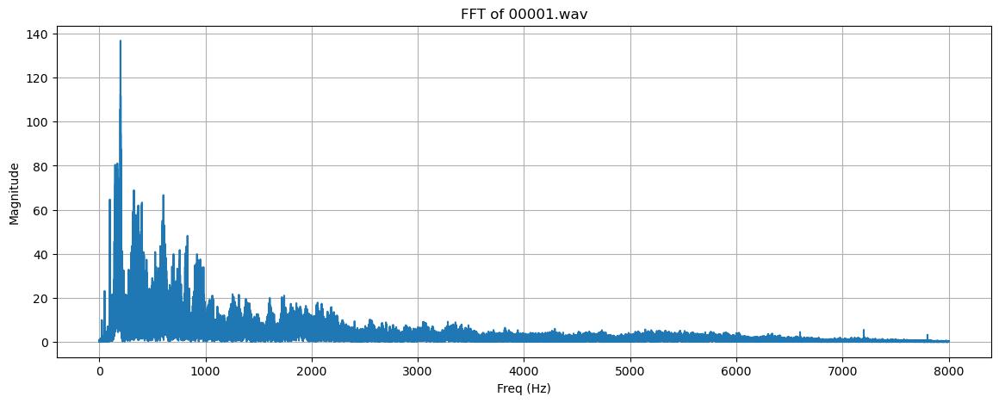

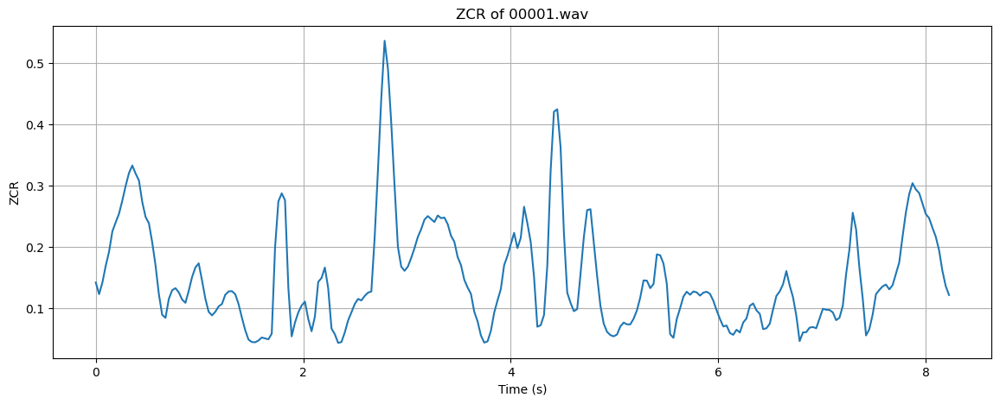

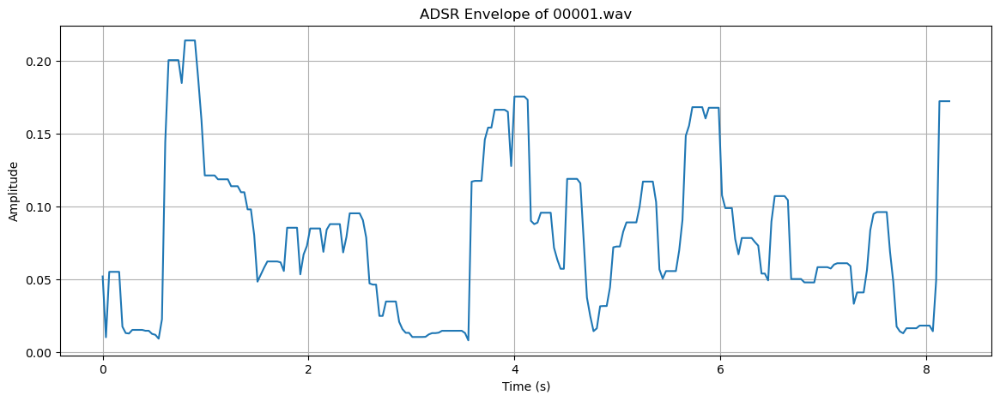

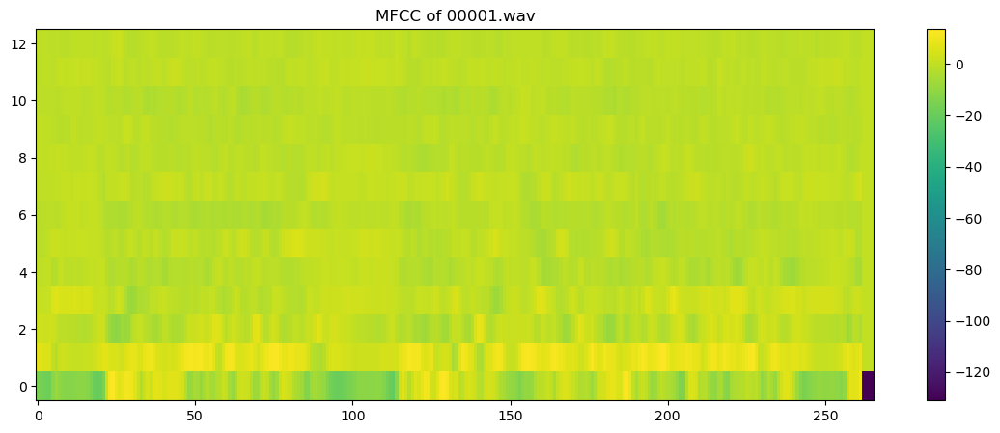

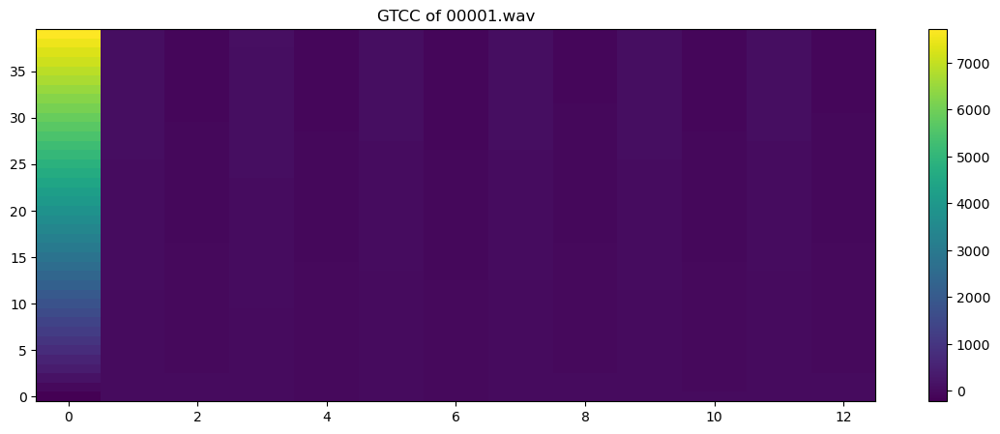

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00001.wav
	ZCR: [0.14208984 0.12304688 0.14208984 0.16943359 0.19238281 0.22558594
 0.24023438 0.25439453 0.27587891 0.29980469 0.32080078 0.33300781
 0.31982422 0.30859375 0.2734375  0.24902344 0.23876953 0.20751953
 0.16992188 0.12304688 0.08935547 0.08447266 0.11523438 0.12939453
 0.1328125  0.12597656 0.11425781 0.10888672 0.12841797 0.15087891
 0.16650391 0.17333984 0.14550781 0.11572266 0.09423828 0.08837891
 0.09423828 0.10302734 0.10693359 0.12207031 0.12744141 0.12792969
 0.12304688 0.10693359 0.08496094 0.06445312 0.04882812 0.04492188
 0.04443359 0.04736328 0.05224609 0.05078125 0.04931641 0.05859375
 0.19921875 0.27441406 0.28759766 0.27636719 0.13378906 0.05419922
 0.07666016 0.09326172 0.10449219 0.11083984 0.08251953 0.0625
 0.08642578 0.14306641 0.14941406 0.16650391 0.1328125  0.06689453
 0.05761719 0.04345703 0.04492188 0.06054688 0.08007812 0.09326172
 0.10693359 0.11523438 0.11279297 0.12011719 0.12548828 0.1274

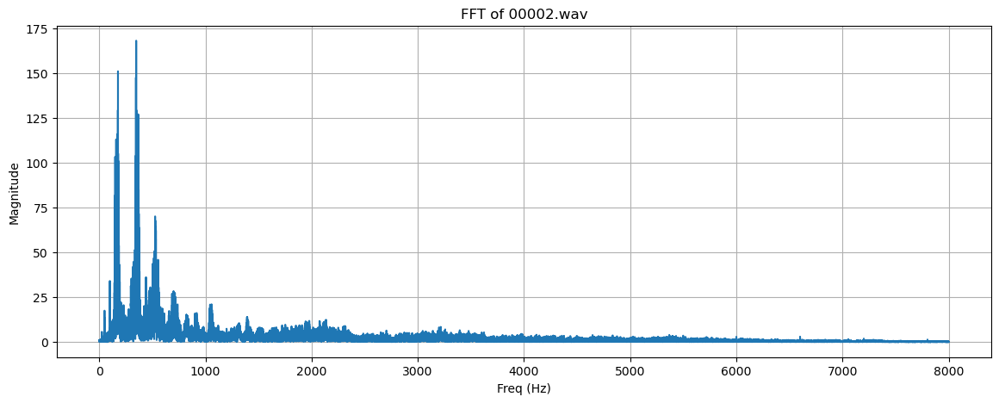

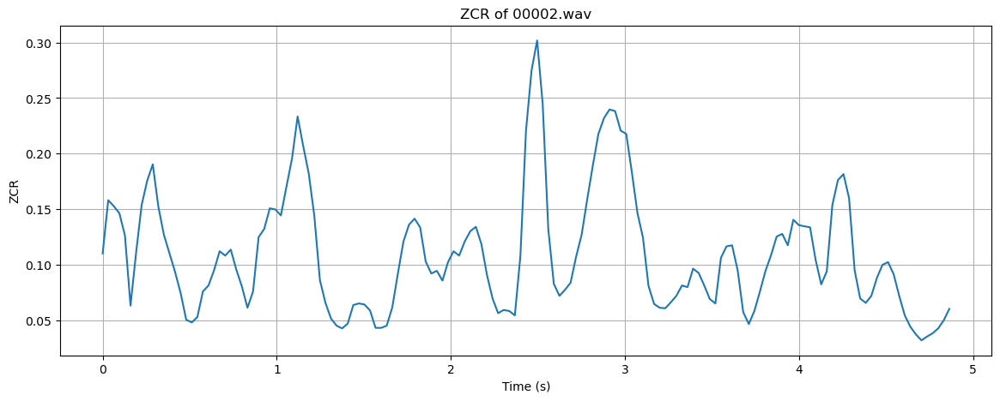

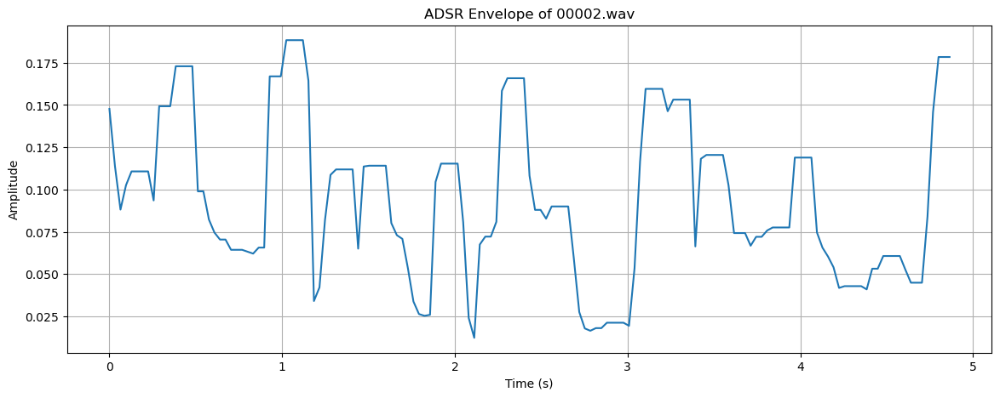

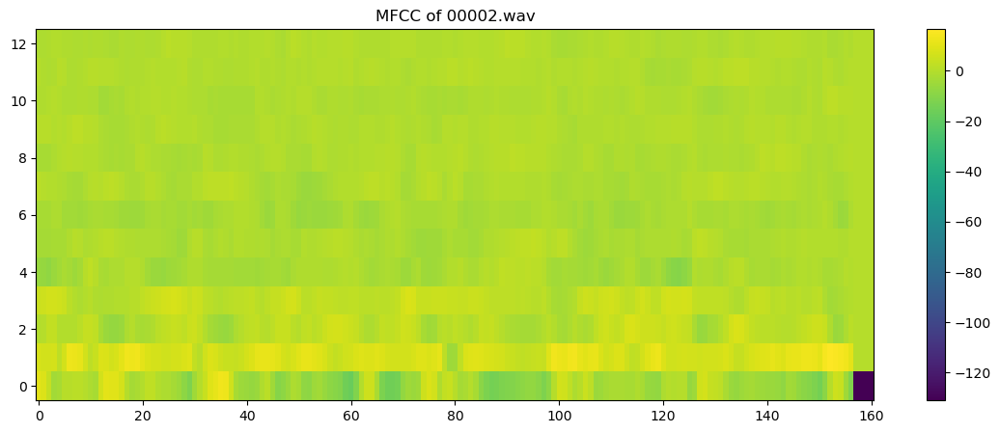

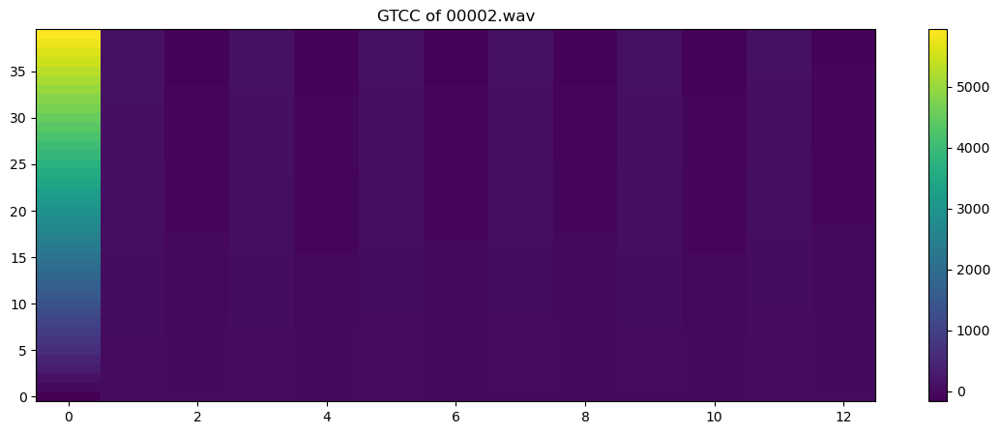

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00002.wav
	ZCR: [0.11035156 0.15820312 0.15283203 0.14648438 0.12646484 0.06347656
 0.11083984 0.15380859 0.17578125 0.19042969 0.15234375 0.12695312
 0.11035156 0.09375    0.07470703 0.05078125 0.04833984 0.05322266
 0.07617188 0.08154297 0.09521484 0.11230469 0.10839844 0.11376953
 0.09570312 0.08056641 0.06152344 0.07617188 0.125      0.13232422
 0.15087891 0.14990234 0.14453125 0.17041016 0.19580078 0.23339844
 0.20703125 0.18212891 0.14404297 0.08642578 0.06591797 0.05175781
 0.04541016 0.04296875 0.04736328 0.06396484 0.06542969 0.06445312
 0.05908203 0.04345703 0.04345703 0.04541016 0.06201172 0.09228516
 0.12109375 0.13623047 0.14160156 0.13378906 0.10302734 0.09228516
 0.09472656 0.0859375  0.10253906 0.11230469 0.10839844 0.12109375
 0.13037109 0.13427734 0.11865234 0.09082031 0.06982422 0.05664062
 0.05957031 0.05859375 0.0546875  0.10839844 0.22070312 0.27490234
 0.30175781 0.24462891 0.13232422 0.08300781 0.07226562 0.

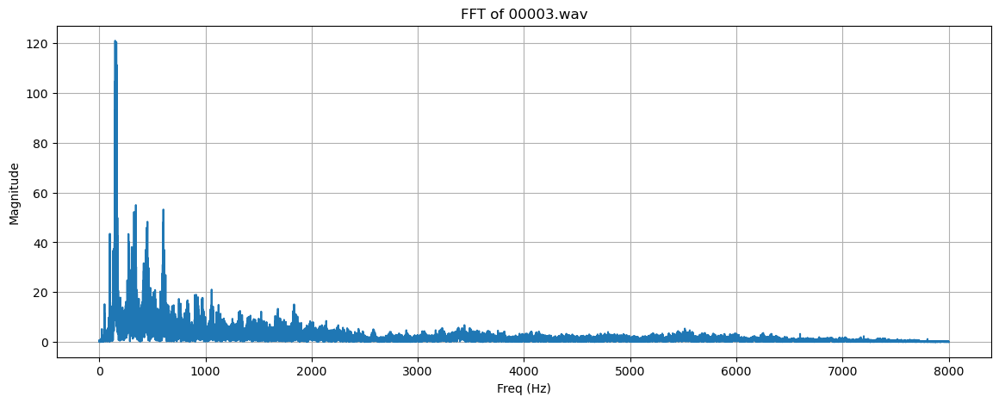

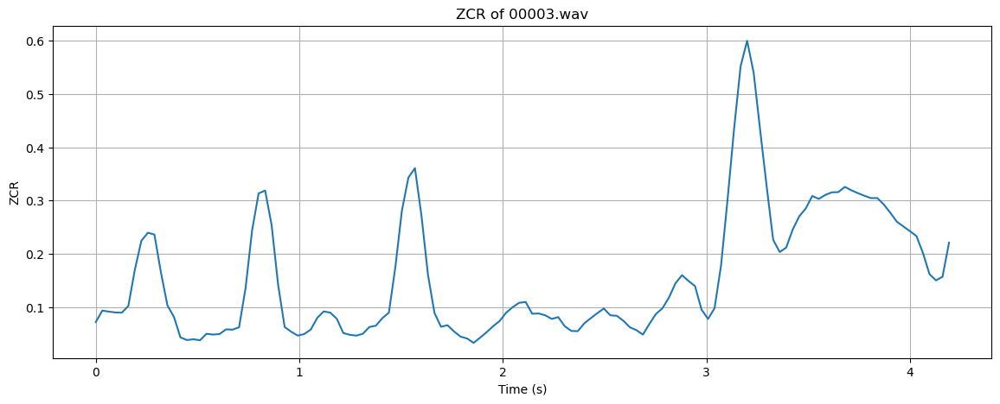

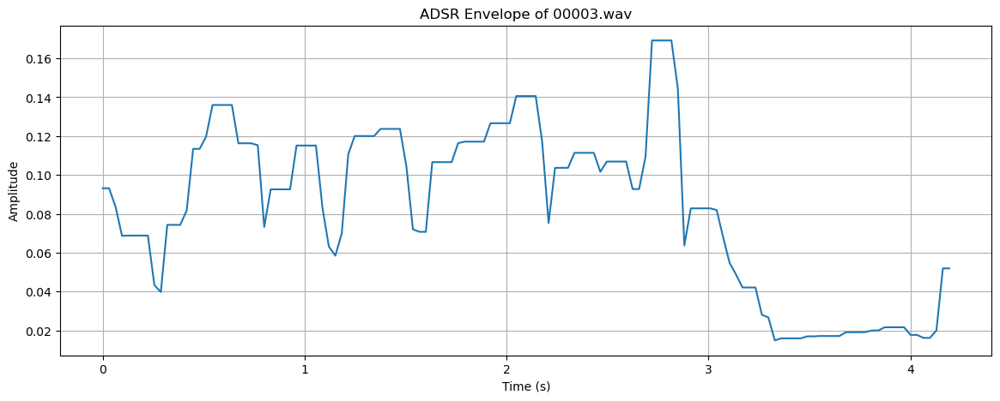

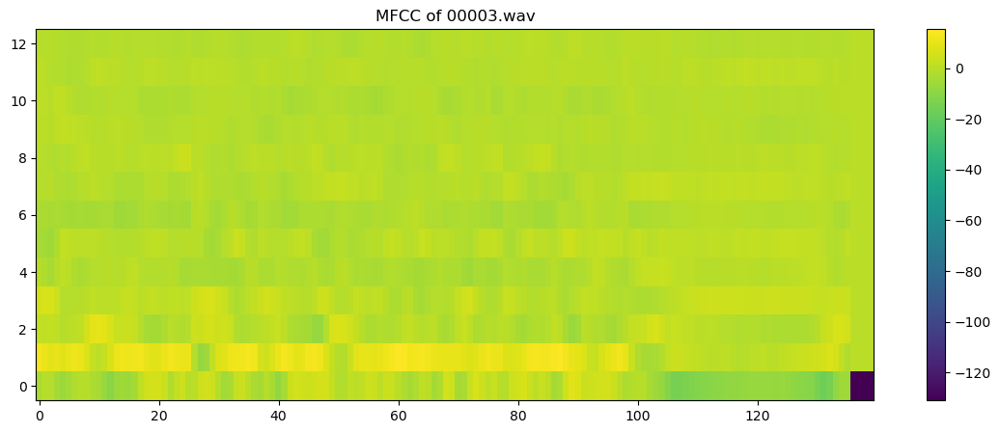

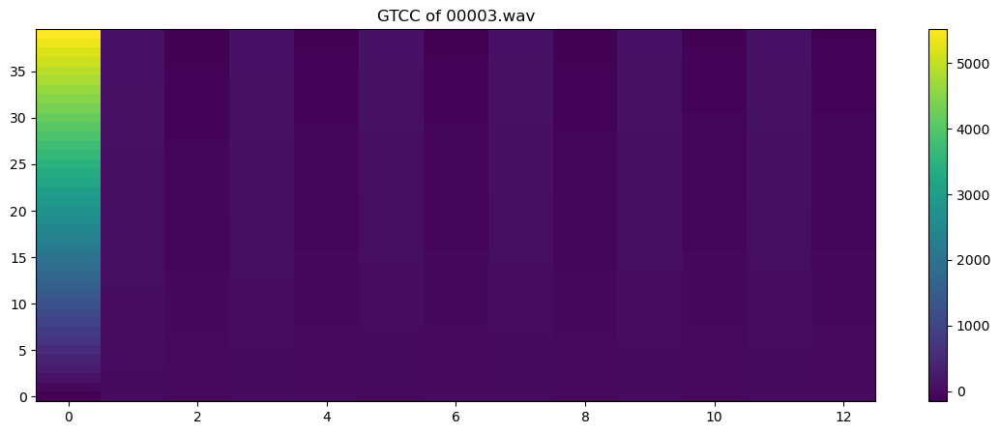

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00003.wav
	ZCR: [0.07226562 0.09375    0.09179688 0.09033203 0.08984375 0.10253906
 0.17041016 0.22460938 0.23974609 0.23632812 0.16552734 0.10351562
 0.08203125 0.04345703 0.03857422 0.04003906 0.03808594 0.05029297
 0.04882812 0.04980469 0.05859375 0.05810547 0.0625     0.13623047
 0.24414062 0.31347656 0.31884766 0.25390625 0.14160156 0.06298828
 0.05419922 0.046875   0.04980469 0.05810547 0.08007812 0.09228516
 0.08984375 0.07861328 0.05175781 0.04833984 0.046875   0.05029297
 0.06298828 0.06542969 0.07958984 0.08984375 0.17578125 0.28125
 0.34326172 0.36083984 0.27197266 0.16113281 0.08935547 0.06347656
 0.06640625 0.0546875  0.04492188 0.04150391 0.03320312 0.04296875
 0.05322266 0.06445312 0.07421875 0.08984375 0.10009766 0.10839844
 0.10986328 0.08789062 0.08837891 0.08496094 0.078125   0.08154297
 0.06445312 0.05566406 0.05517578 0.06982422 0.07958984 0.08886719
 0.09765625 0.08496094 0.08398438 0.07470703 0.0625     0.057

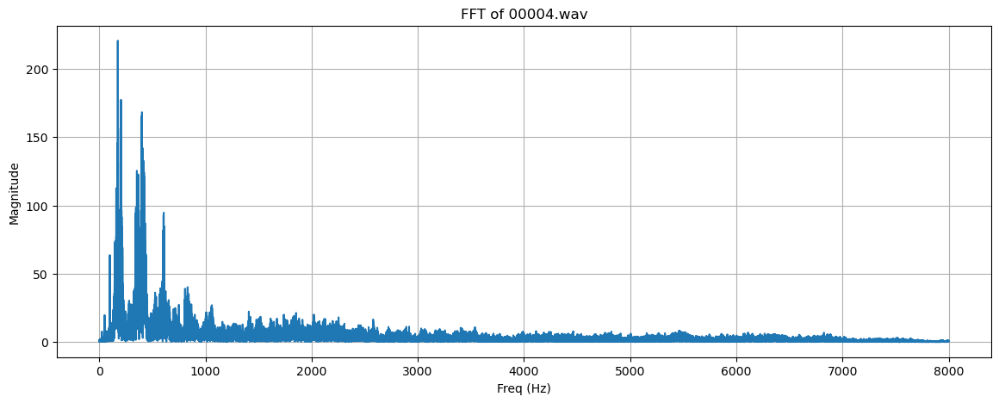

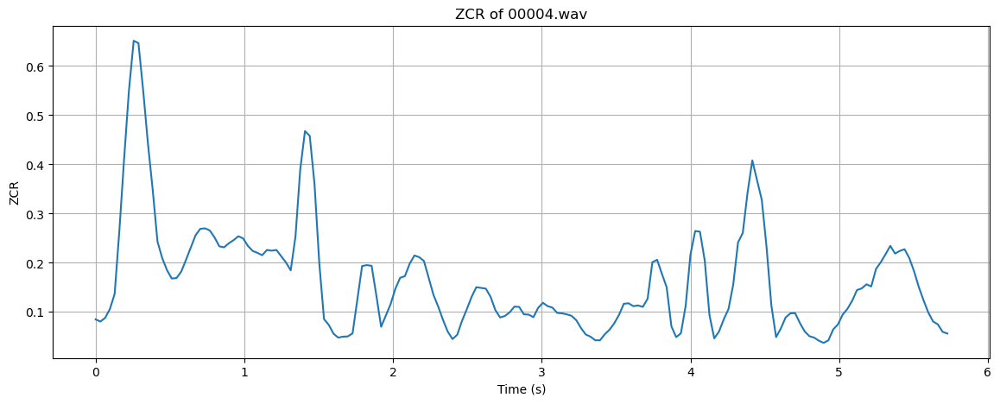

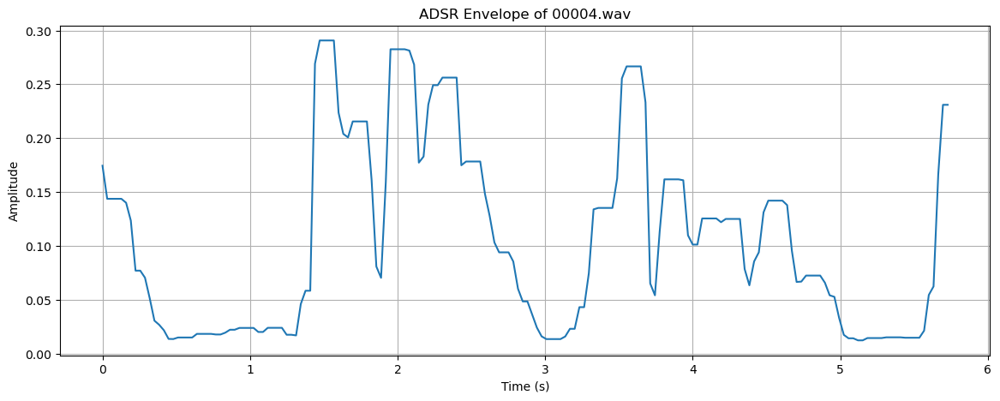

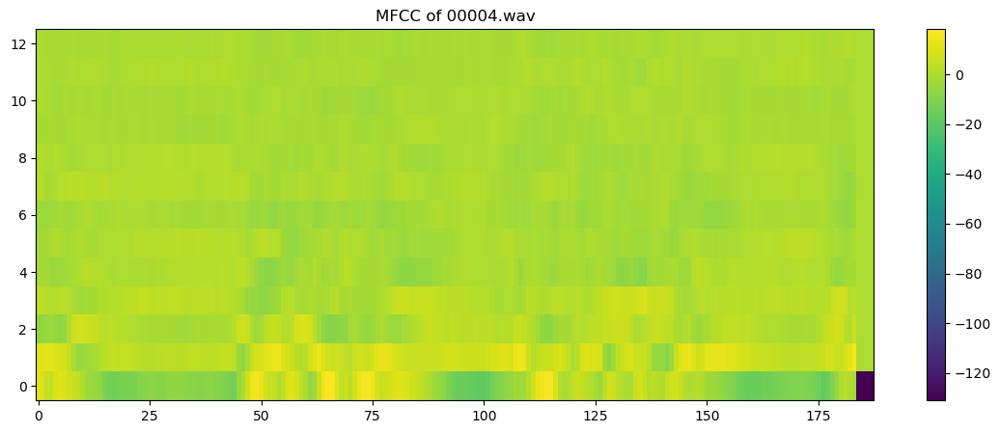

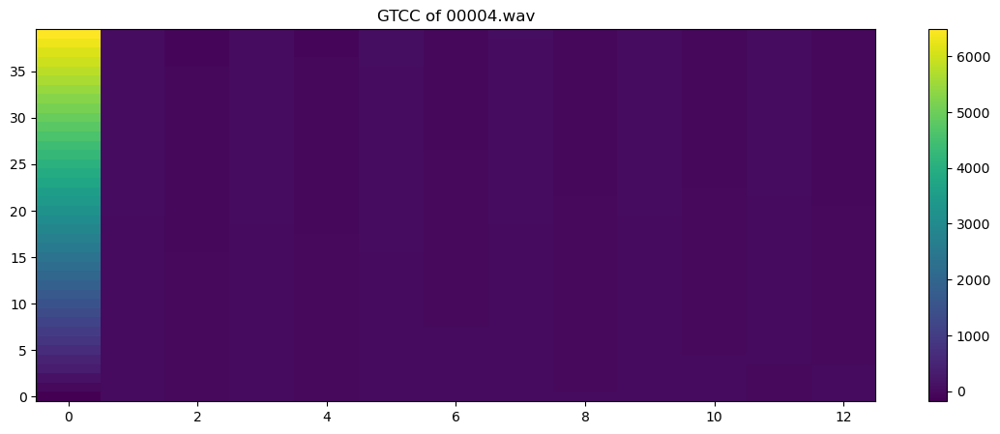

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00004.wav
	ZCR: [0.08496094 0.08056641 0.08789062 0.10595703 0.13671875 0.26660156
 0.41308594 0.54980469 0.65136719 0.64648438 0.54980469 0.44189453
 0.34814453 0.24316406 0.20947266 0.18505859 0.16796875 0.16894531
 0.18212891 0.20605469 0.23095703 0.25585938 0.26904297 0.27001953
 0.265625   0.25146484 0.23339844 0.23144531 0.23974609 0.24609375
 0.25390625 0.24951172 0.234375   0.22412109 0.22021484 0.21533203
 0.22607422 0.22460938 0.22607422 0.21337891 0.20068359 0.18457031
 0.25341797 0.38964844 0.46777344 0.45800781 0.36035156 0.19970703
 0.08544922 0.07373047 0.05566406 0.04785156 0.04980469 0.05029297
 0.05664062 0.12451172 0.19335938 0.1953125  0.19384766 0.13330078
 0.06982422 0.09277344 0.11621094 0.14746094 0.16943359 0.17285156
 0.19824219 0.21484375 0.21142578 0.20361328 0.16943359 0.13476562
 0.11083984 0.08398438 0.06005859 0.04492188 0.05371094 0.08203125
 0.10546875 0.13037109 0.15039062 0.14892578 0.14746094 0.

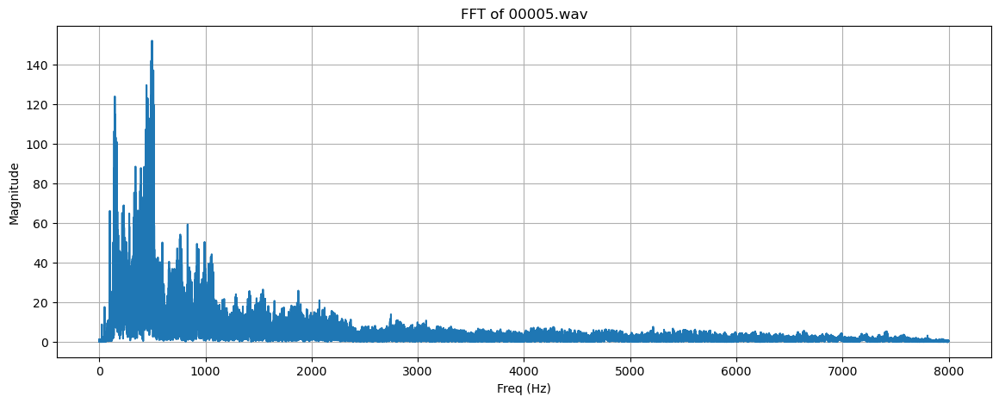

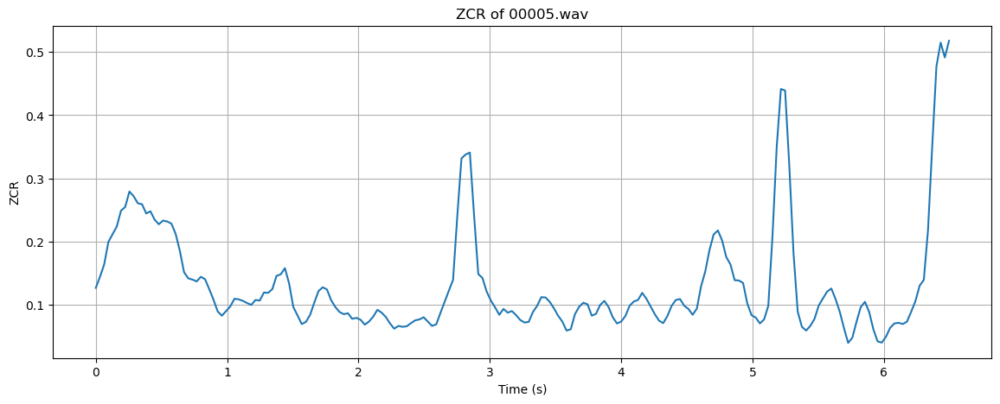

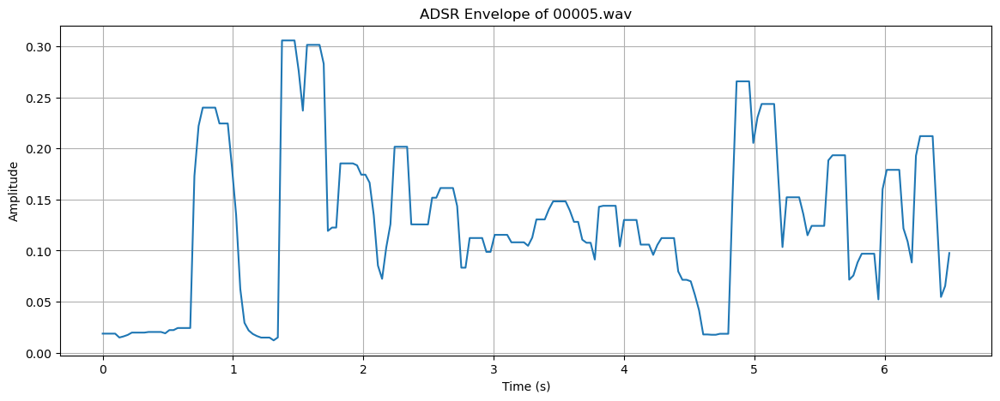

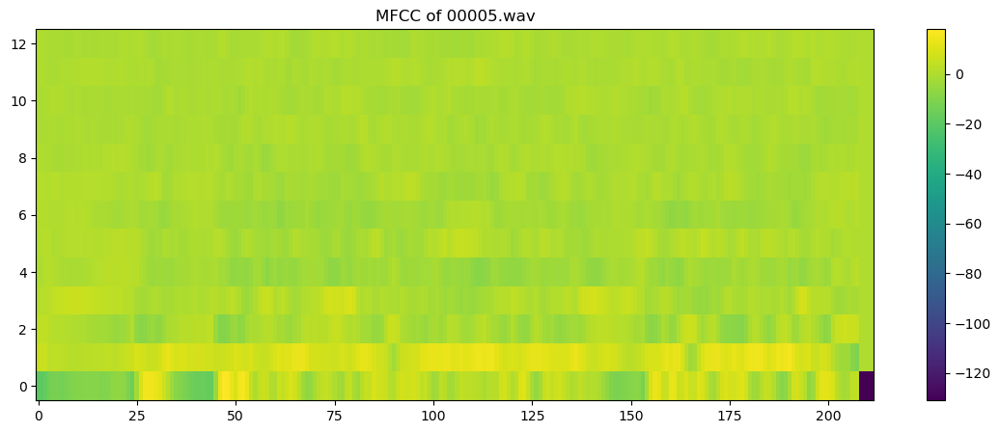

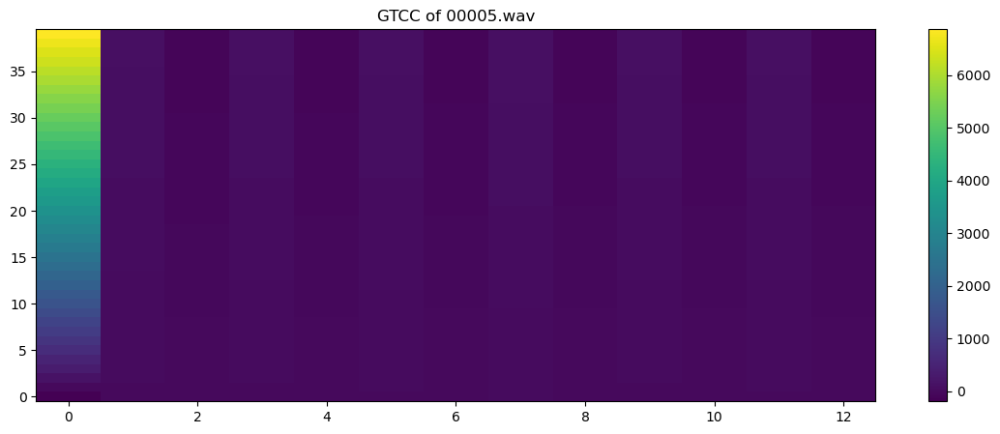

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00005.wav
	ZCR: [0.12695312 0.14453125 0.1640625  0.19970703 0.21191406 0.22412109
 0.24902344 0.25488281 0.27929688 0.27197266 0.26074219 0.25927734
 0.24462891 0.24804688 0.23486328 0.22753906 0.23339844 0.23193359
 0.22851562 0.21240234 0.18554688 0.15185547 0.14208984 0.14013672
 0.13720703 0.14453125 0.140625   0.125      0.10839844 0.08984375
 0.08300781 0.09033203 0.09765625 0.10986328 0.10888672 0.10644531
 0.10302734 0.10009766 0.10791016 0.10693359 0.11962891 0.11914062
 0.125      0.14599609 0.1484375  0.15820312 0.13378906 0.09667969
 0.08349609 0.06982422 0.07324219 0.08447266 0.10400391 0.12207031
 0.12792969 0.12451172 0.10742188 0.09667969 0.08886719 0.08544922
 0.08691406 0.078125   0.07958984 0.07666016 0.06884766 0.07373047
 0.08154297 0.09228516 0.08789062 0.08105469 0.07080078 0.0625
 0.06689453 0.06542969 0.06640625 0.07128906 0.07568359 0.07714844
 0.08056641 0.07373047 0.06689453 0.06933594 0.08740234 0.1049

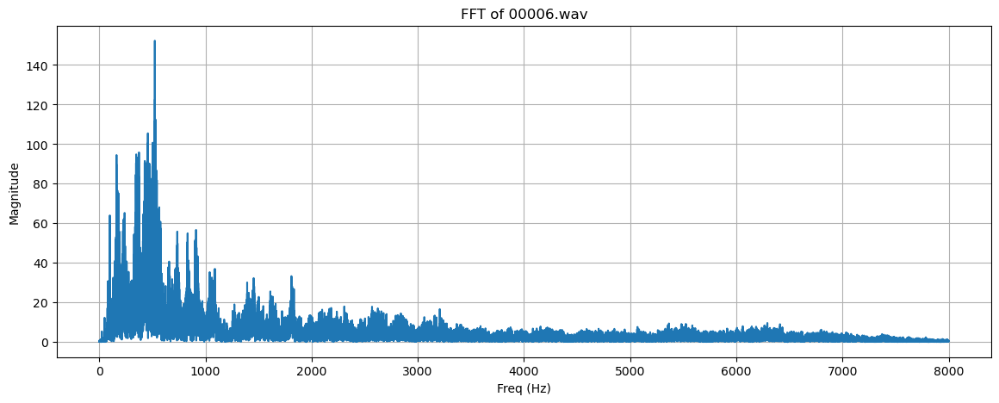

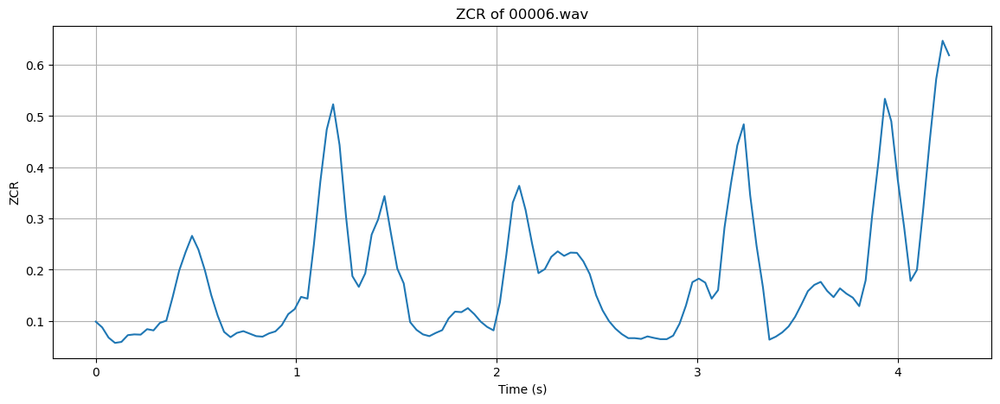

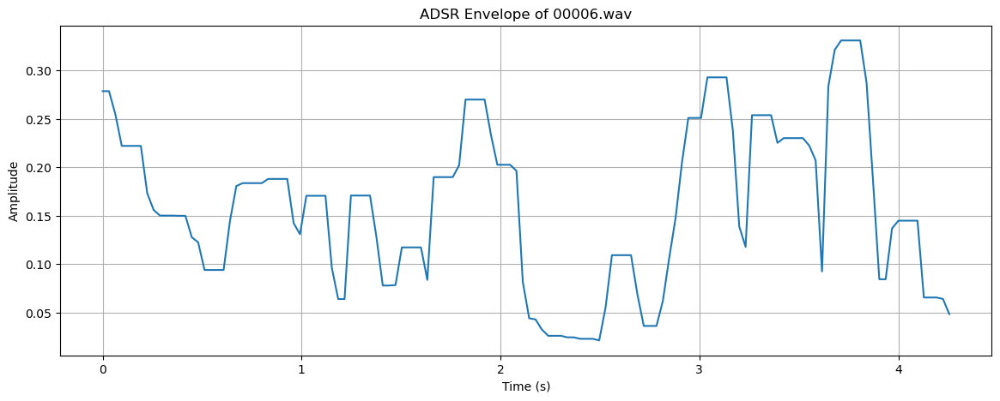

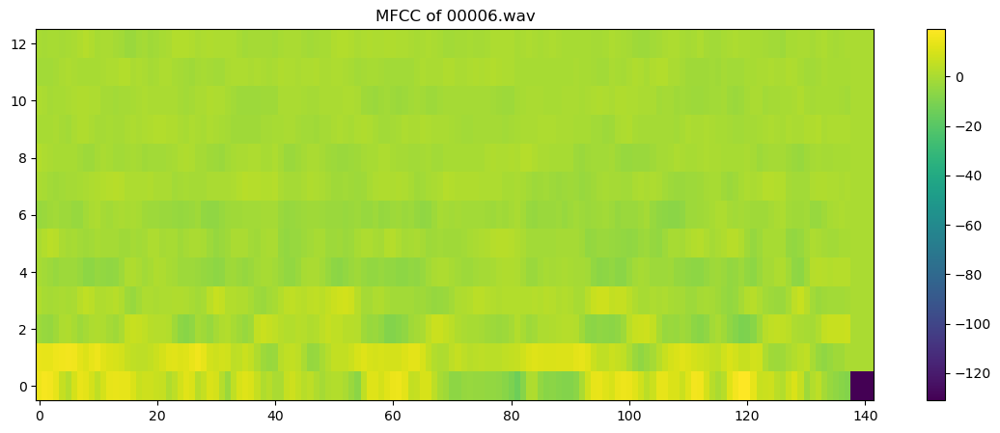

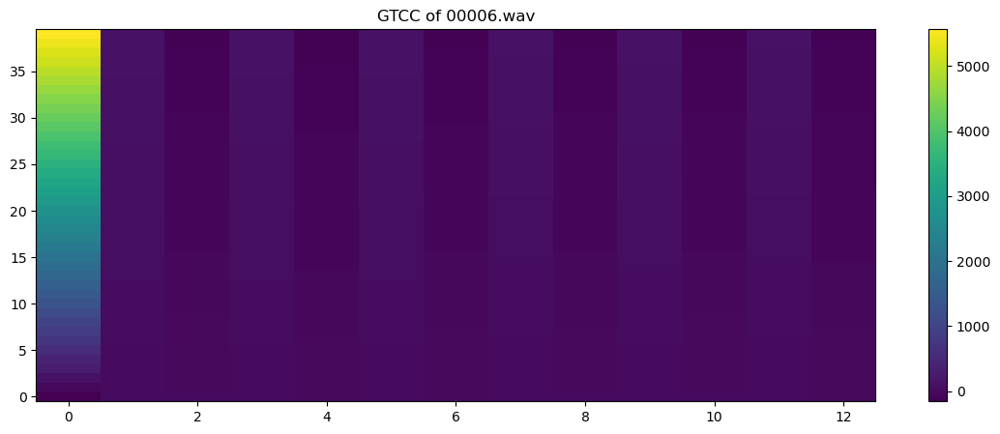

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00006.wav
	ZCR: [0.09863281 0.08740234 0.06738281 0.05712891 0.05908203 0.07226562
 0.07373047 0.07324219 0.08398438 0.08154297 0.09619141 0.10058594
 0.14746094 0.19824219 0.234375   0.26611328 0.23925781 0.19921875
 0.15039062 0.11035156 0.07861328 0.06835938 0.07666016 0.08007812
 0.07519531 0.0703125  0.06933594 0.07568359 0.07958984 0.09179688
 0.11328125 0.12304688 0.14697266 0.14355469 0.24951172 0.37158203
 0.47363281 0.52294922 0.44335938 0.3046875  0.1875     0.16650391
 0.19287109 0.26855469 0.29785156 0.34375    0.27148438 0.20214844
 0.17333984 0.09765625 0.08251953 0.07373047 0.0703125  0.07666016
 0.08203125 0.10498047 0.11816406 0.1171875  0.125      0.11328125
 0.09863281 0.08837891 0.08154297 0.13671875 0.22949219 0.33105469
 0.36376953 0.31640625 0.25146484 0.19335938 0.20117188 0.22509766
 0.23583984 0.22705078 0.23339844 0.23291016 0.21630859 0.19140625
 0.14990234 0.12060547 0.09960938 0.08496094 0.07421875 0.

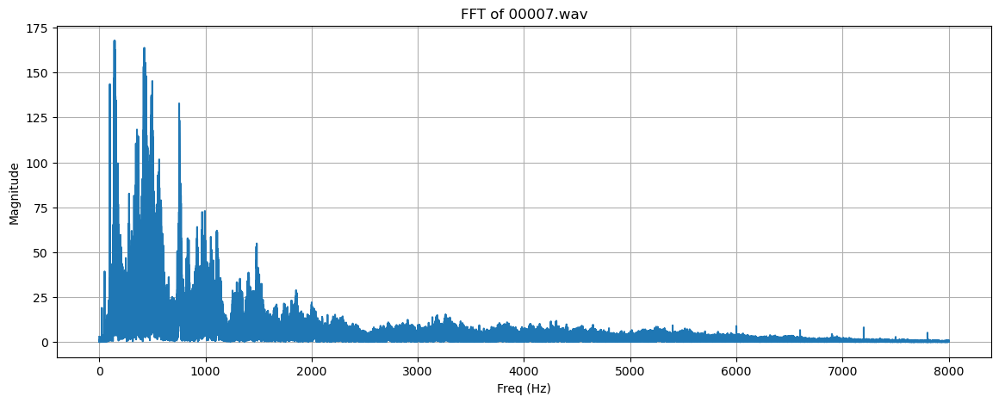

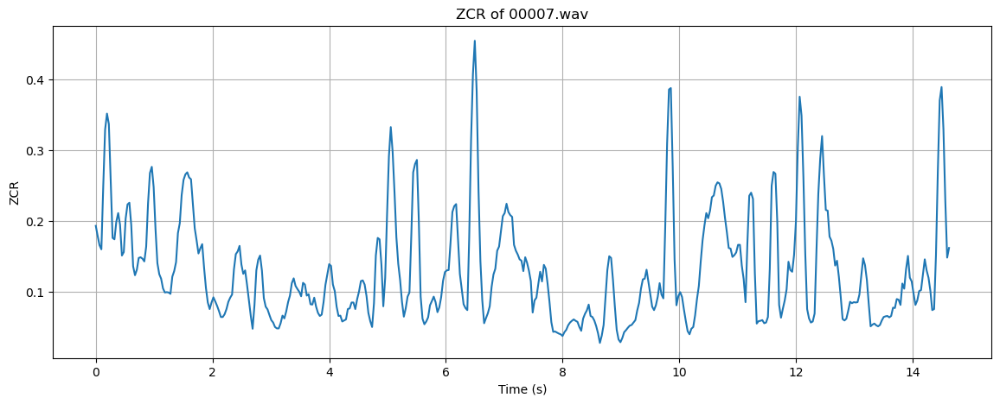

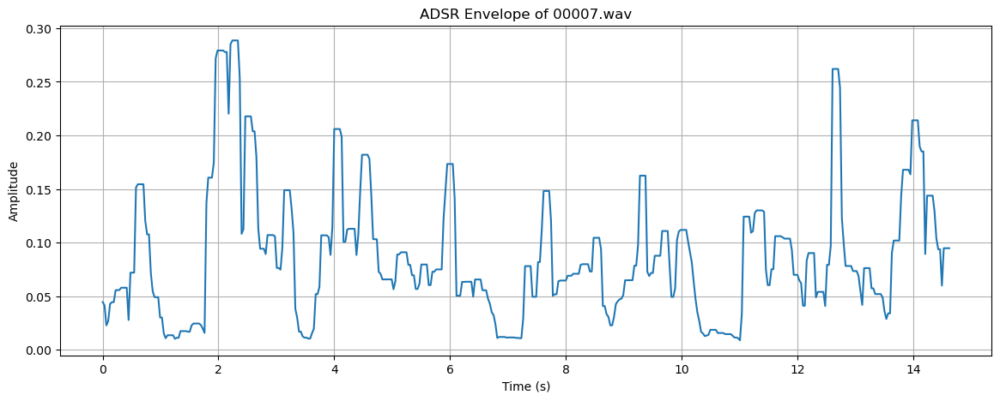

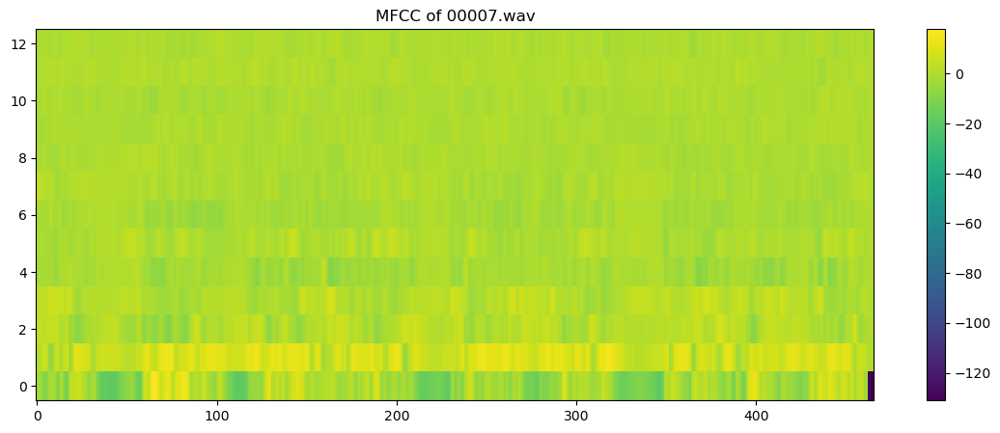

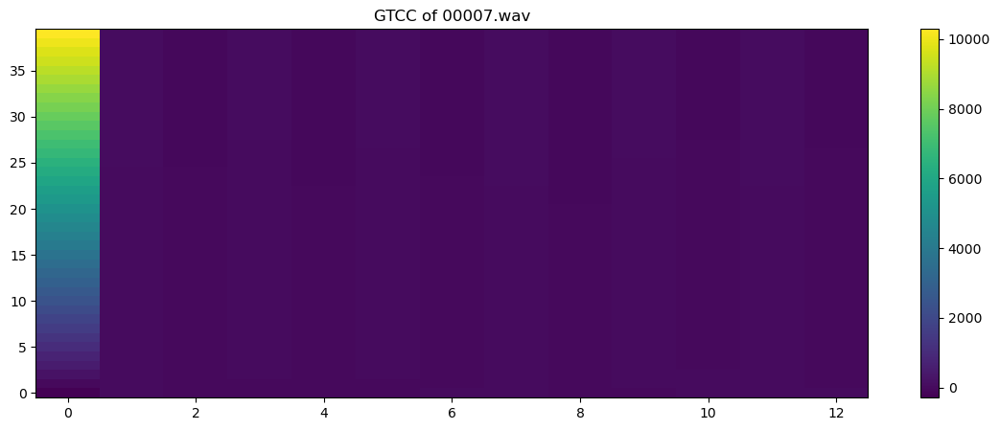

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00007.wav
	ZCR: [0.19335938 0.17919922 0.16601562 0.16015625 0.24951172 0.32958984
 0.35205078 0.33740234 0.25732422 0.17626953 0.17431641 0.19921875
 0.21142578 0.19482422 0.15136719 0.15625    0.20361328 0.22363281
 0.22607422 0.19433594 0.13623047 0.12353516 0.13134766 0.14794922
 0.14892578 0.14697266 0.14306641 0.1640625  0.22558594 0.26806641
 0.27685547 0.24804688 0.18847656 0.140625   0.125      0.11865234
 0.10498047 0.09912109 0.09960938 0.09912109 0.09716797 0.12158203
 0.12939453 0.14208984 0.18310547 0.19726562 0.23681641 0.25830078
 0.26611328 0.26904297 0.26171875 0.25927734 0.22509766 0.18994141
 0.17285156 0.15429688 0.16162109 0.16748047 0.13427734 0.10546875
 0.08496094 0.07568359 0.08496094 0.09228516 0.08642578 0.08007812
 0.07275391 0.06445312 0.06445312 0.06835938 0.07568359 0.0859375
 0.09179688 0.09619141 0.13183594 0.15332031 0.15722656 0.16503906
 0.13867188 0.12548828 0.13037109 0.11035156 0.08886719 0.0

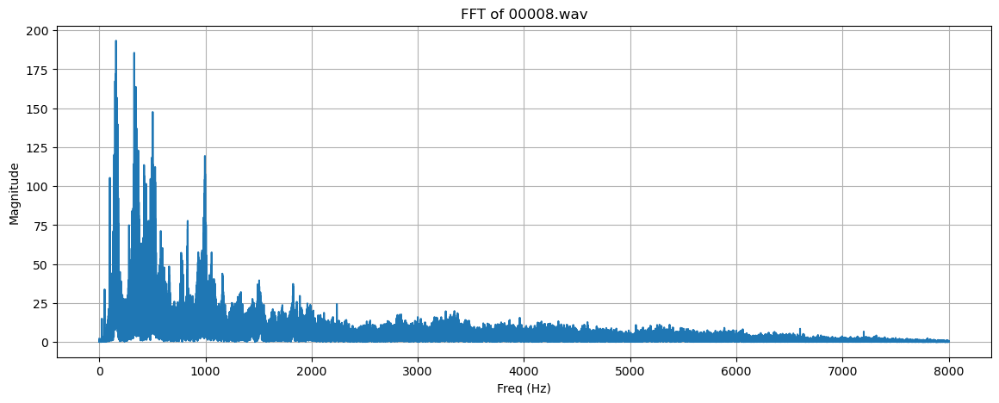

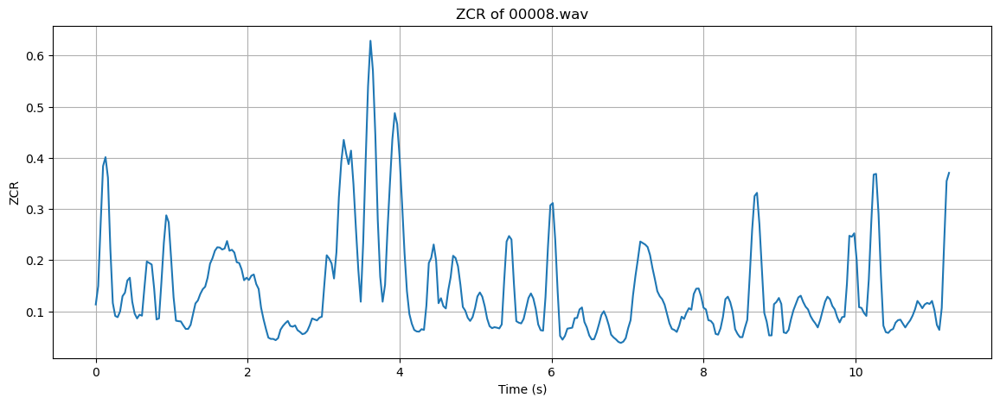

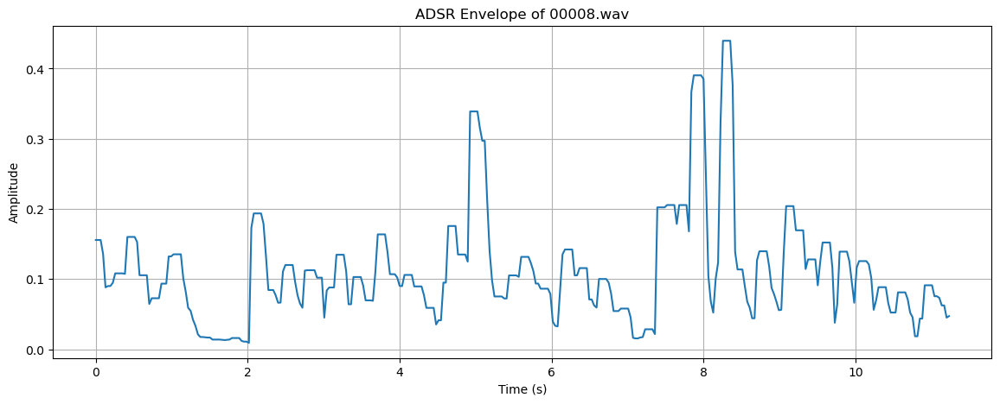

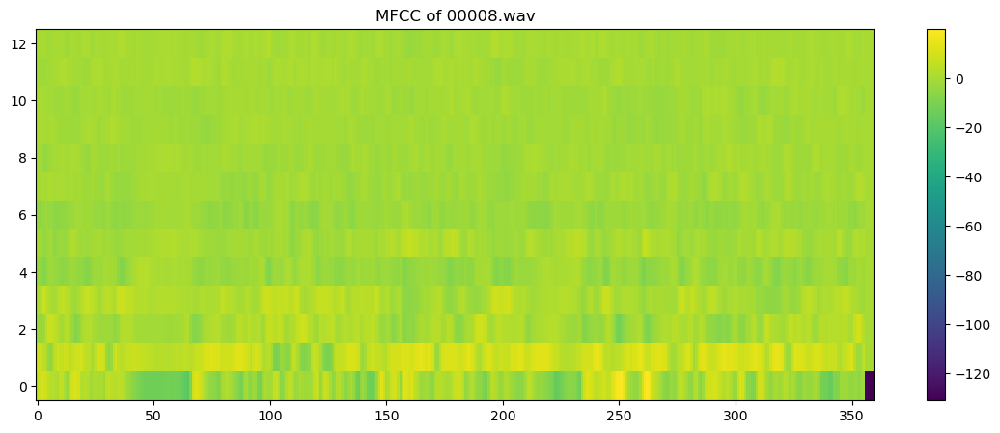

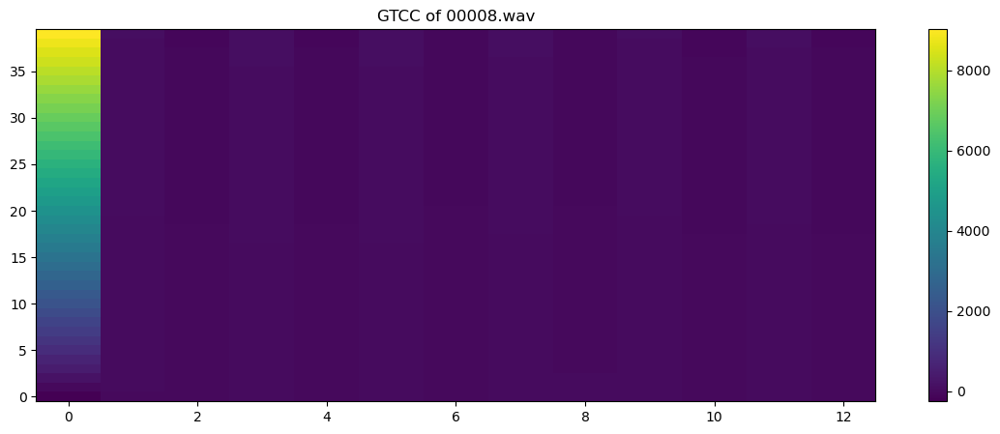

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00008.wav
	ZCR: [0.11328125 0.14941406 0.27099609 0.38378906 0.40136719 0.36132812
 0.22167969 0.11621094 0.09082031 0.08837891 0.09960938 0.12939453
 0.13623047 0.16015625 0.16552734 0.11865234 0.09521484 0.0859375
 0.09326172 0.09130859 0.14550781 0.19726562 0.19433594 0.19140625
 0.14501953 0.08398438 0.0859375  0.15673828 0.23388672 0.28759766
 0.27392578 0.20263672 0.12744141 0.08154297 0.08056641 0.08007812
 0.07226562 0.06542969 0.06542969 0.07324219 0.09423828 0.11523438
 0.12109375 0.13378906 0.14306641 0.14794922 0.16552734 0.19287109
 0.20361328 0.21826172 0.22509766 0.22460938 0.22070312 0.22265625
 0.23730469 0.21826172 0.22021484 0.21484375 0.19580078 0.19433594
 0.18164062 0.16064453 0.16552734 0.16113281 0.16943359 0.171875
 0.15332031 0.14355469 0.10693359 0.08447266 0.06542969 0.04833984
 0.04589844 0.04589844 0.04345703 0.04736328 0.06396484 0.07128906
 0.07666016 0.08105469 0.07128906 0.06982422 0.07226562 0.062

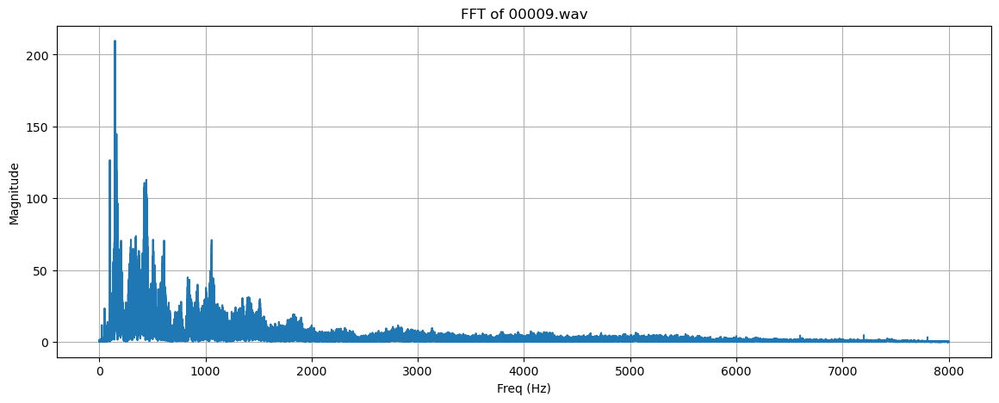

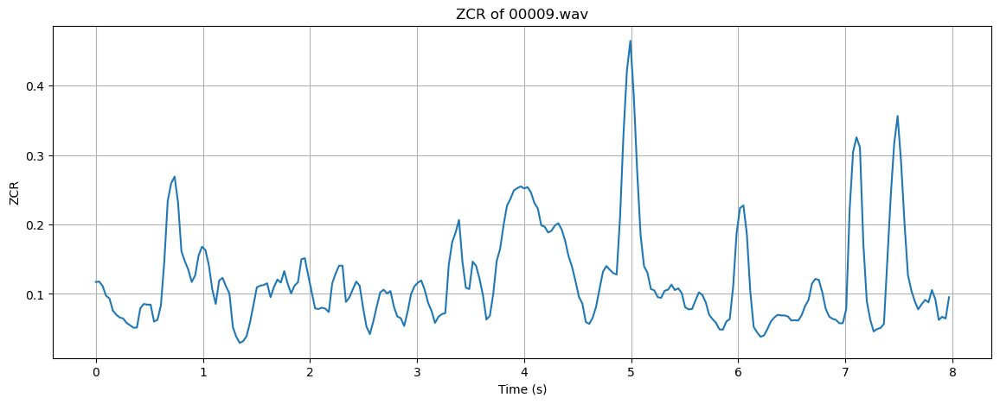

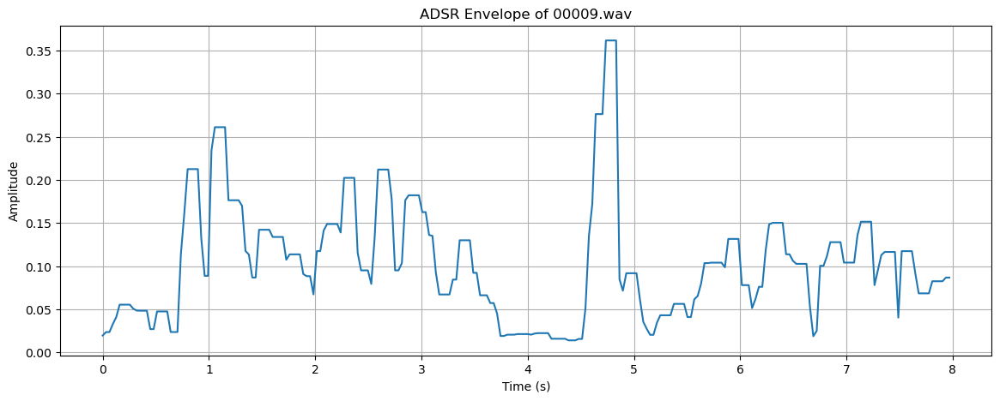

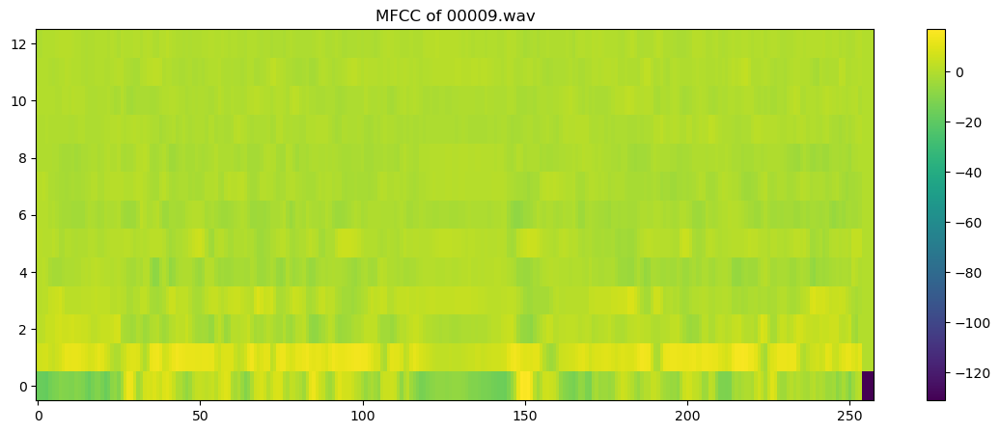

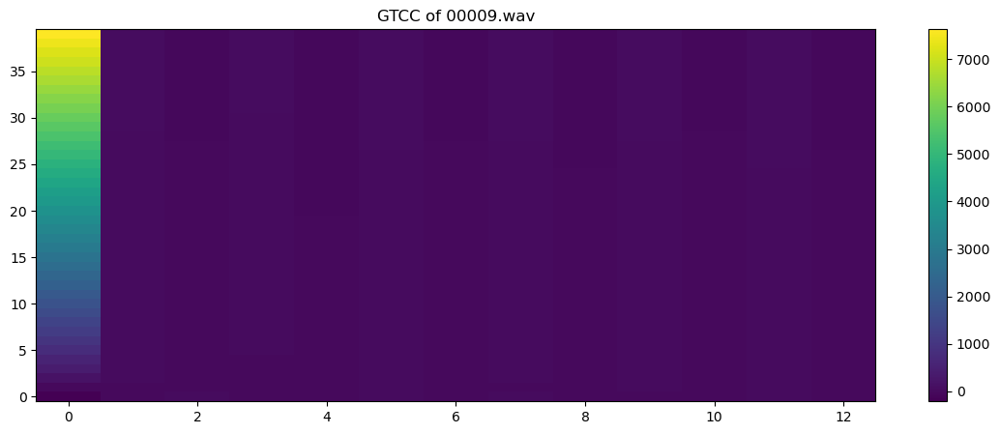

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00009.wav
	ZCR: [0.1171875  0.11767578 0.11132812 0.09716797 0.09326172 0.07568359
 0.06982422 0.06591797 0.06445312 0.05810547 0.0546875  0.05126953
 0.05126953 0.07910156 0.08544922 0.08447266 0.08447266 0.06005859
 0.0625     0.08349609 0.14697266 0.234375   0.25927734 0.26904297
 0.23193359 0.16113281 0.14697266 0.13476562 0.1171875  0.12646484
 0.15527344 0.16796875 0.16308594 0.14111328 0.10644531 0.08544922
 0.11914062 0.12304688 0.11083984 0.10058594 0.05224609 0.03808594
 0.02929688 0.03173828 0.0390625  0.05859375 0.08349609 0.109375
 0.11181641 0.11279297 0.11523438 0.09521484 0.10986328 0.12060547
 0.11621094 0.1328125  0.11474609 0.10058594 0.11181641 0.11669922
 0.14990234 0.15136719 0.12646484 0.10302734 0.07910156 0.078125
 0.08007812 0.07861328 0.07373047 0.11523438 0.12939453 0.140625
 0.140625   0.08837891 0.09472656 0.10644531 0.11767578 0.11181641
 0.08007812 0.05273438 0.04199219 0.06054688 0.08203125 0.102050

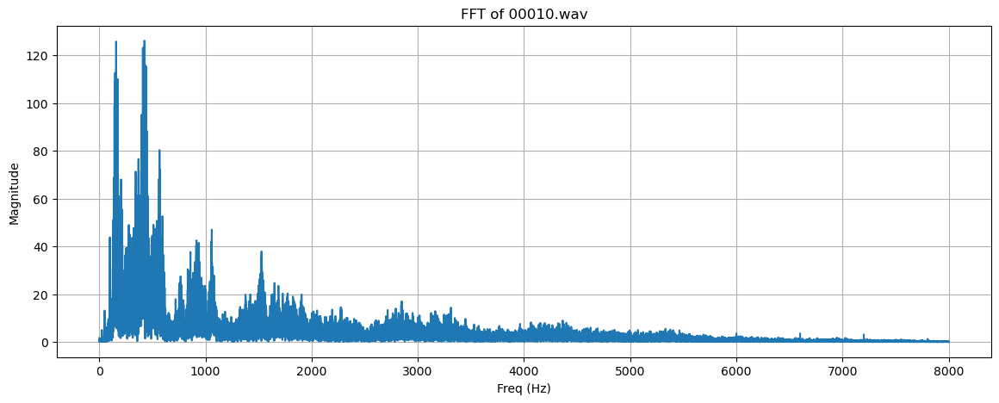

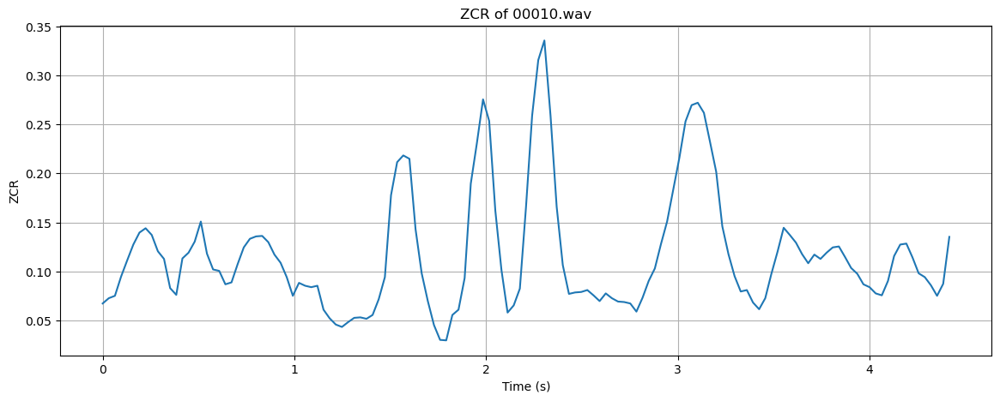

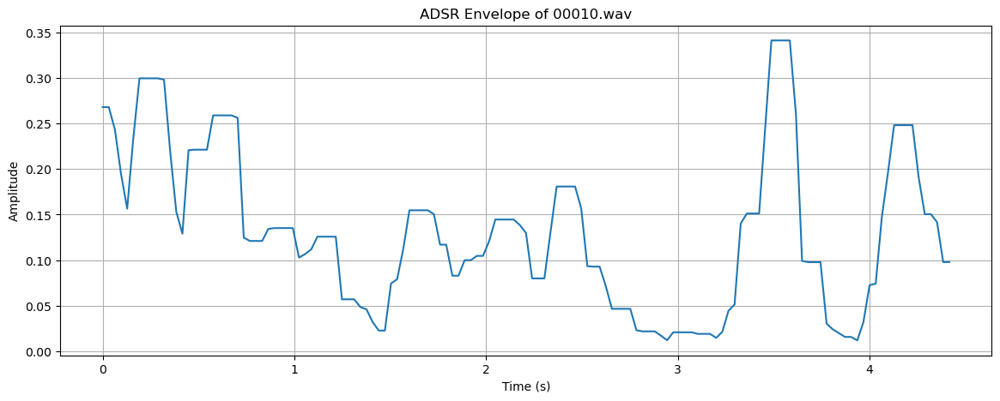

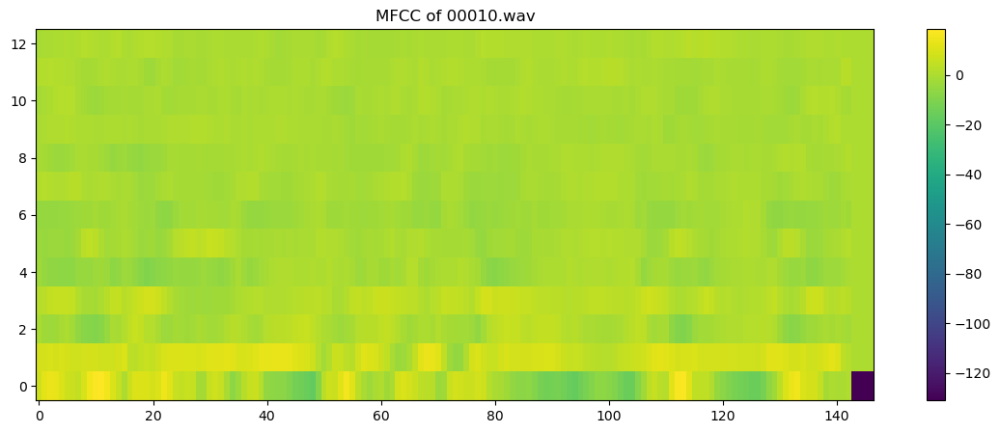

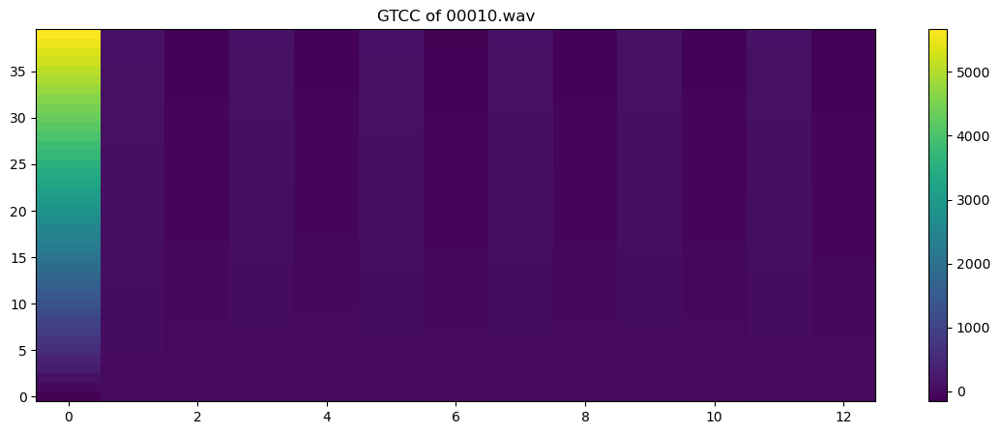

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00010.wav
	ZCR: [0.06738281 0.07275391 0.07519531 0.09472656 0.11132812 0.12744141
 0.13964844 0.14404297 0.13720703 0.12060547 0.11279297 0.08300781
 0.07617188 0.11328125 0.11914062 0.13037109 0.15087891 0.11816406
 0.10205078 0.10058594 0.08691406 0.08886719 0.10742188 0.12451172
 0.13330078 0.13574219 0.13623047 0.12988281 0.1171875  0.10888672
 0.09423828 0.07519531 0.08837891 0.08544922 0.08398438 0.08544922
 0.06103516 0.05224609 0.04589844 0.04345703 0.04833984 0.05273438
 0.05322266 0.05175781 0.05566406 0.07177734 0.09423828 0.17773438
 0.21142578 0.21826172 0.21484375 0.14306641 0.09814453 0.06982422
 0.04541016 0.03027344 0.02978516 0.05566406 0.06103516 0.09326172
 0.18945312 0.23095703 0.27539062 0.25341797 0.16210938 0.1015625
 0.05810547 0.06542969 0.08251953 0.16552734 0.25878906 0.31542969
 0.33544922 0.25878906 0.16601562 0.10644531 0.07714844 0.07861328
 0.07910156 0.08105469 0.07568359 0.06982422 0.07763672 0.0

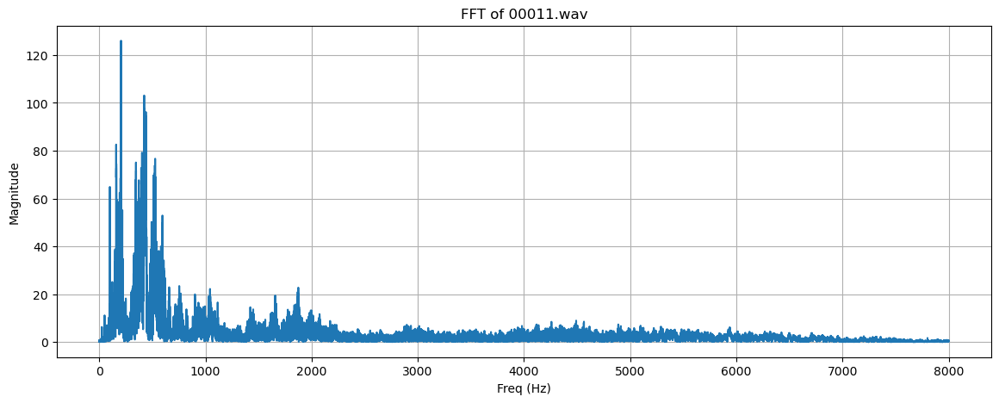

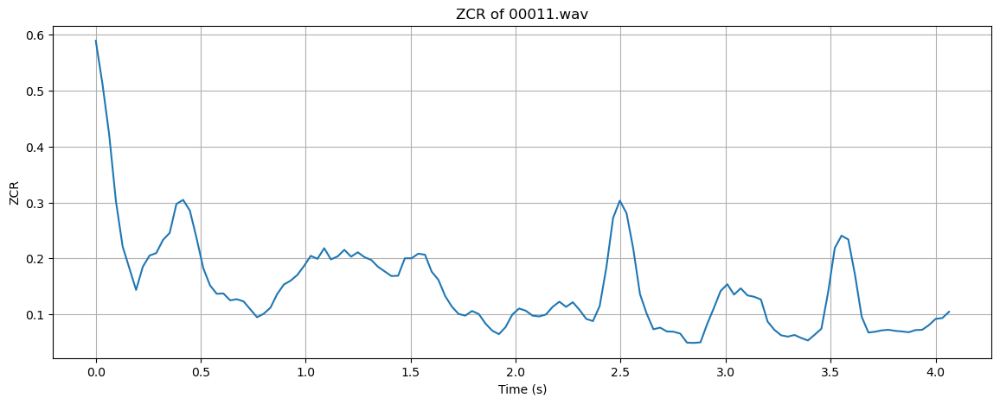

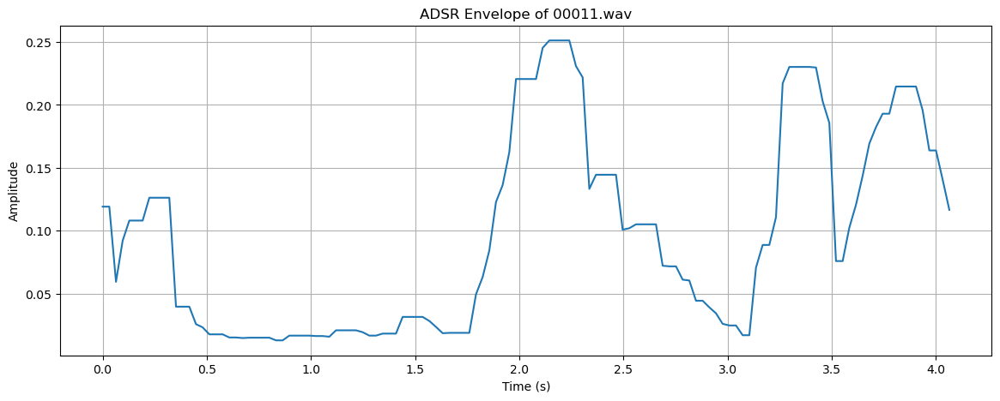

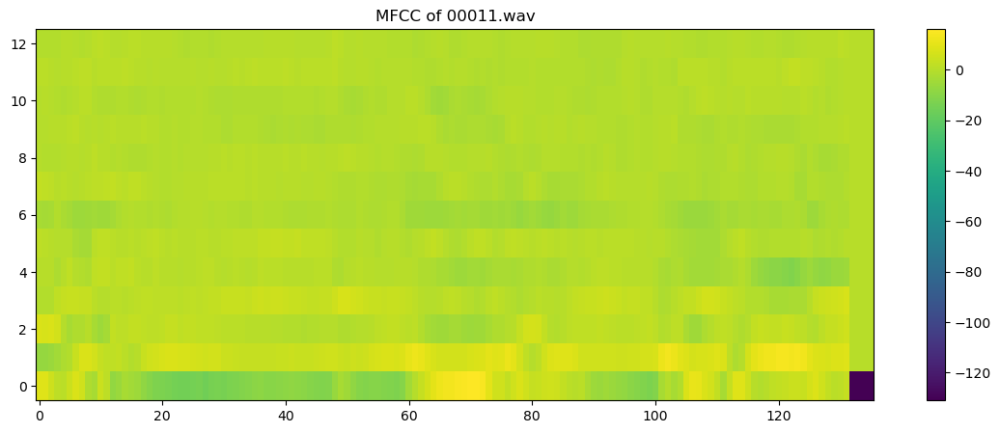

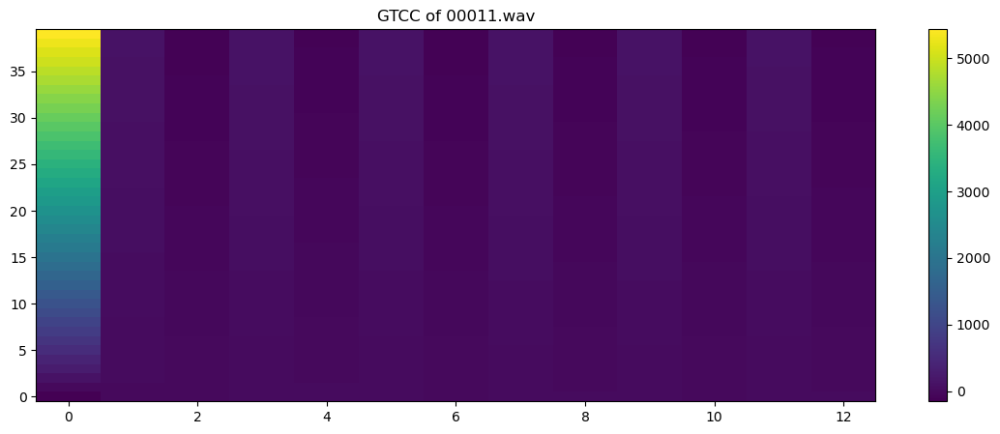

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00011.wav
	ZCR: [0.58935547 0.51171875 0.42089844 0.30224609 0.22119141 0.18261719
 0.14355469 0.18505859 0.20507812 0.20947266 0.23291016 0.24560547
 0.29736328 0.3046875  0.28564453 0.23632812 0.18261719 0.15185547
 0.13671875 0.13720703 0.125      0.12695312 0.12304688 0.10888672
 0.09472656 0.10107422 0.11181641 0.13623047 0.15332031 0.16015625
 0.17041016 0.18652344 0.20458984 0.19921875 0.21826172 0.19824219
 0.20361328 0.21533203 0.203125   0.2109375  0.20214844 0.19726562
 0.18505859 0.17675781 0.16845703 0.16894531 0.20019531 0.20019531
 0.20849609 0.20654297 0.17626953 0.16162109 0.1328125  0.11376953
 0.10058594 0.09765625 0.10595703 0.10058594 0.08349609 0.07080078
 0.06445312 0.07714844 0.09960938 0.11035156 0.10644531 0.09765625
 0.09619141 0.09960938 0.11328125 0.12255859 0.11328125 0.12158203
 0.10791016 0.09179688 0.08789062 0.11474609 0.18408203 0.27246094
 0.30322266 0.28076172 0.21728516 0.13623047 0.10107422 0.

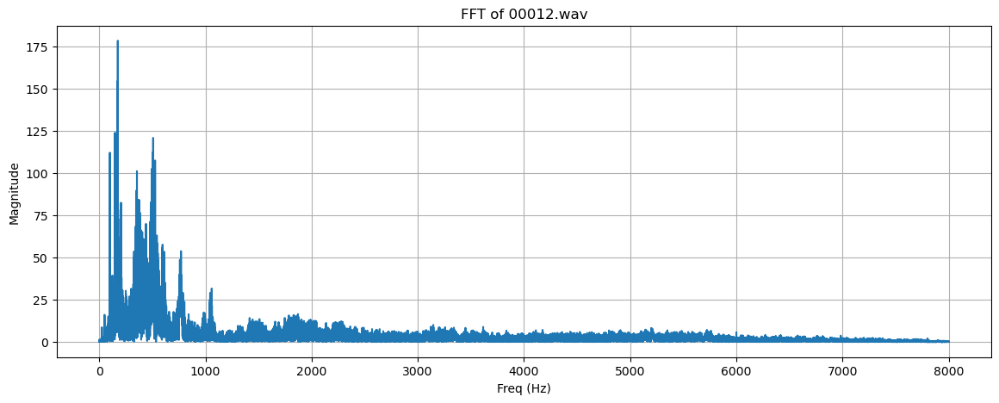

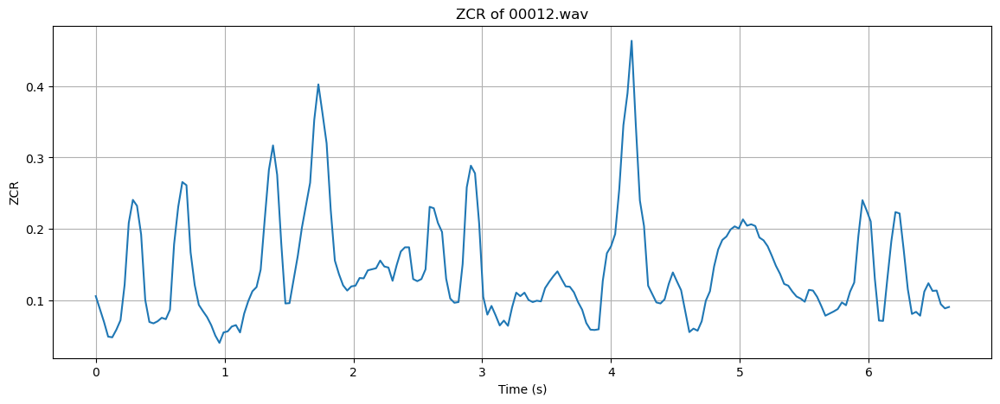

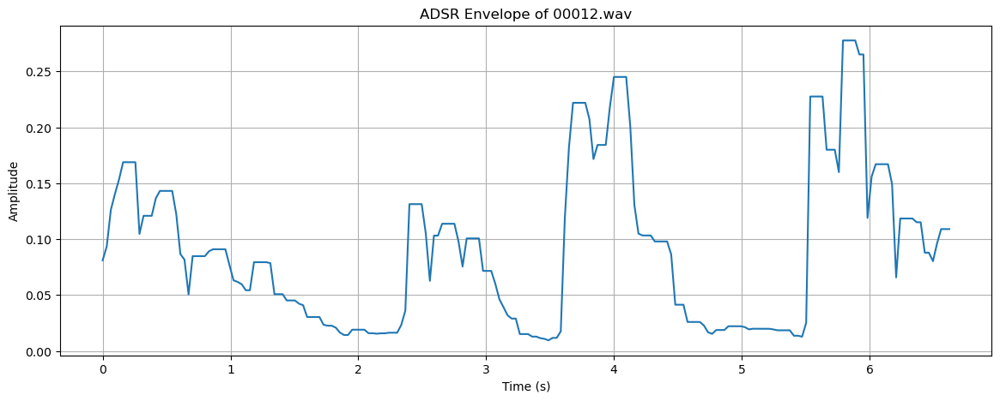

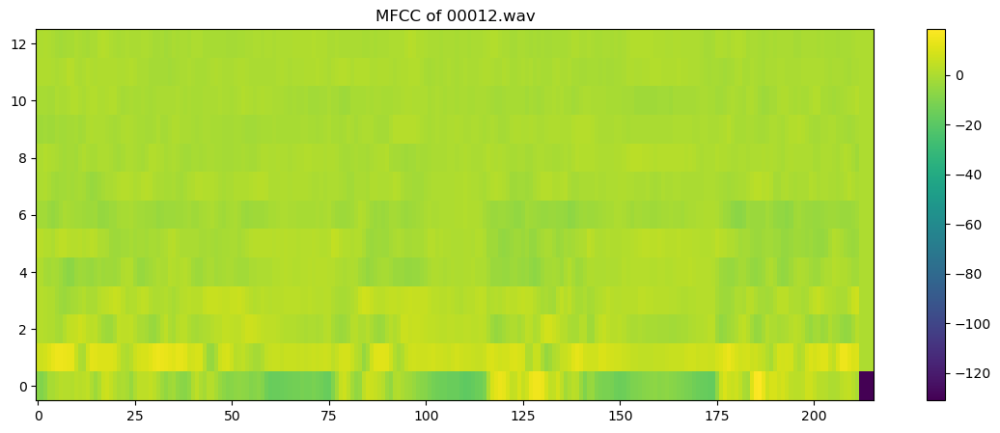

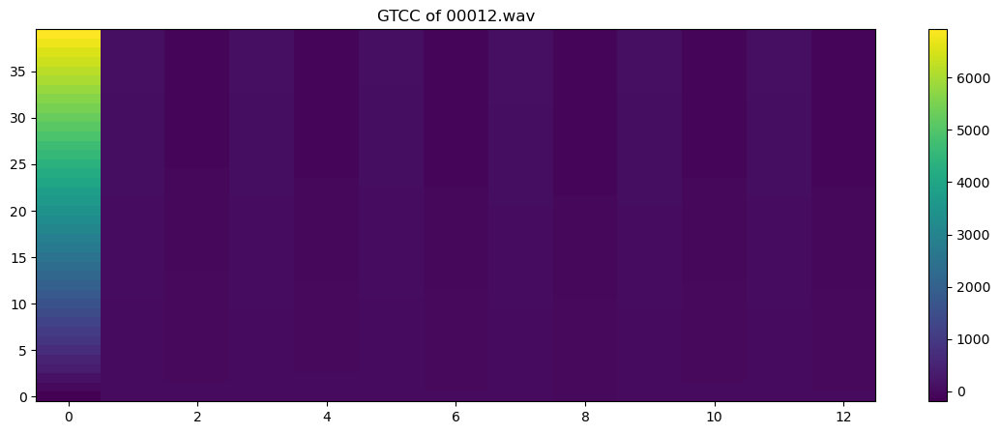

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00012.wav
	ZCR: [0.10595703 0.08789062 0.06982422 0.04931641 0.04833984 0.05908203
 0.07226562 0.12207031 0.20849609 0.24072266 0.23242188 0.19238281
 0.10058594 0.06982422 0.06787109 0.07080078 0.07568359 0.07373047
 0.08691406 0.17871094 0.23095703 0.265625   0.26123047 0.16748047
 0.12158203 0.09375    0.08496094 0.07666016 0.06542969 0.05078125
 0.04052734 0.05517578 0.05664062 0.06347656 0.06542969 0.05517578
 0.08154297 0.09912109 0.11279297 0.11865234 0.14306641 0.21435547
 0.28271484 0.31689453 0.27587891 0.1796875  0.09570312 0.09619141
 0.12890625 0.16210938 0.20166016 0.23339844 0.26464844 0.35253906
 0.40234375 0.36181641 0.31982422 0.2265625  0.15576172 0.13671875
 0.12109375 0.11376953 0.11962891 0.12060547 0.13134766 0.13085938
 0.14208984 0.14355469 0.14501953 0.15576172 0.14746094 0.14599609
 0.12744141 0.14941406 0.16845703 0.17431641 0.17431641 0.12988281
 0.12695312 0.12988281 0.14355469 0.23095703 0.22900391 0.

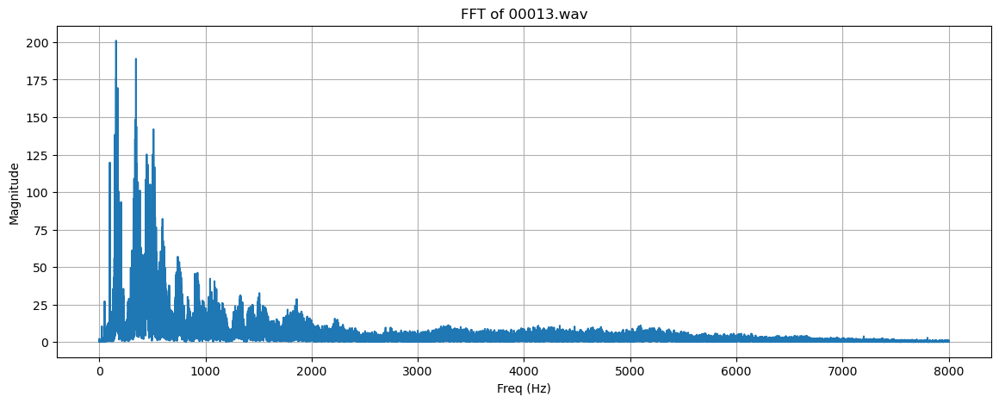

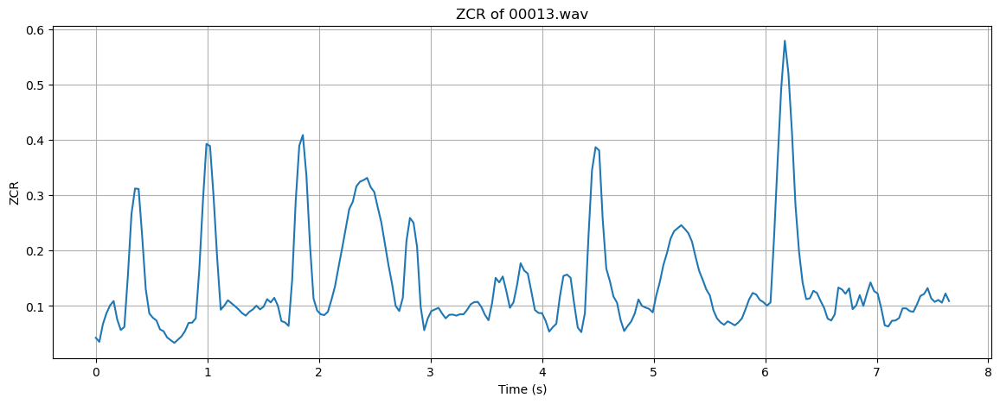

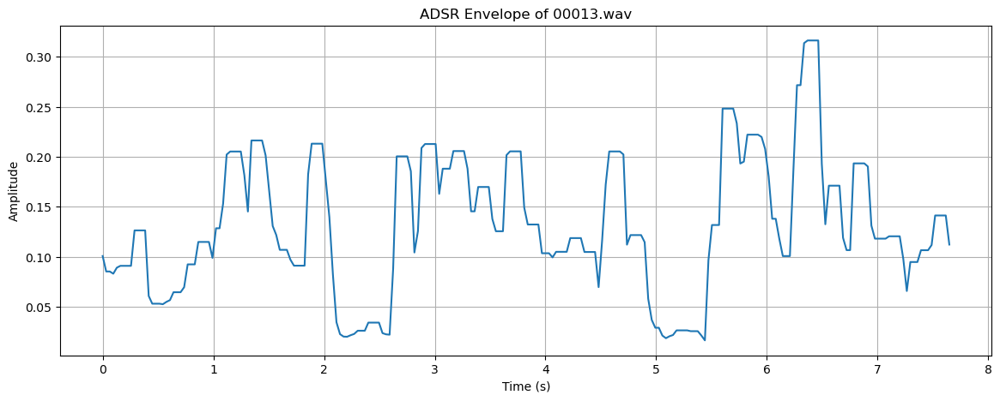

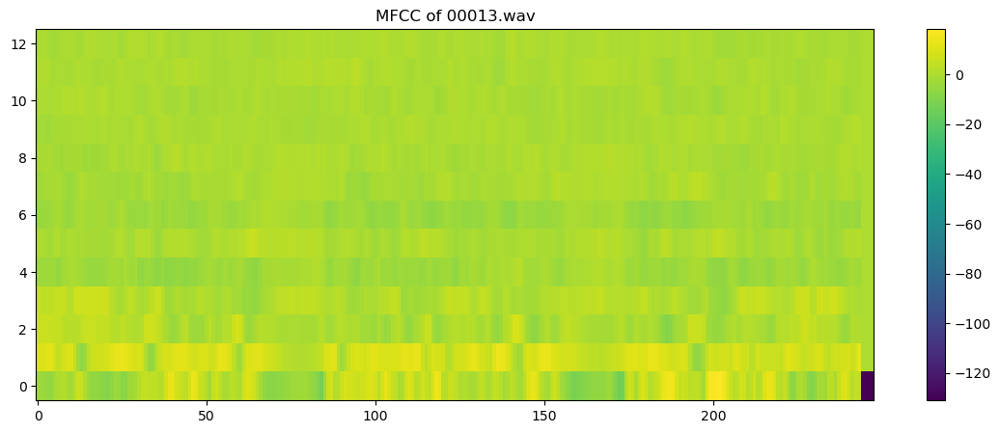

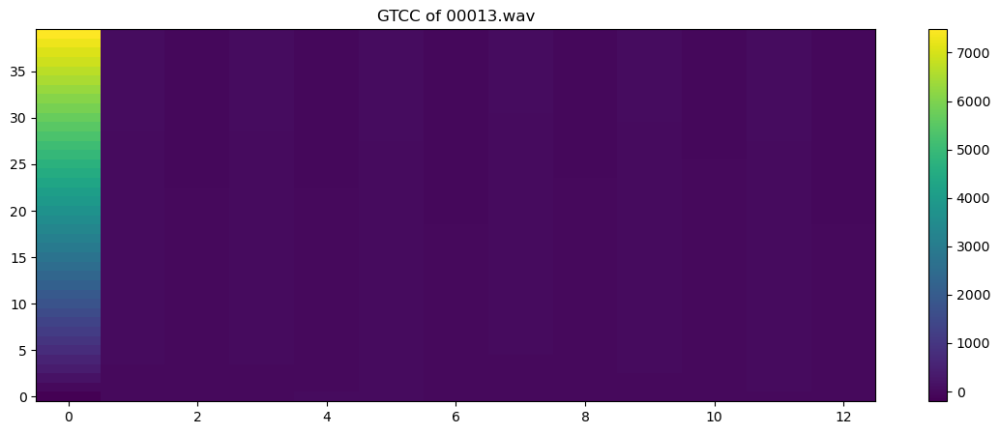

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00013.wav
	ZCR: [0.04248047 0.03515625 0.06738281 0.08691406 0.10107422 0.10888672
 0.07568359 0.05664062 0.06201172 0.15527344 0.26611328 0.3125
 0.31152344 0.22558594 0.13037109 0.08642578 0.07861328 0.07373047
 0.05761719 0.05419922 0.04296875 0.03808594 0.03320312 0.0390625
 0.04492188 0.0546875  0.06933594 0.06982422 0.07763672 0.16601562
 0.28808594 0.39306641 0.38916016 0.29736328 0.18701172 0.09326172
 0.10058594 0.11035156 0.10498047 0.09960938 0.09375    0.08691406
 0.08251953 0.08935547 0.09375    0.10058594 0.09375    0.09863281
 0.11230469 0.10644531 0.11474609 0.10058594 0.07275391 0.0703125
 0.06396484 0.14599609 0.29003906 0.38964844 0.40917969 0.3359375
 0.21044922 0.11328125 0.09179688 0.08496094 0.08349609 0.08935547
 0.11083984 0.13525391 0.17041016 0.20410156 0.24023438 0.27539062
 0.28857422 0.31640625 0.32470703 0.32763672 0.33154297 0.31494141
 0.30615234 0.27783203 0.25048828 0.21191406 0.17333984 0.1396484

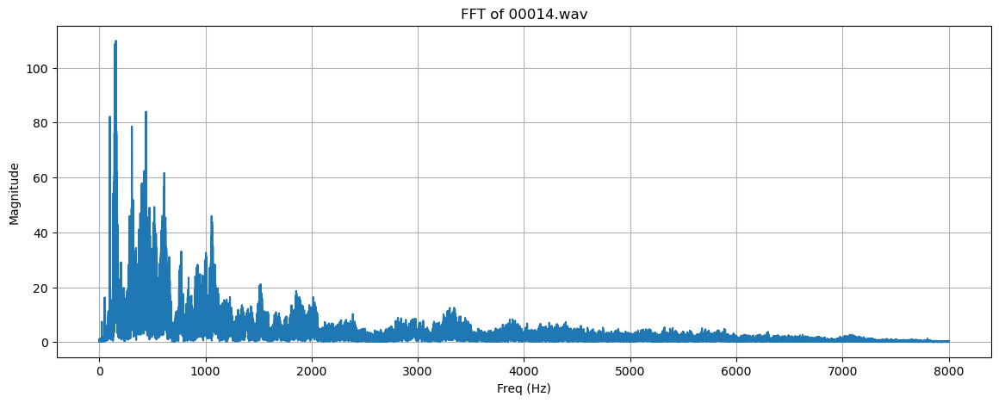

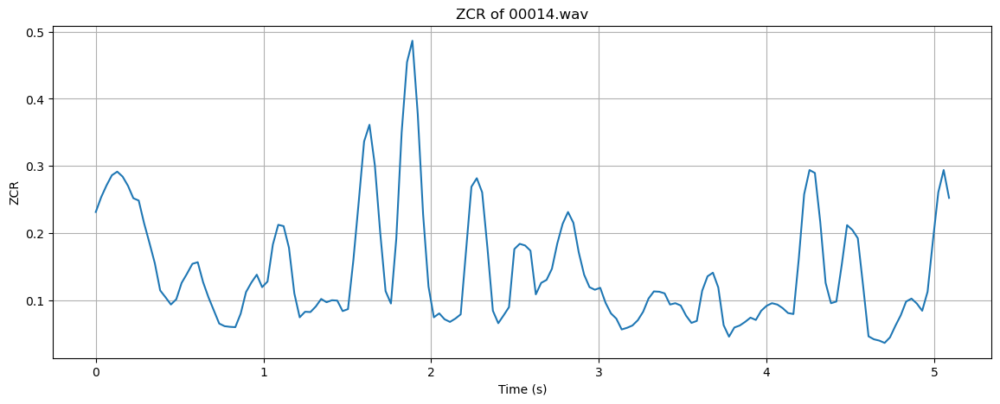

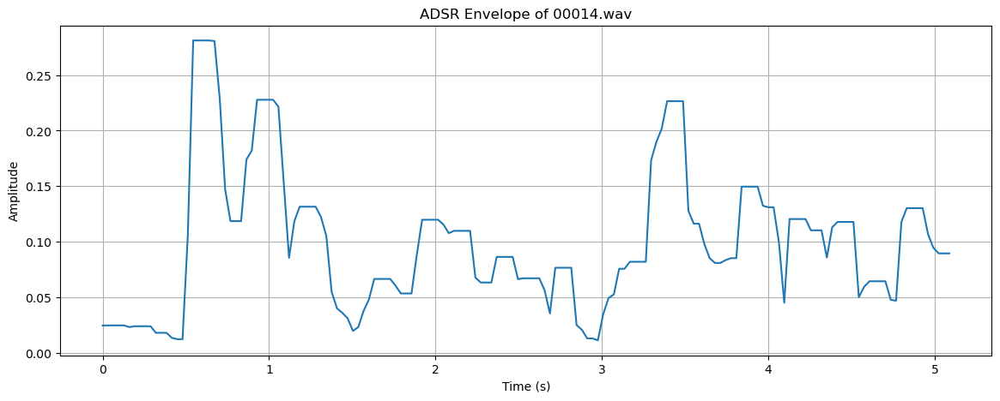

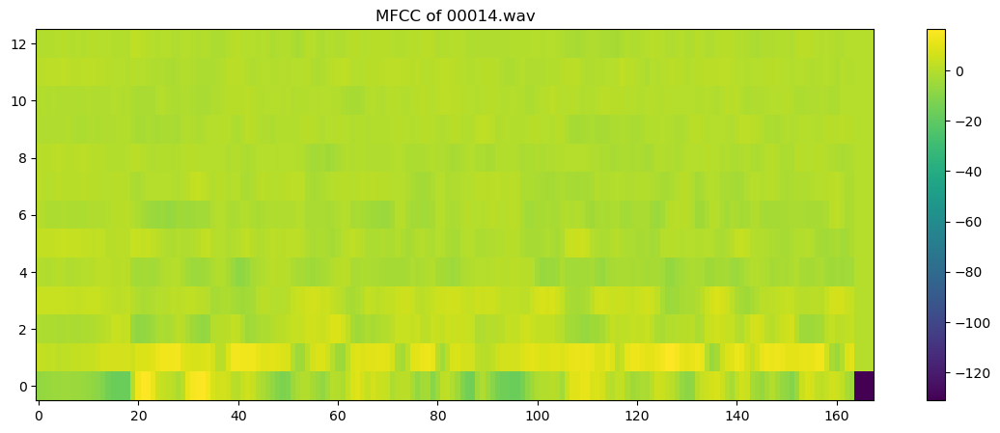

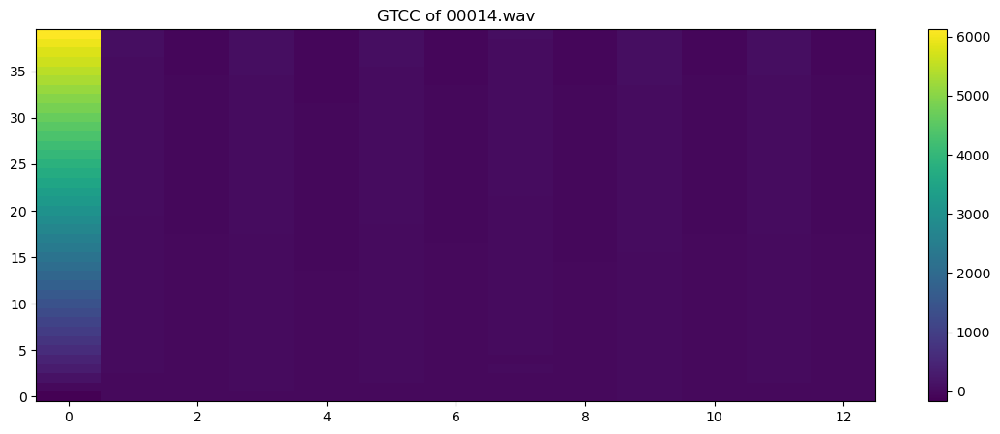

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00014.wav
	ZCR: [0.23144531 0.25341797 0.27099609 0.28613281 0.29150391 0.28417969
 0.27050781 0.25195312 0.24853516 0.21484375 0.18554688 0.15527344
 0.11474609 0.10449219 0.09375    0.1015625  0.12597656 0.13964844
 0.15429688 0.15673828 0.12695312 0.10449219 0.08496094 0.06542969
 0.06152344 0.06054688 0.06005859 0.08007812 0.11230469 0.12646484
 0.13818359 0.11962891 0.12792969 0.18310547 0.21240234 0.21044922
 0.17822266 0.11035156 0.07470703 0.08300781 0.08251953 0.09082031
 0.10205078 0.09716797 0.10009766 0.09960938 0.08398438 0.08691406
 0.15966797 0.24658203 0.33642578 0.36132812 0.30126953 0.20117188
 0.11376953 0.09521484 0.19189453 0.35009766 0.45458984 0.48632812
 0.37695312 0.22753906 0.12060547 0.07470703 0.08056641 0.07177734
 0.06787109 0.07275391 0.07910156 0.17431641 0.26904297 0.28173828
 0.26074219 0.17675781 0.08447266 0.06591797 0.07763672 0.08984375
 0.17626953 0.18408203 0.18164062 0.17382812 0.10888672 0.

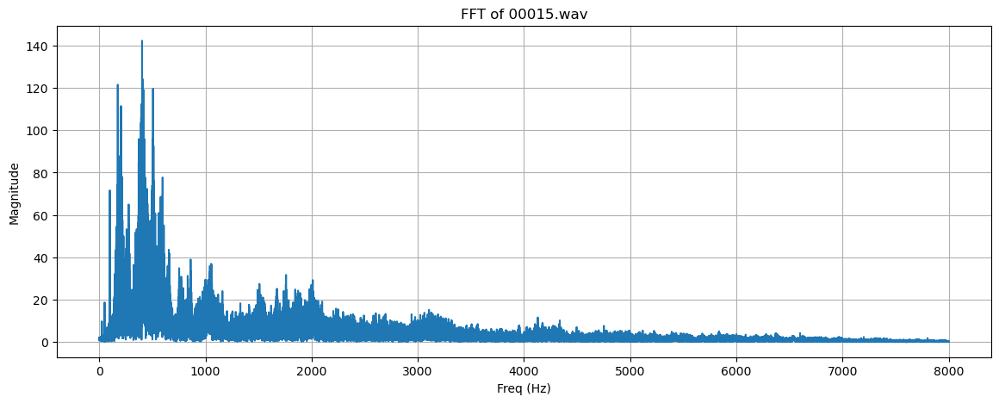

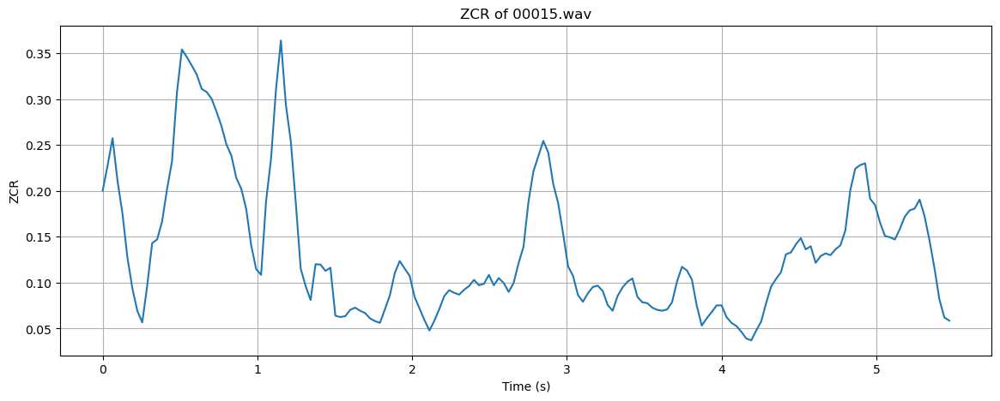

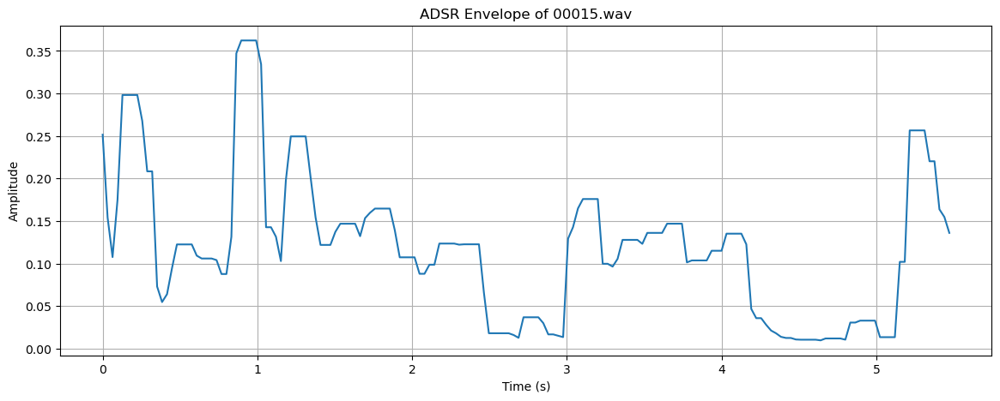

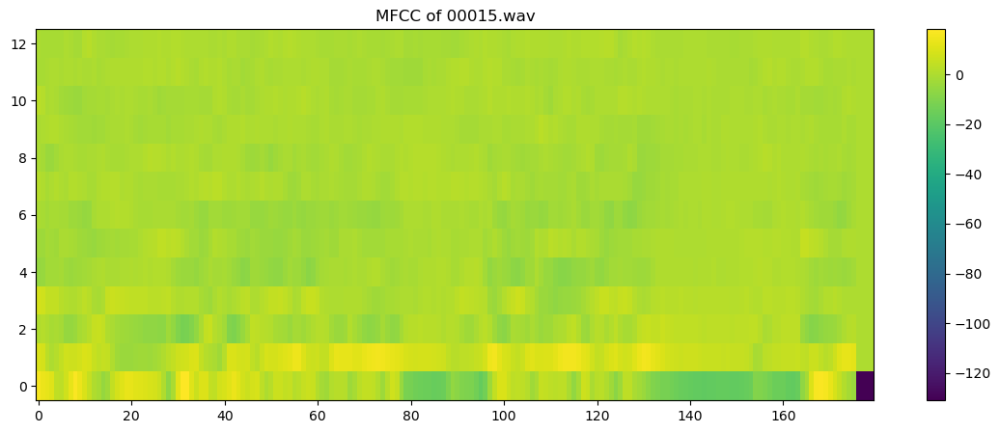

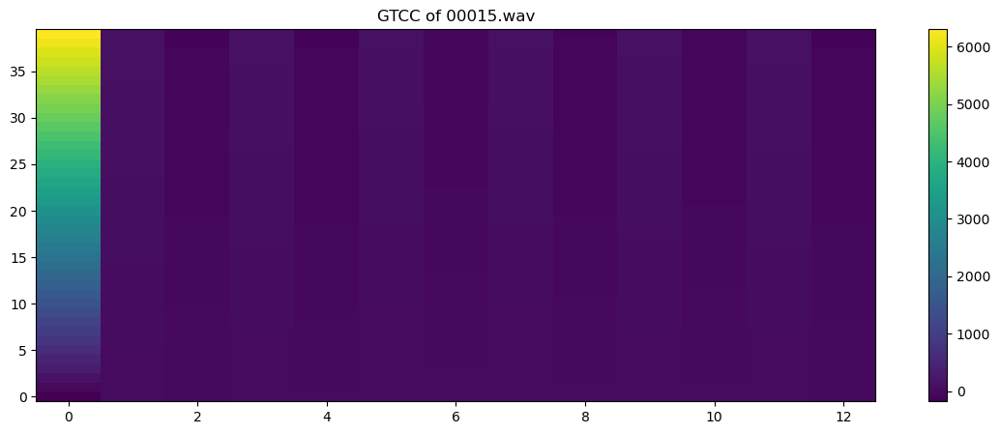

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00015.wav
	ZCR: [0.20019531 0.22753906 0.25732422 0.2109375  0.17529297 0.12744141
 0.09375    0.06933594 0.05664062 0.09667969 0.14306641 0.14697266
 0.16650391 0.20166016 0.23193359 0.30664062 0.35400391 0.34570312
 0.33642578 0.32666016 0.31103516 0.30761719 0.30029297 0.28613281
 0.27050781 0.25048828 0.23828125 0.21386719 0.20214844 0.18017578
 0.140625   0.11474609 0.10839844 0.18847656 0.234375   0.31005859
 0.36376953 0.29394531 0.25390625 0.1875     0.11523438 0.09619141
 0.08105469 0.12011719 0.11962891 0.11279297 0.11621094 0.06396484
 0.0625     0.06347656 0.0703125  0.07275391 0.06933594 0.06689453
 0.06103516 0.05810547 0.05615234 0.07080078 0.0859375  0.11035156
 0.12353516 0.11523438 0.10742188 0.08447266 0.07177734 0.05908203
 0.04785156 0.05859375 0.07128906 0.08544922 0.09179688 0.08886719
 0.08691406 0.09228516 0.09619141 0.10302734 0.09716797 0.09863281
 0.10839844 0.09716797 0.10498047 0.09960938 0.08984375 0.

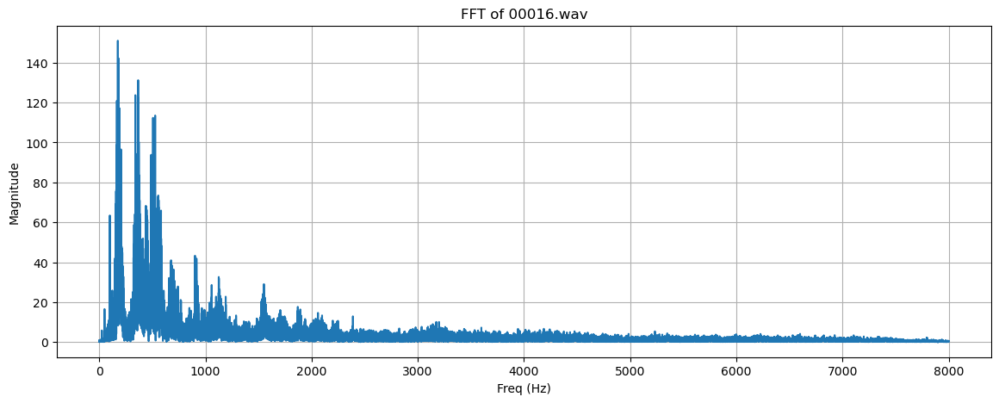

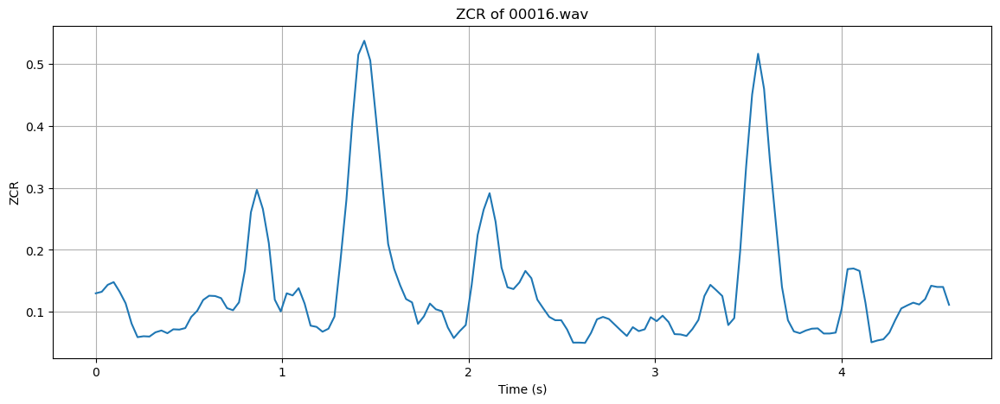

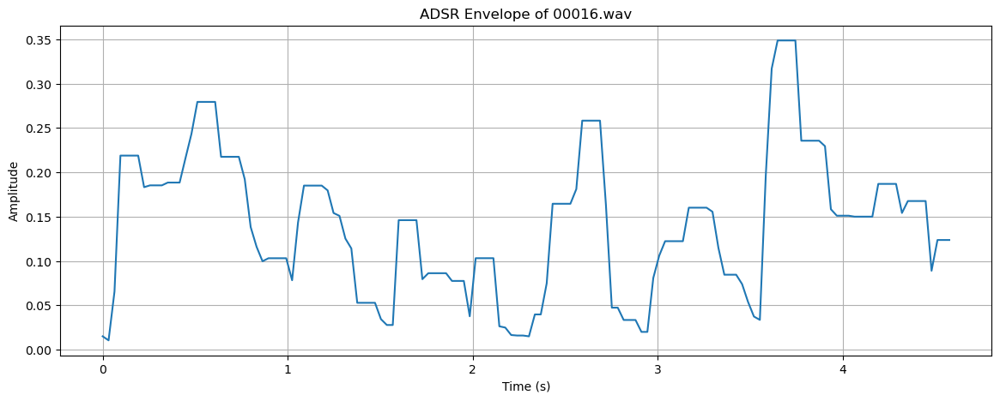

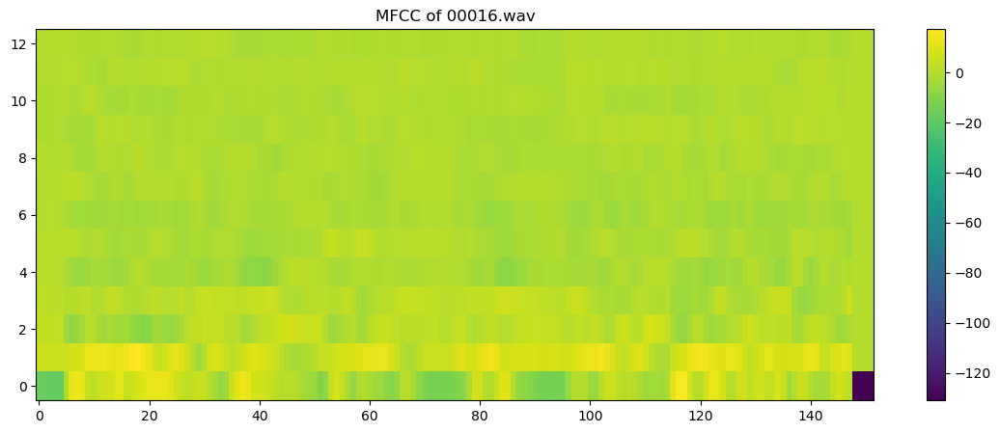

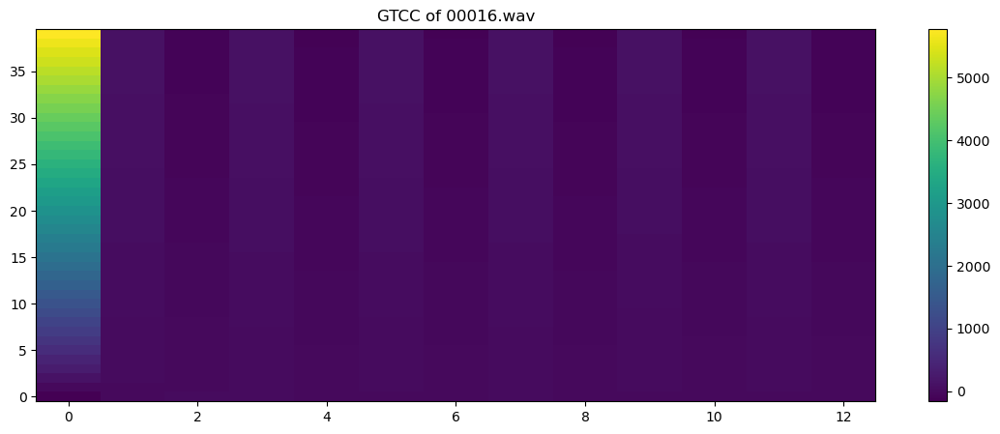

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00016.wav
	ZCR: [0.12988281 0.13232422 0.14355469 0.14794922 0.13232422 0.11376953
 0.08105469 0.05908203 0.06054688 0.06005859 0.06689453 0.06982422
 0.06542969 0.07177734 0.07128906 0.07373047 0.09179688 0.1015625
 0.11914062 0.12597656 0.12548828 0.12207031 0.10595703 0.10253906
 0.11523438 0.16748047 0.26074219 0.296875   0.26611328 0.2109375
 0.11962891 0.10058594 0.12988281 0.12646484 0.13818359 0.11328125
 0.07763672 0.07568359 0.06787109 0.07275391 0.09228516 0.18212891
 0.28027344 0.40771484 0.51513672 0.53759766 0.50585938 0.40966797
 0.31005859 0.20947266 0.16943359 0.14306641 0.12060547 0.11523438
 0.08056641 0.09277344 0.11328125 0.10400391 0.10107422 0.07470703
 0.05761719 0.06884766 0.07861328 0.14355469 0.22412109 0.26464844
 0.29150391 0.24560547 0.17138672 0.13964844 0.13671875 0.14746094
 0.16601562 0.15429688 0.11962891 0.10546875 0.09179688 0.08642578
 0.08642578 0.07128906 0.05029297 0.05029297 0.04980469 0.06

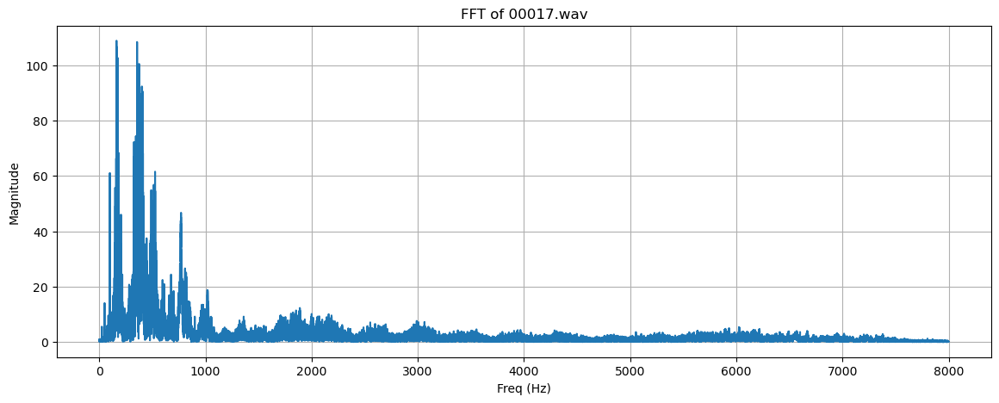

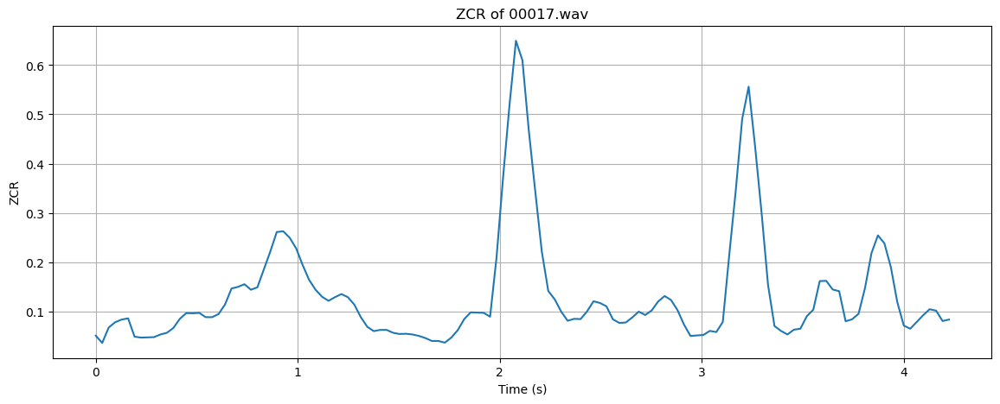

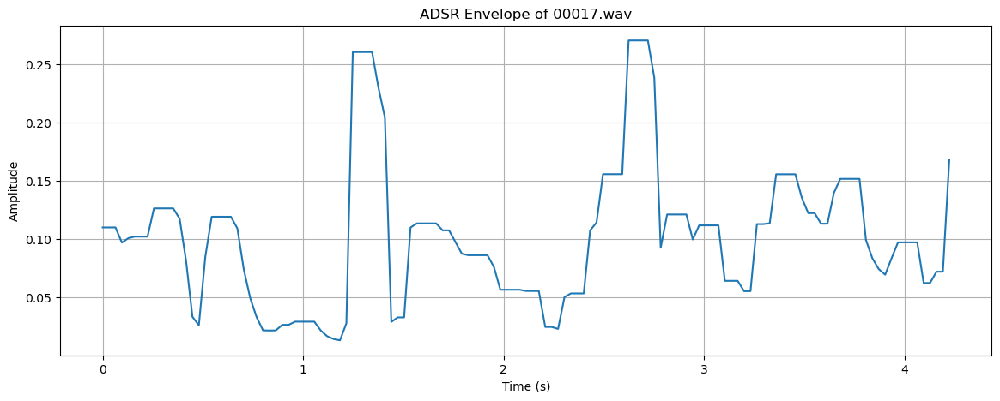

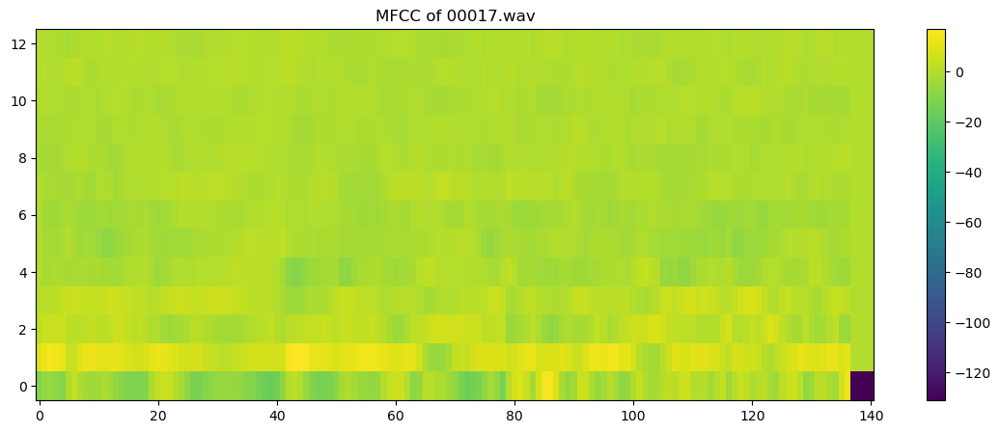

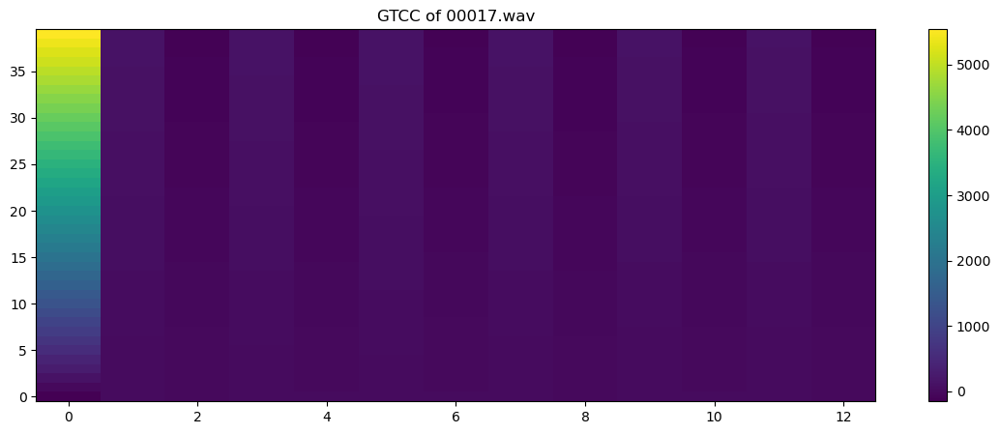

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00017.wav
	ZCR: [0.05078125 0.03613281 0.06738281 0.078125   0.08349609 0.0859375
 0.04882812 0.046875   0.04736328 0.04785156 0.05322266 0.05664062
 0.06640625 0.08496094 0.09667969 0.09619141 0.09716797 0.08837891
 0.08837891 0.09472656 0.11425781 0.14648438 0.14990234 0.15527344
 0.14404297 0.14892578 0.18505859 0.22167969 0.26123047 0.26269531
 0.24951172 0.22802734 0.19433594 0.1640625  0.14404297 0.12988281
 0.12158203 0.12890625 0.13525391 0.12890625 0.11376953 0.08837891
 0.06884766 0.06005859 0.0625     0.0625     0.05664062 0.05419922
 0.0546875  0.05322266 0.05029297 0.04589844 0.04003906 0.04003906
 0.03662109 0.046875   0.06201172 0.08447266 0.09814453 0.09765625
 0.09716797 0.08935547 0.20996094 0.37060547 0.51855469 0.64941406
 0.60986328 0.46582031 0.34228516 0.22167969 0.14160156 0.12451172
 0.09960938 0.08105469 0.08496094 0.08447266 0.10009766 0.12060547
 0.1171875  0.11035156 0.08398438 0.07666016 0.07763672 0.0

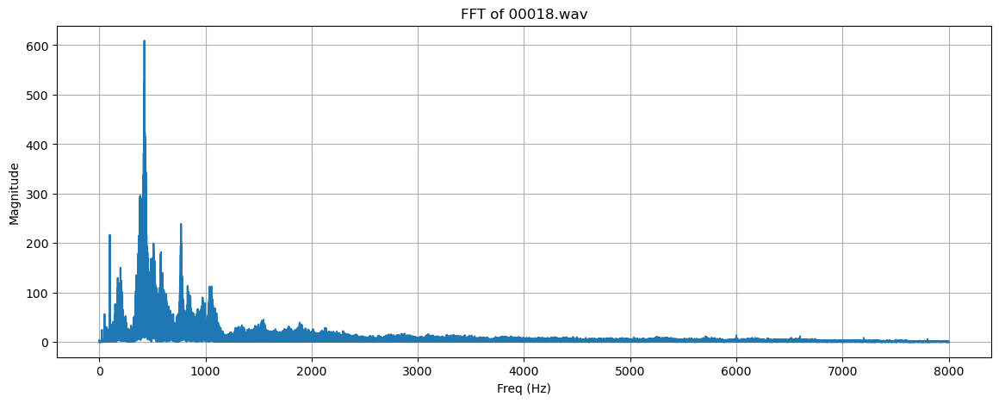

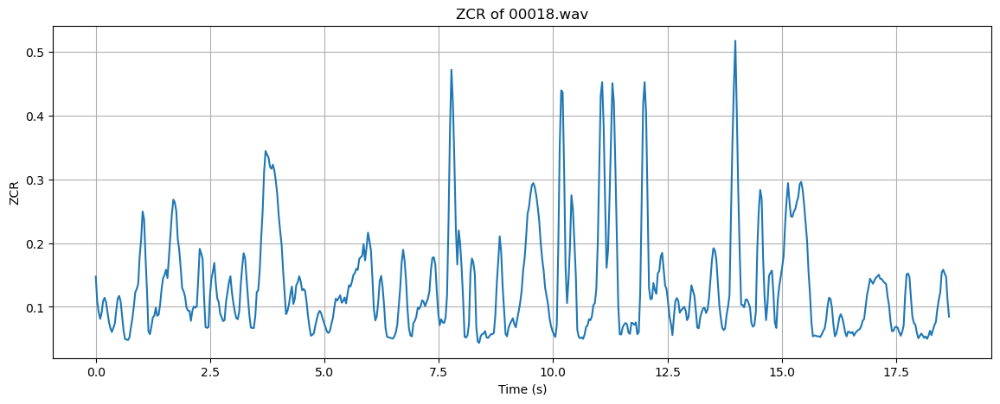

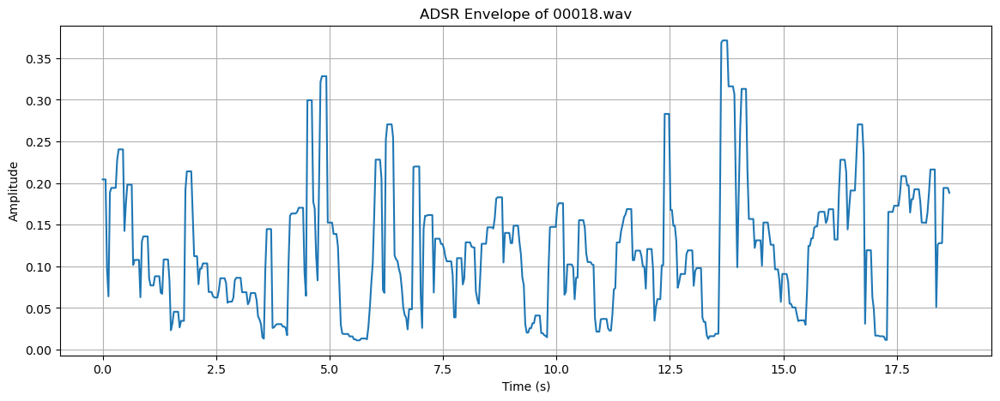

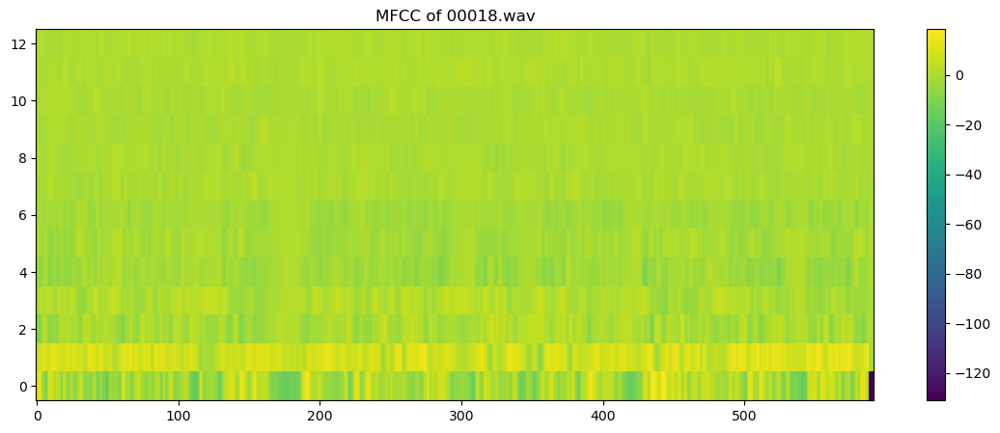

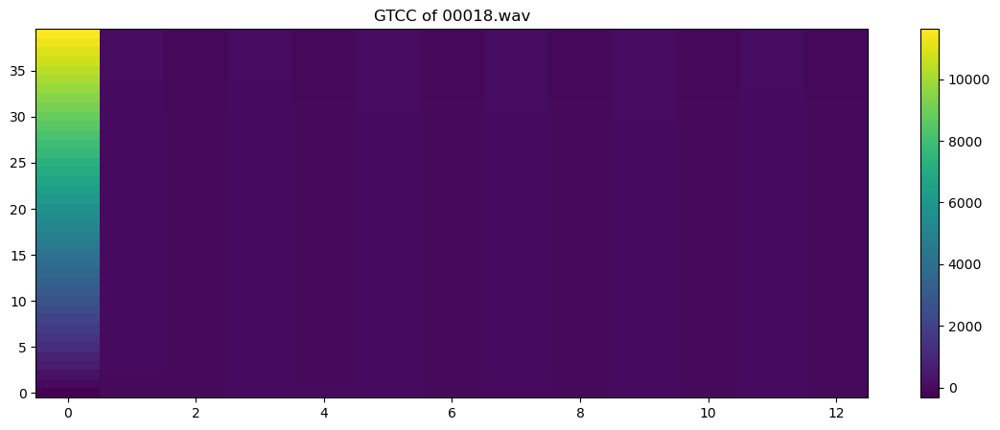

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00018.wav
	ZCR: [0.14746094 0.10791016 0.09179688 0.08105469 0.09033203 0.10888672
 0.11425781 0.10742188 0.09228516 0.07617188 0.06640625 0.06054688
 0.06689453 0.07373047 0.09472656 0.11279297 0.1171875  0.10839844
 0.08496094 0.0625     0.04931641 0.04882812 0.04785156 0.05175781
 0.06787109 0.08154297 0.10107422 0.12304688 0.12792969 0.13623047
 0.1796875  0.20556641 0.24951172 0.23730469 0.17773438 0.12548828
 0.06152344 0.05712891 0.06884766 0.08349609 0.0859375  0.09863281
 0.0859375  0.08789062 0.10449219 0.12841797 0.14501953 0.14990234
 0.15820312 0.14501953 0.17822266 0.2109375  0.24560547 0.26806641
 0.26367188 0.25       0.20654297 0.18945312 0.16162109 0.12939453
 0.12451172 0.11621094 0.09863281 0.09423828 0.09375    0.078125
 0.09375    0.10058594 0.09863281 0.10058594 0.14306641 0.19091797
 0.18408203 0.17529297 0.11425781 0.06835938 0.06689453 0.06835938
 0.11767578 0.14404297 0.15527344 0.16894531 0.13671875 0.11

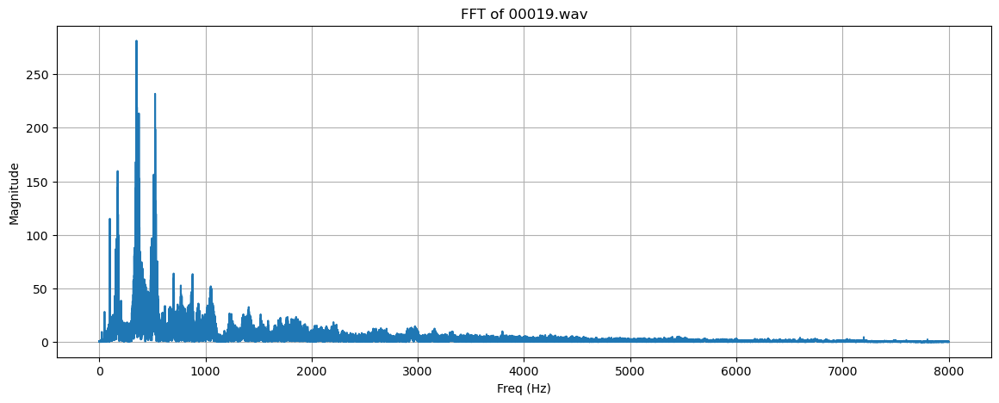

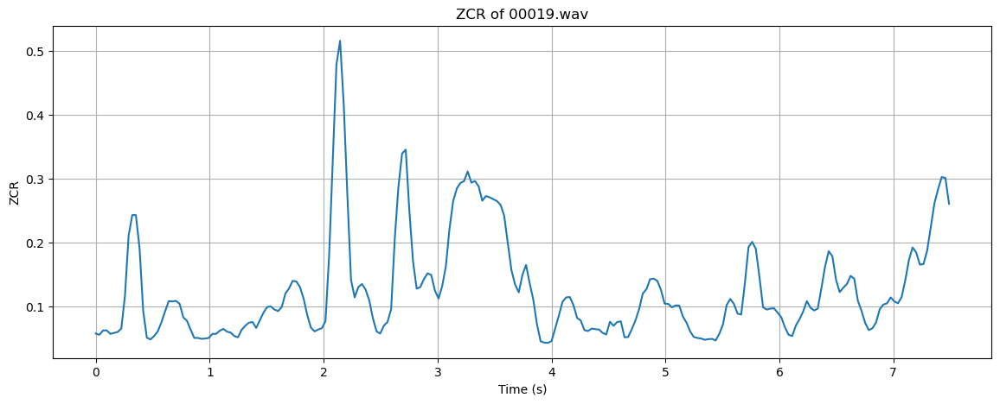

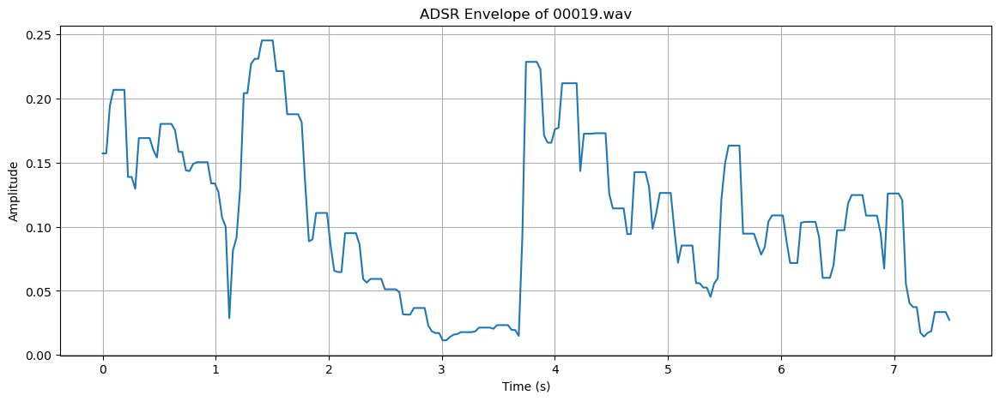

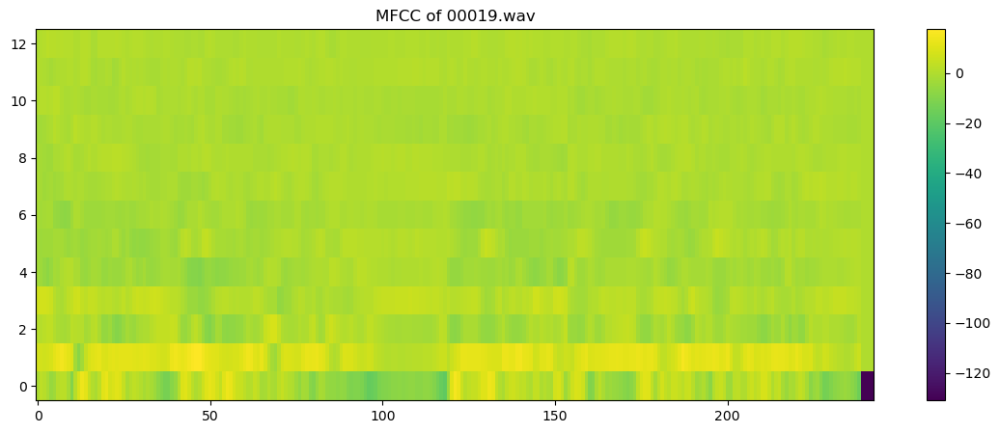

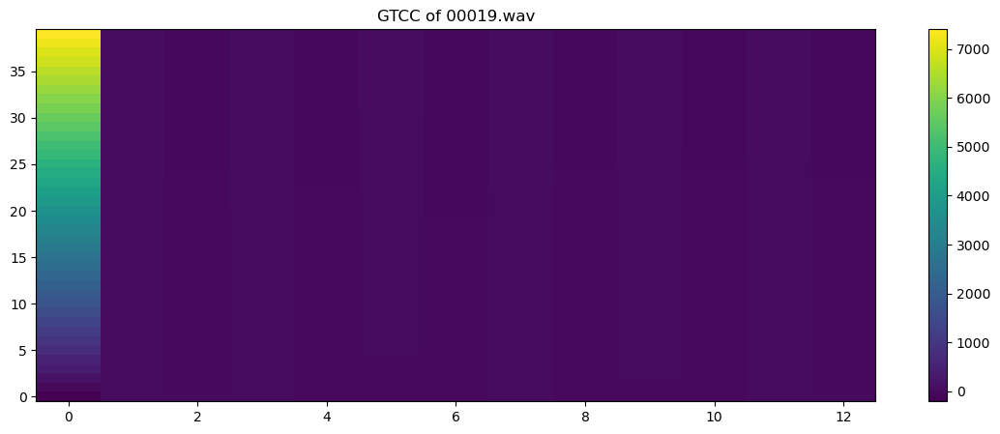

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00019.wav
	ZCR: [0.05761719 0.05566406 0.0625     0.0625     0.05712891 0.05859375
 0.06005859 0.06542969 0.11669922 0.2109375  0.24316406 0.24316406
 0.19140625 0.09326172 0.05126953 0.04833984 0.05371094 0.06103516
 0.07519531 0.09228516 0.10839844 0.10791016 0.10888672 0.10400391
 0.08300781 0.07763672 0.06396484 0.05078125 0.05078125 0.04931641
 0.04980469 0.05078125 0.05712891 0.05712891 0.06201172 0.06494141
 0.06054688 0.05908203 0.05371094 0.05175781 0.06347656 0.06982422
 0.07470703 0.07568359 0.06640625 0.07861328 0.09033203 0.09912109
 0.10009766 0.09521484 0.09277344 0.09912109 0.12011719 0.12841797
 0.14013672 0.13916016 0.13037109 0.11230469 0.08642578 0.06689453
 0.06103516 0.06396484 0.06591797 0.07714844 0.18066406 0.33154297
 0.47900391 0.51611328 0.41601562 0.27392578 0.14160156 0.11425781
 0.13037109 0.13525391 0.12646484 0.109375   0.08154297 0.06103516
 0.05761719 0.06982422 0.07568359 0.09570312 0.20654297 0.

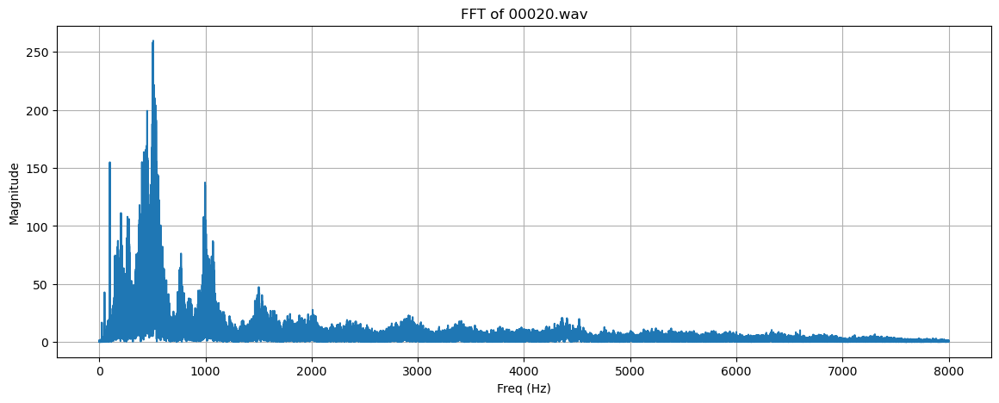

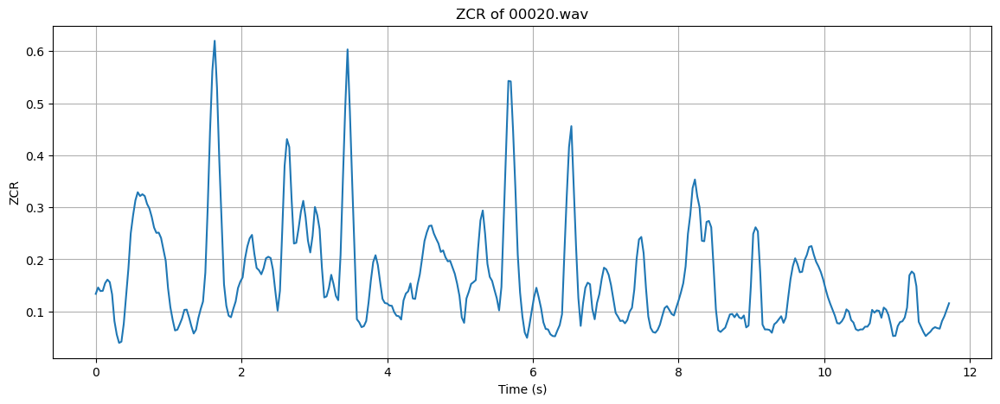

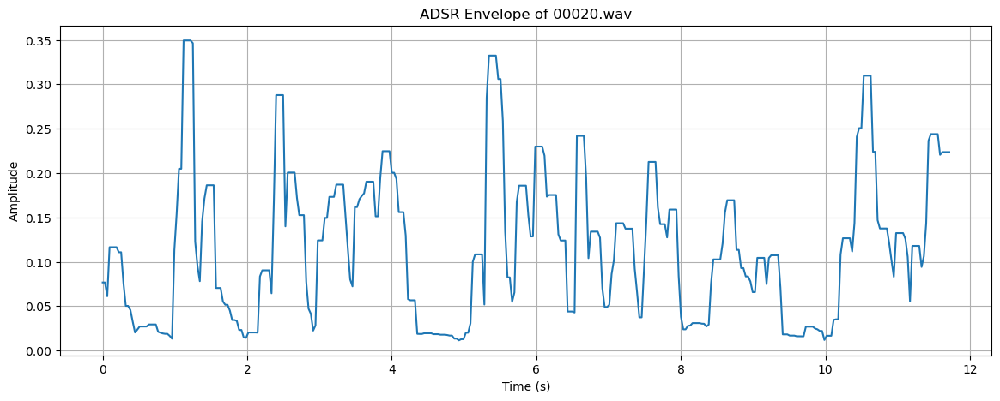

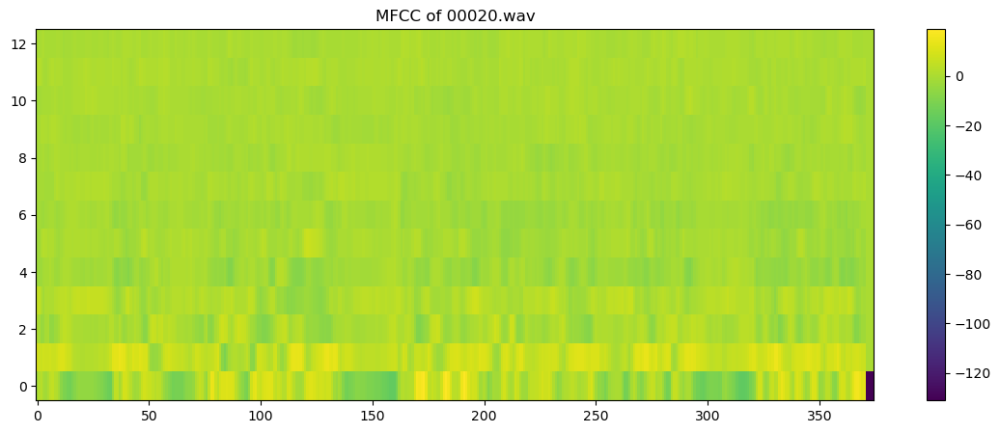

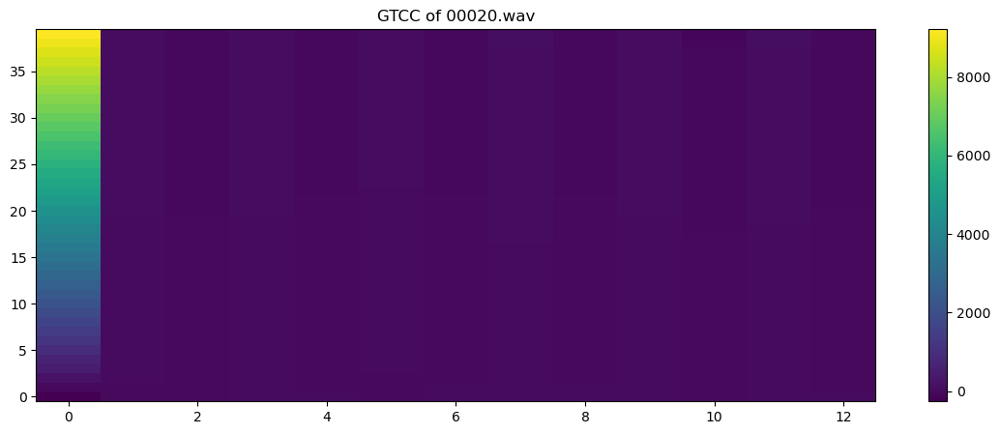

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00020.wav
	ZCR: [0.13378906 0.14599609 0.13916016 0.13964844 0.15429688 0.16113281
 0.15625    0.1328125  0.08154297 0.05566406 0.03955078 0.04199219
 0.07617188 0.12841797 0.18261719 0.25       0.28466797 0.31347656
 0.32910156 0.32177734 0.32519531 0.32177734 0.30664062 0.29785156
 0.28173828 0.26123047 0.25097656 0.25146484 0.24121094 0.21923828
 0.19726562 0.14453125 0.10791016 0.08349609 0.06347656 0.06494141
 0.07519531 0.08642578 0.10302734 0.10351562 0.08886719 0.07177734
 0.05761719 0.06494141 0.08740234 0.10449219 0.11914062 0.17480469
 0.29785156 0.4453125  0.56201172 0.62011719 0.52929688 0.38818359
 0.27099609 0.15234375 0.11083984 0.09179688 0.08886719 0.10498047
 0.11914062 0.14501953 0.15722656 0.16552734 0.20117188 0.22460938
 0.24023438 0.24707031 0.21142578 0.18359375 0.17919922 0.17138672
 0.18310547 0.20214844 0.20507812 0.20263672 0.18017578 0.13964844
 0.1015625  0.13964844 0.25732422 0.37988281 0.43115234 0.

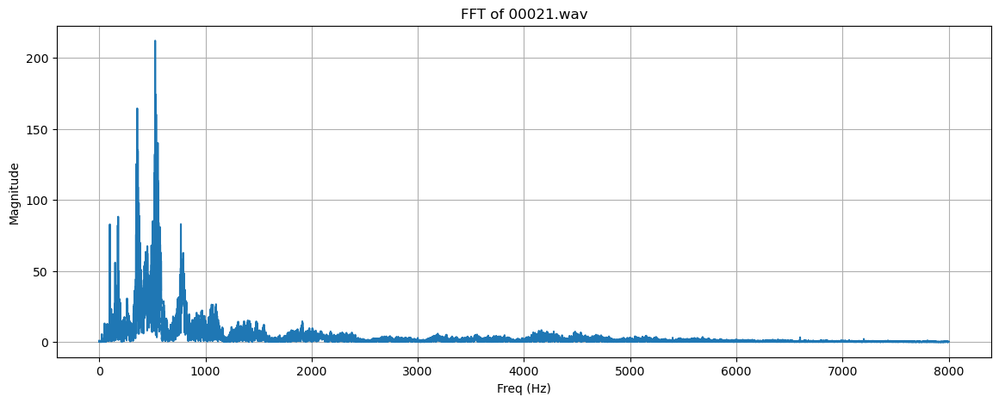

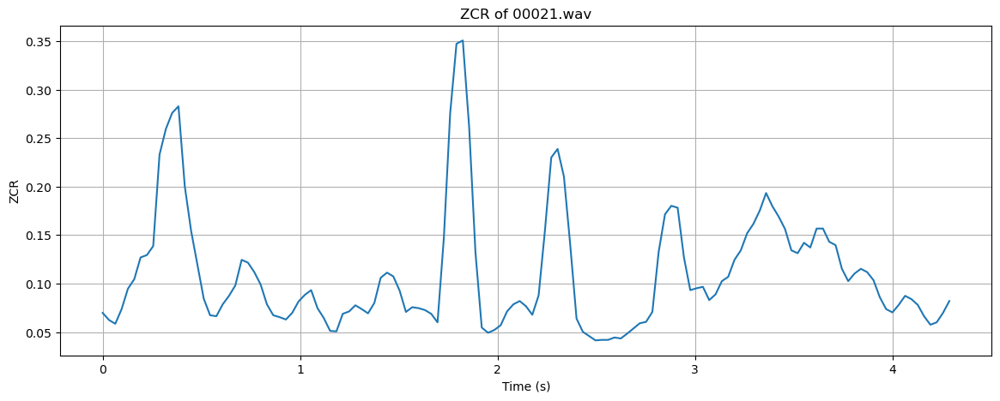

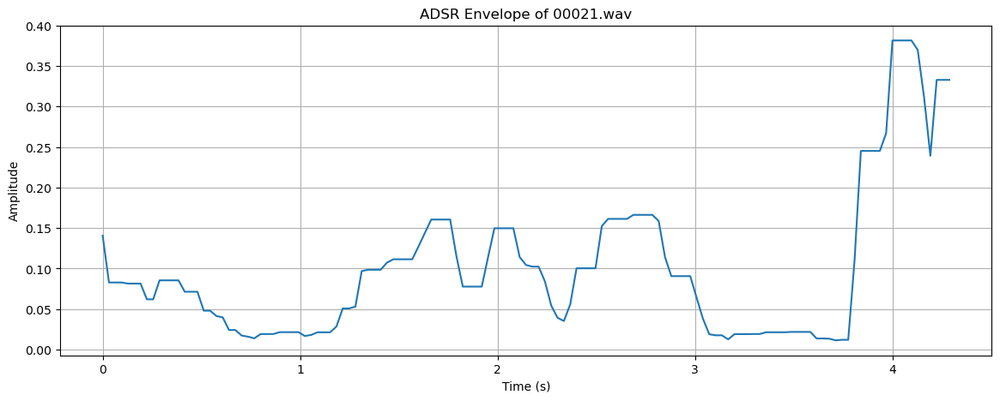

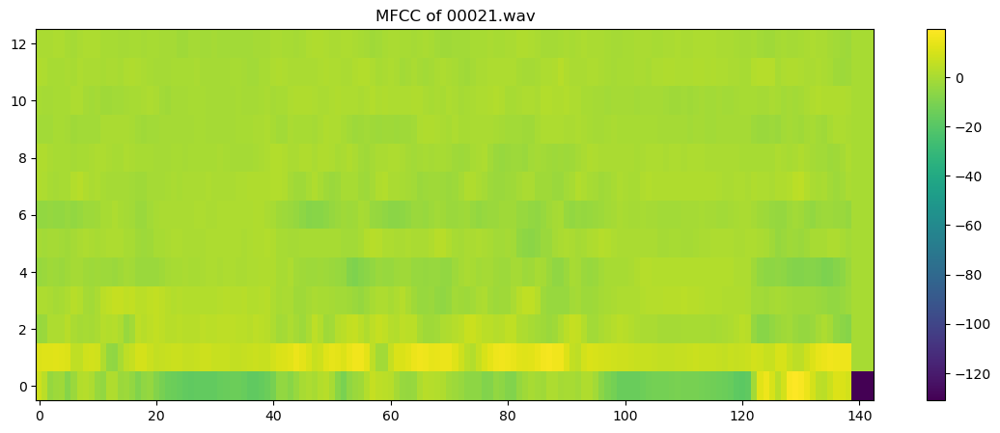

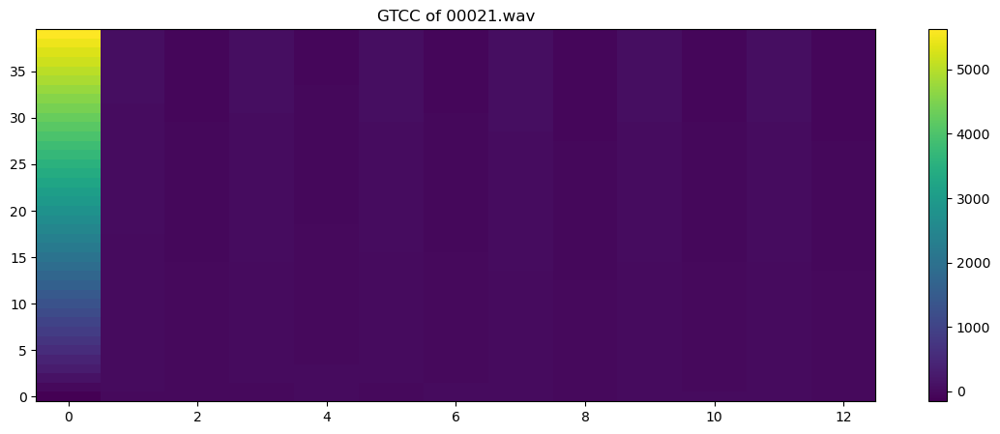

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00021.wav
	ZCR: [0.06982422 0.0625     0.05859375 0.07373047 0.09472656 0.10449219
 0.12695312 0.12939453 0.13867188 0.23291016 0.25927734 0.27587891
 0.28271484 0.20019531 0.15429688 0.11914062 0.08447266 0.06738281
 0.06640625 0.07861328 0.08740234 0.09814453 0.12451172 0.12158203
 0.11181641 0.09912109 0.07861328 0.06738281 0.06542969 0.06298828
 0.06982422 0.08154297 0.08837891 0.09326172 0.07470703 0.06445312
 0.05126953 0.05078125 0.06884766 0.07128906 0.07763672 0.07373047
 0.06933594 0.08007812 0.10595703 0.11132812 0.10742188 0.09277344
 0.07080078 0.07568359 0.07470703 0.07275391 0.06884766 0.06005859
 0.14697266 0.27539062 0.34716797 0.35058594 0.26171875 0.13232422
 0.0546875  0.04931641 0.05224609 0.05712891 0.07128906 0.07861328
 0.08203125 0.07666016 0.06787109 0.08789062 0.15478516 0.22998047
 0.23876953 0.21044922 0.14013672 0.06396484 0.05029297 0.04589844
 0.04150391 0.04199219 0.04199219 0.04443359 0.04345703 0.

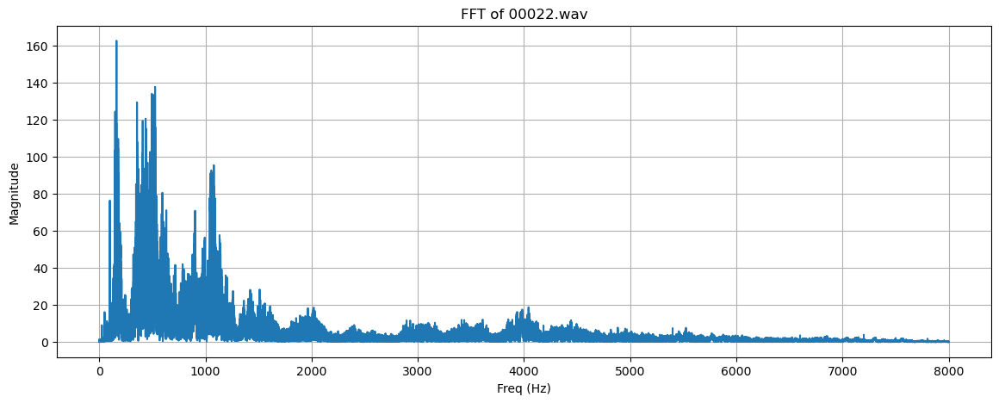

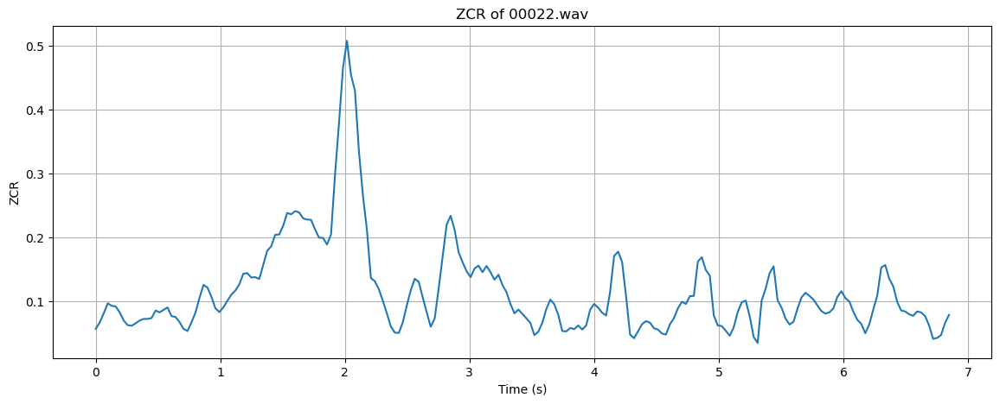

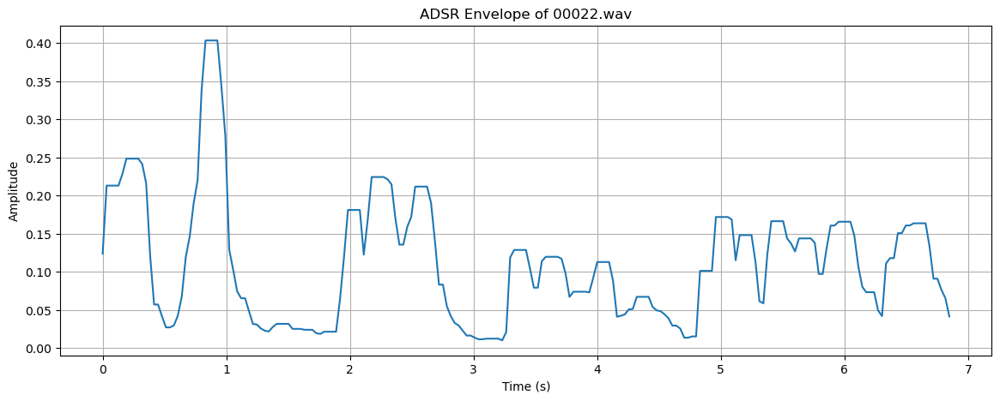

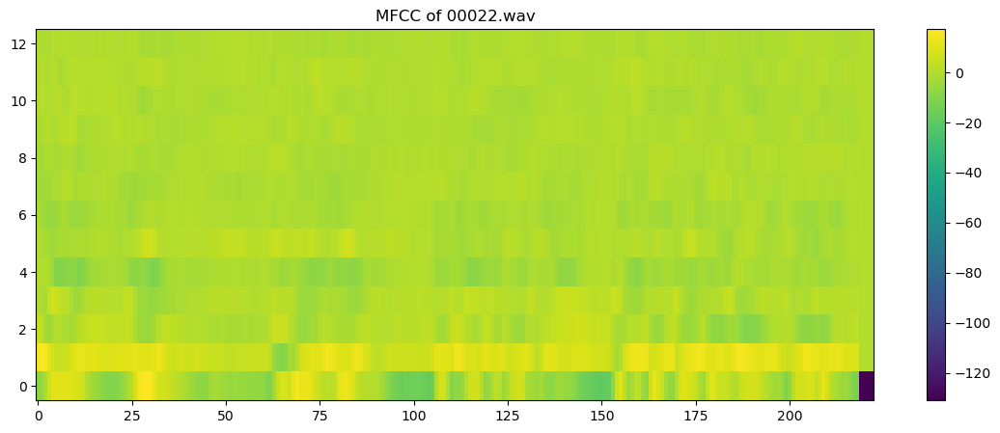

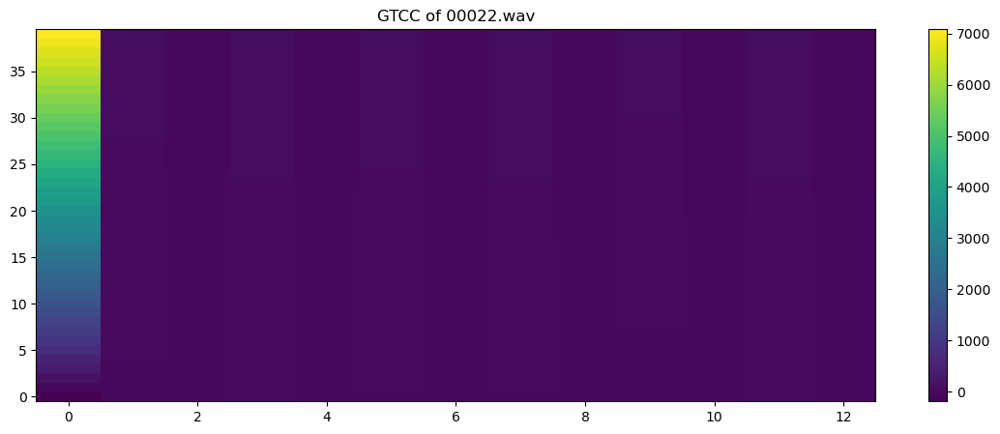

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00022.wav
	ZCR: [0.05615234 0.06640625 0.08056641 0.09619141 0.09228516 0.09130859
 0.08203125 0.06933594 0.06201172 0.06103516 0.06494141 0.06933594
 0.07177734 0.07177734 0.07324219 0.08496094 0.08203125 0.0859375
 0.08984375 0.07617188 0.07470703 0.06689453 0.05615234 0.05273438
 0.06640625 0.08154297 0.10449219 0.125      0.12109375 0.10644531
 0.08837891 0.08251953 0.08984375 0.10009766 0.10986328 0.11621094
 0.12597656 0.14257812 0.14355469 0.13671875 0.13720703 0.13427734
 0.15625    0.17871094 0.18554688 0.20361328 0.20410156 0.21777344
 0.23779297 0.23583984 0.24072266 0.23876953 0.22949219 0.22753906
 0.22705078 0.21191406 0.19921875 0.19873047 0.18847656 0.20410156
 0.29785156 0.37841797 0.46533203 0.5078125  0.45458984 0.4296875
 0.33447266 0.265625   0.21142578 0.13574219 0.13085938 0.11816406
 0.10009766 0.08056641 0.06005859 0.05029297 0.04980469 0.06640625
 0.09277344 0.11669922 0.13476562 0.12988281 0.10546875 0.08

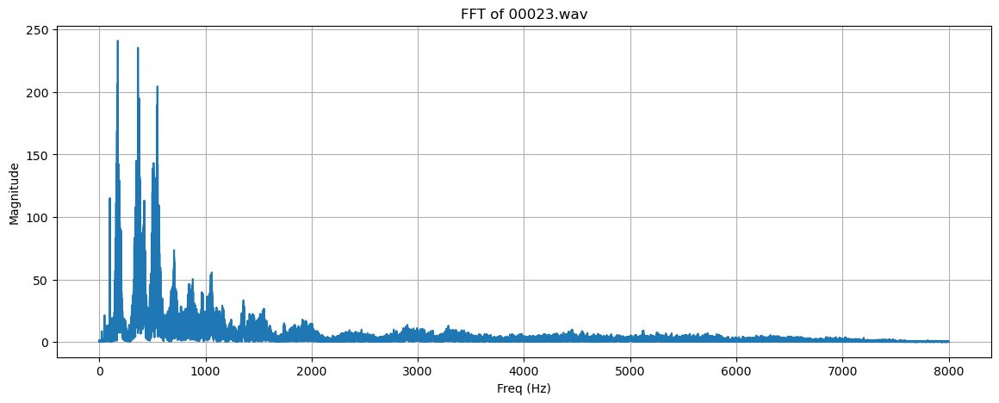

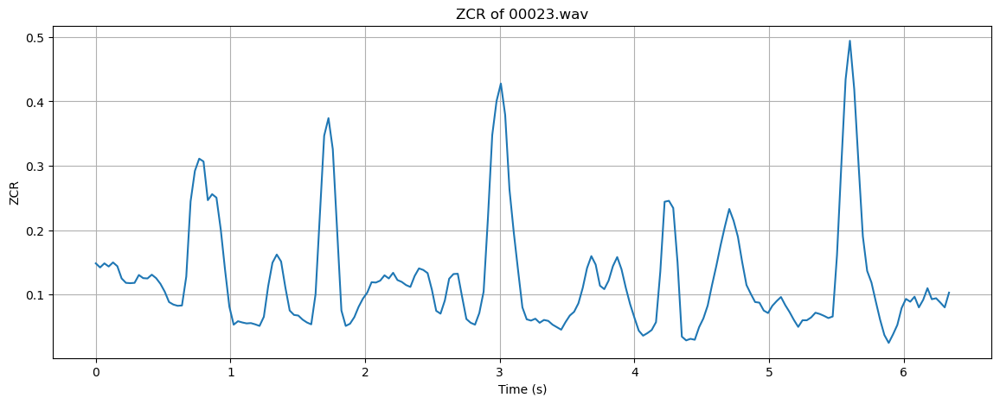

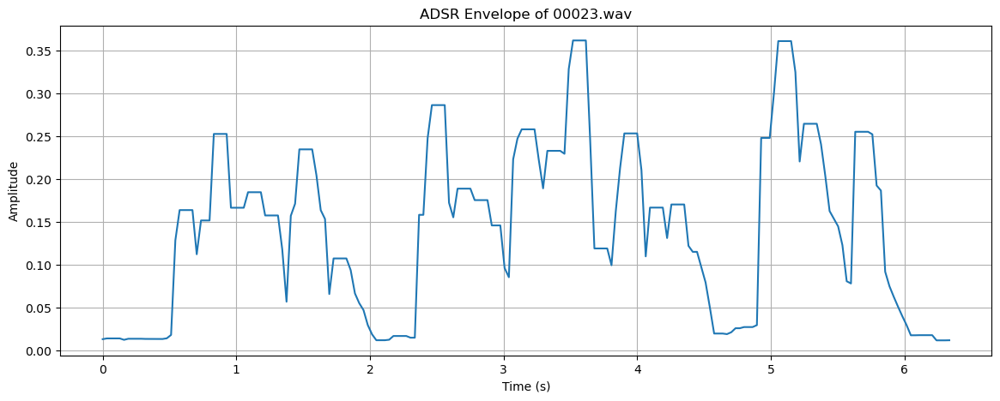

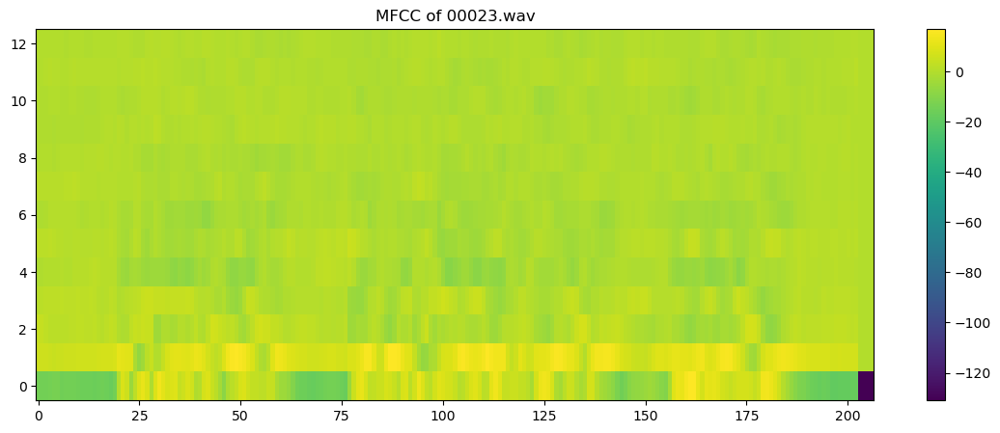

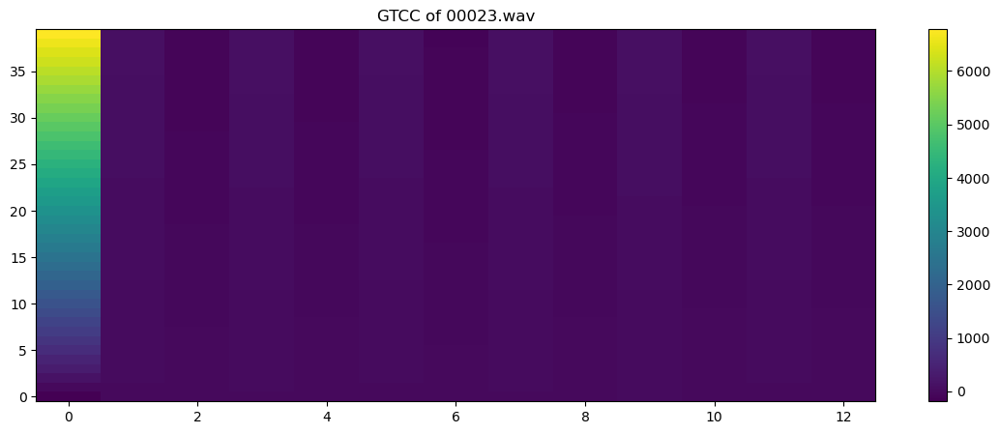

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00023.wav
	ZCR: [0.1484375  0.14208984 0.1484375  0.14355469 0.14990234 0.14404297
 0.125      0.11816406 0.11767578 0.11816406 0.13037109 0.12548828
 0.125      0.13085938 0.12548828 0.11669922 0.10449219 0.08837891
 0.08447266 0.08251953 0.08300781 0.12792969 0.24462891 0.29199219
 0.31103516 0.30664062 0.24658203 0.25585938 0.25048828 0.20117188
 0.13818359 0.08105469 0.05322266 0.05859375 0.05664062 0.05517578
 0.05566406 0.05371094 0.05126953 0.06542969 0.11279297 0.14941406
 0.16210938 0.15136719 0.11083984 0.07519531 0.06835938 0.06738281
 0.06103516 0.05664062 0.05371094 0.10058594 0.22412109 0.34667969
 0.37402344 0.32568359 0.20019531 0.07519531 0.05126953 0.0546875
 0.06494141 0.08105469 0.09375    0.10302734 0.11914062 0.11865234
 0.12158203 0.12988281 0.125      0.13378906 0.12255859 0.11962891
 0.11474609 0.11181641 0.12890625 0.140625   0.13818359 0.13330078
 0.10742188 0.07470703 0.0703125  0.09082031 0.12451172 0.1

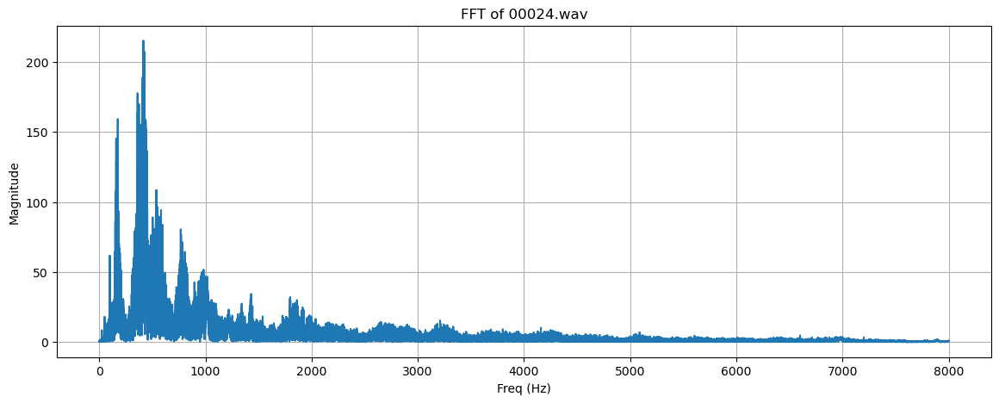

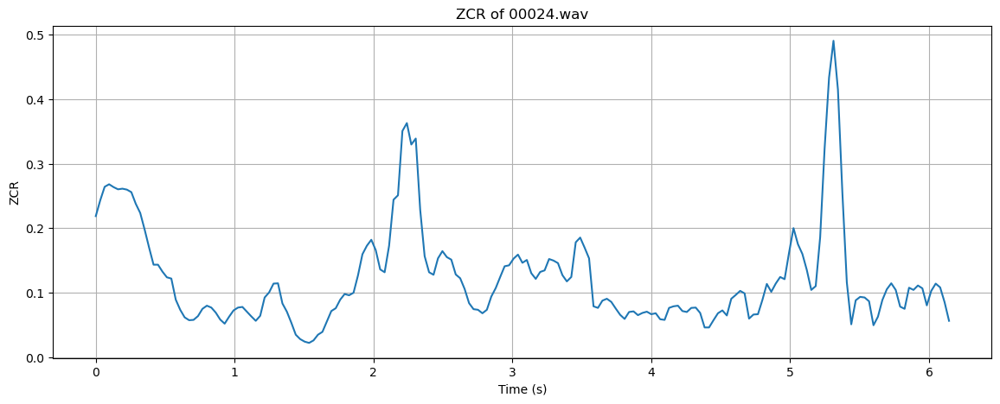

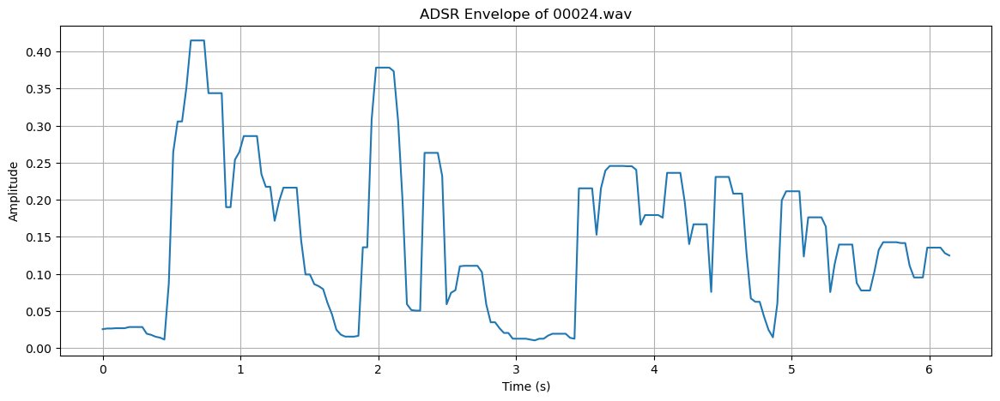

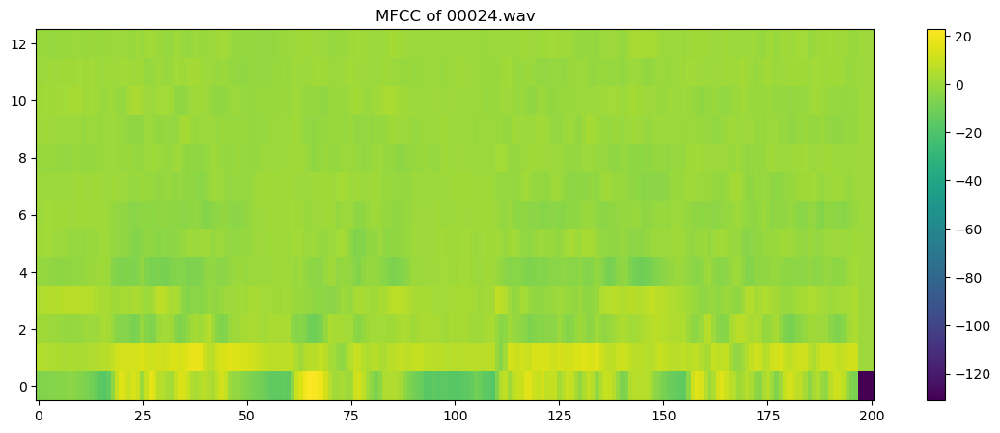

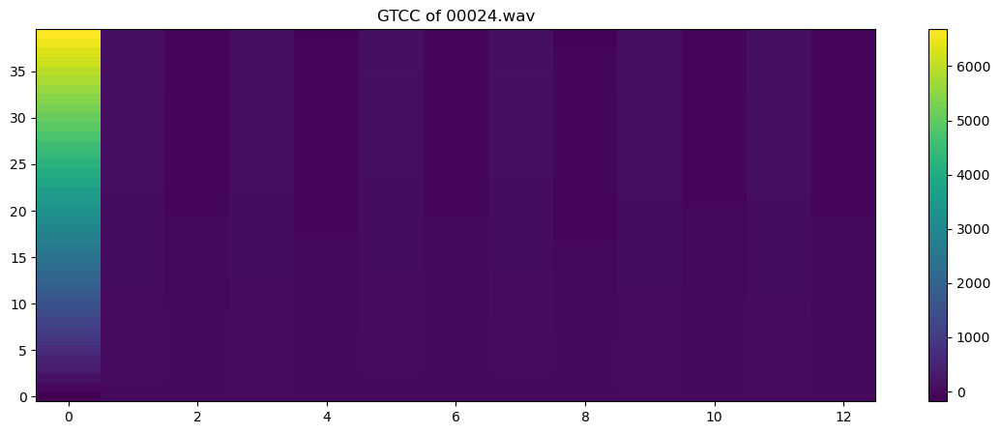

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00024.wav
	ZCR: [0.21875    0.24316406 0.26416016 0.26806641 0.26367188 0.26025391
 0.26123047 0.25976562 0.25585938 0.23779297 0.22363281 0.19775391
 0.16992188 0.14355469 0.14355469 0.1328125  0.12402344 0.12207031
 0.08935547 0.07373047 0.06201172 0.05761719 0.05810547 0.06396484
 0.07519531 0.08007812 0.07714844 0.06933594 0.05859375 0.05224609
 0.06298828 0.07275391 0.07714844 0.078125   0.07080078 0.06347656
 0.05664062 0.06445312 0.09277344 0.10058594 0.11425781 0.11474609
 0.08349609 0.07080078 0.05371094 0.03515625 0.02832031 0.02441406
 0.02246094 0.02636719 0.03515625 0.03955078 0.05566406 0.07177734
 0.07617188 0.08935547 0.09814453 0.09619141 0.10009766 0.12695312
 0.15966797 0.17285156 0.18212891 0.16601562 0.13623047 0.13183594
 0.17285156 0.24414062 0.25097656 0.35058594 0.36279297 0.32958984
 0.33886719 0.22851562 0.15673828 0.13183594 0.12792969 0.15332031
 0.16455078 0.15527344 0.15136719 0.12841797 0.12255859 0.

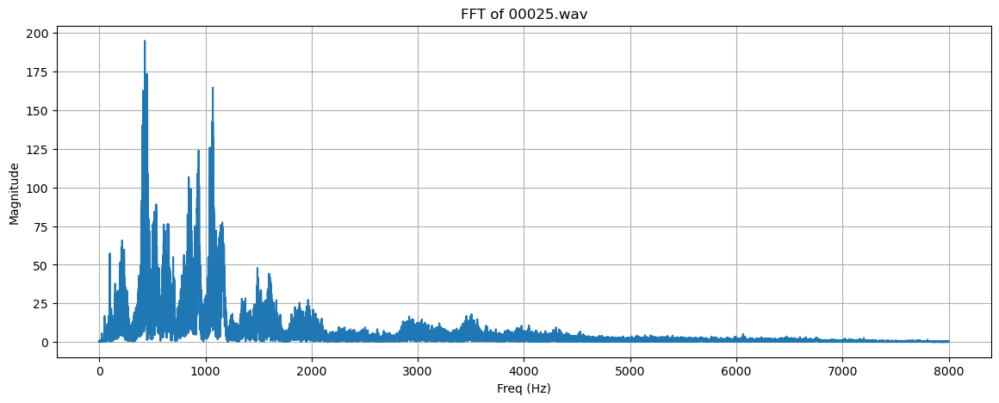

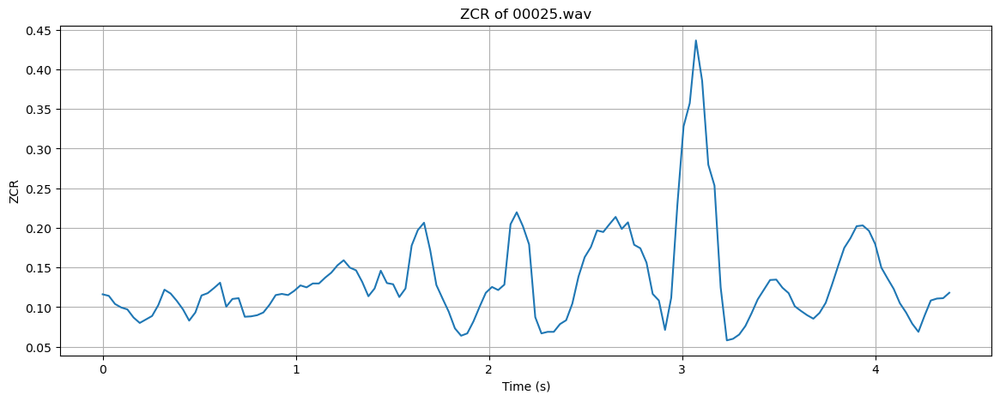

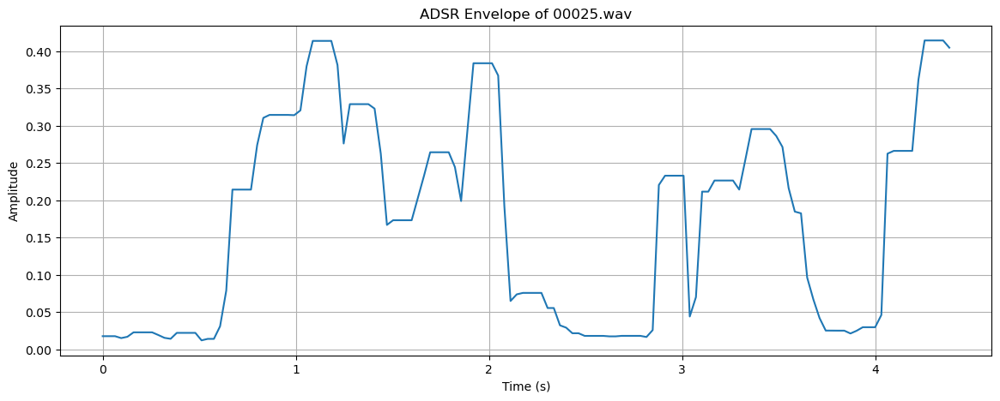

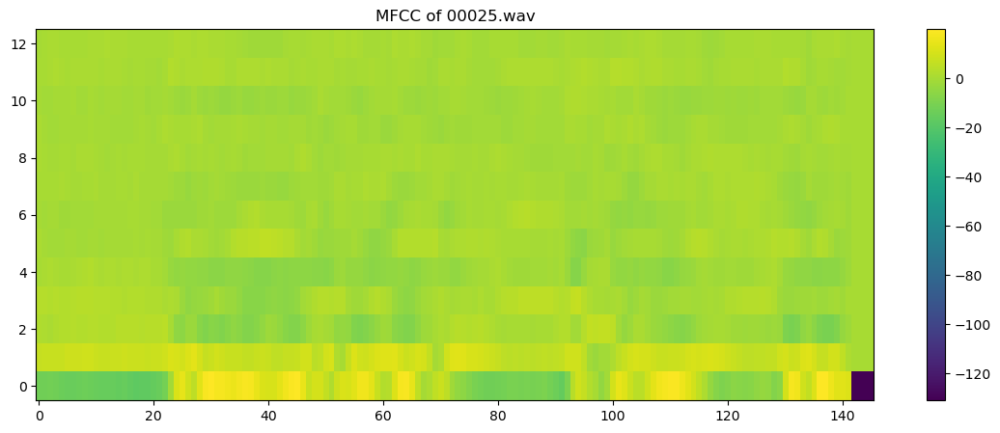

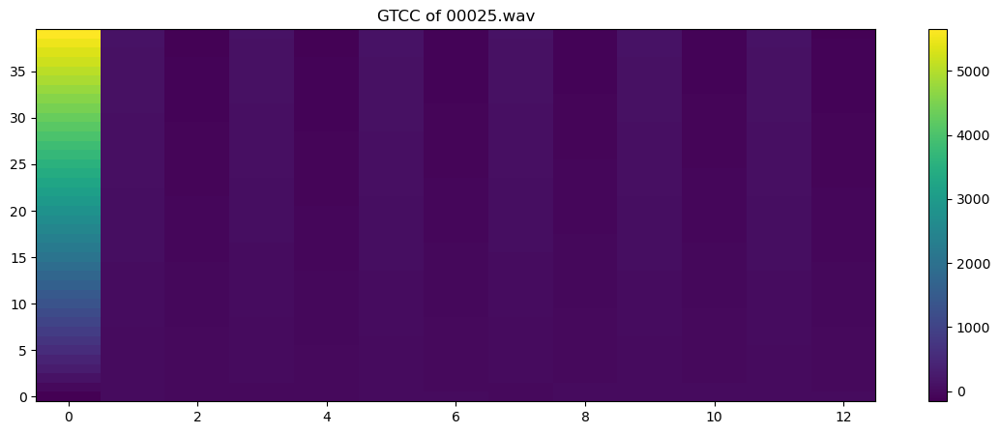

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00025.wav
	ZCR: [0.11621094 0.11425781 0.10400391 0.09960938 0.09716797 0.08691406
 0.08007812 0.08447266 0.08886719 0.10253906 0.12207031 0.1171875
 0.10791016 0.09716797 0.08300781 0.09326172 0.11474609 0.11767578
 0.12402344 0.13085938 0.10058594 0.11035156 0.11132812 0.08789062
 0.08837891 0.08984375 0.09326172 0.10302734 0.11523438 0.11669922
 0.11523438 0.12060547 0.12744141 0.125      0.12988281 0.12988281
 0.13720703 0.14355469 0.15283203 0.15917969 0.14990234 0.14648438
 0.13183594 0.11376953 0.12353516 0.14599609 0.13037109 0.12890625
 0.11279297 0.12353516 0.17773438 0.19726562 0.20654297 0.171875
 0.12792969 0.11083984 0.09423828 0.07324219 0.06396484 0.06689453
 0.08203125 0.10058594 0.11816406 0.12548828 0.12158203 0.12841797
 0.20458984 0.21972656 0.20214844 0.17919922 0.08740234 0.06689453
 0.06884766 0.06884766 0.07861328 0.08349609 0.10449219 0.13867188
 0.16308594 0.17578125 0.19677734 0.19482422 0.20458984 0.213

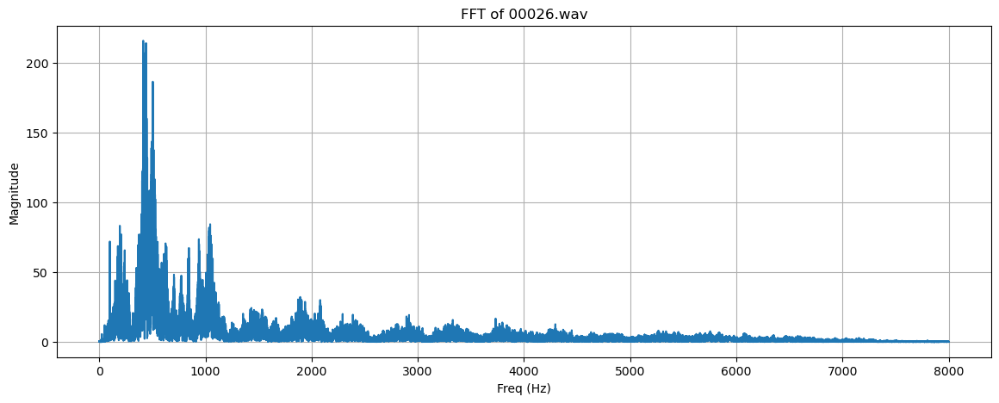

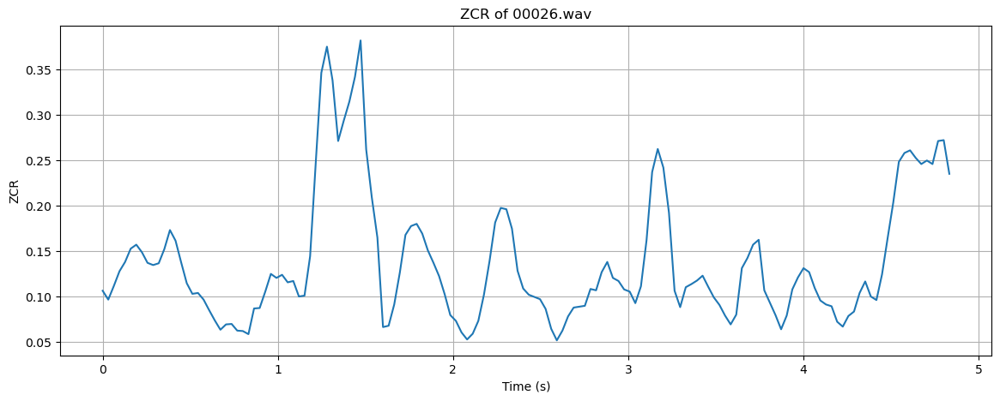

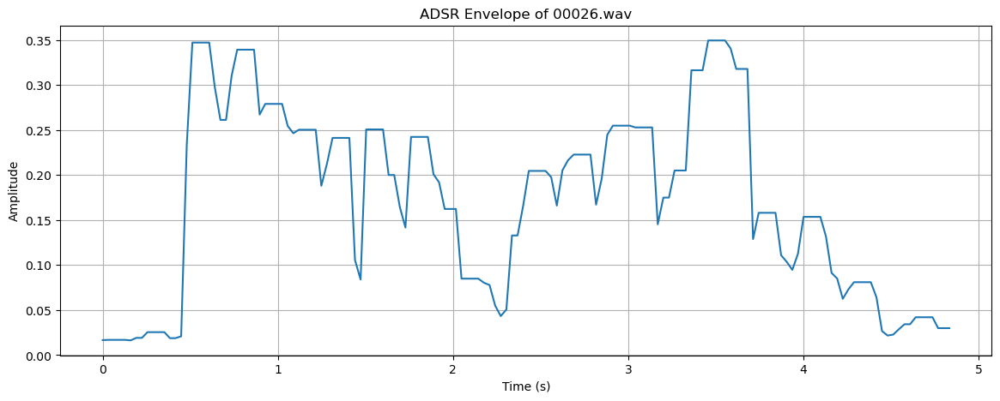

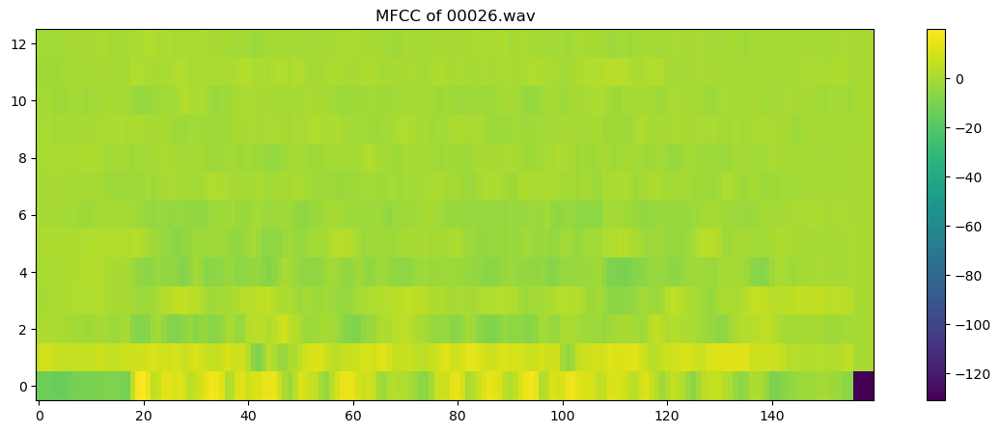

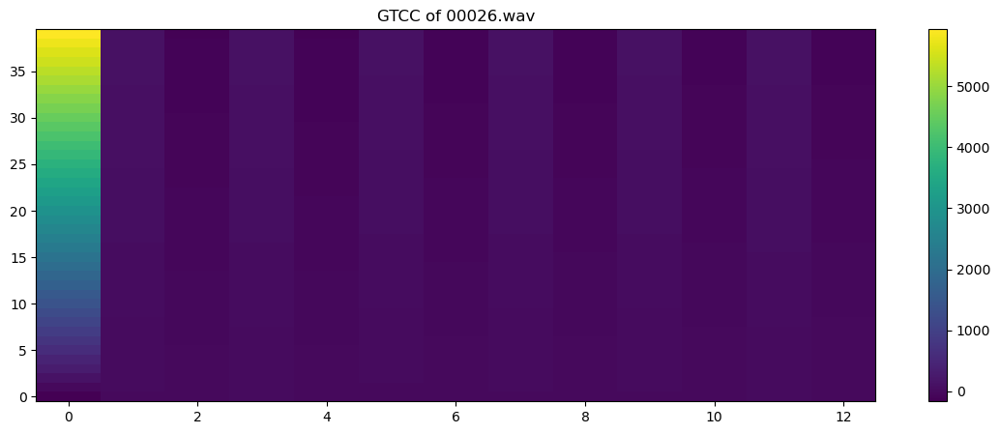

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00026.wav
	ZCR: [0.10595703 0.09619141 0.11132812 0.12744141 0.13769531 0.15234375
 0.15673828 0.1484375  0.13671875 0.13427734 0.13623047 0.15185547
 0.17285156 0.16113281 0.13720703 0.11425781 0.10253906 0.10351562
 0.09619141 0.08447266 0.07324219 0.06298828 0.06884766 0.06933594
 0.06201172 0.06152344 0.05810547 0.08642578 0.08691406 0.10498047
 0.12451172 0.12011719 0.12353516 0.11523438 0.11669922 0.09960938
 0.10058594 0.14404297 0.24658203 0.34619141 0.375      0.33789062
 0.27099609 0.29345703 0.31445312 0.34179688 0.38183594 0.26171875
 0.20898438 0.16455078 0.06591797 0.06738281 0.09082031 0.12597656
 0.16748047 0.17724609 0.1796875  0.16894531 0.15039062 0.13671875
 0.12207031 0.10205078 0.07910156 0.07275391 0.06005859 0.05224609
 0.05859375 0.07275391 0.1015625  0.13867188 0.18115234 0.19726562
 0.19580078 0.17431641 0.12792969 0.10839844 0.1015625  0.09912109
 0.09667969 0.0859375  0.06396484 0.05126953 0.06201172 0.

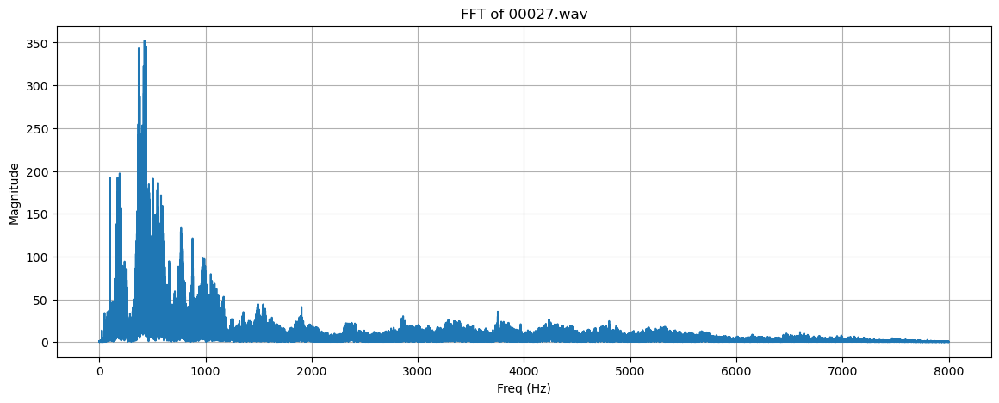

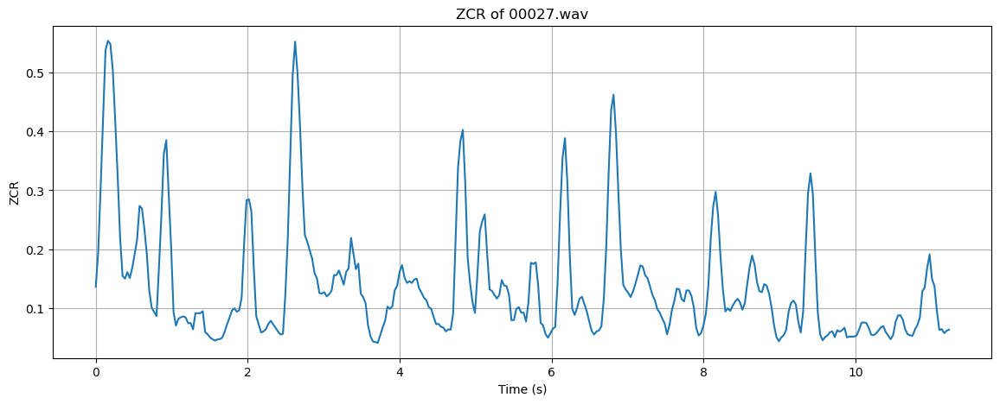

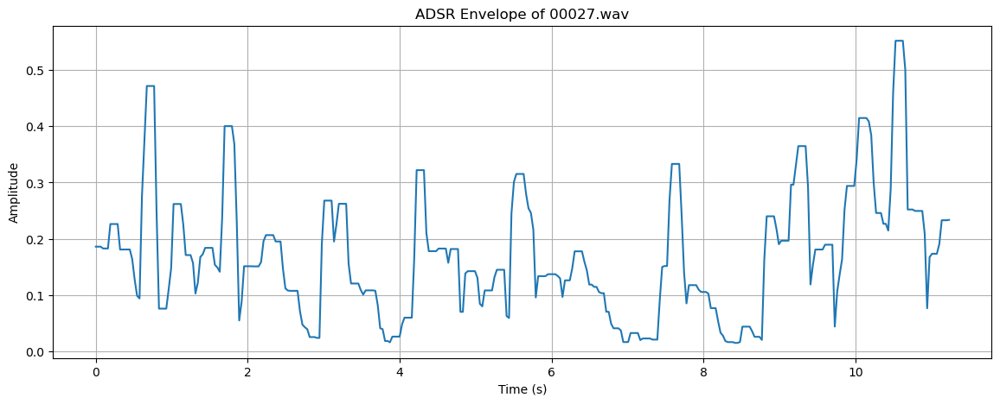

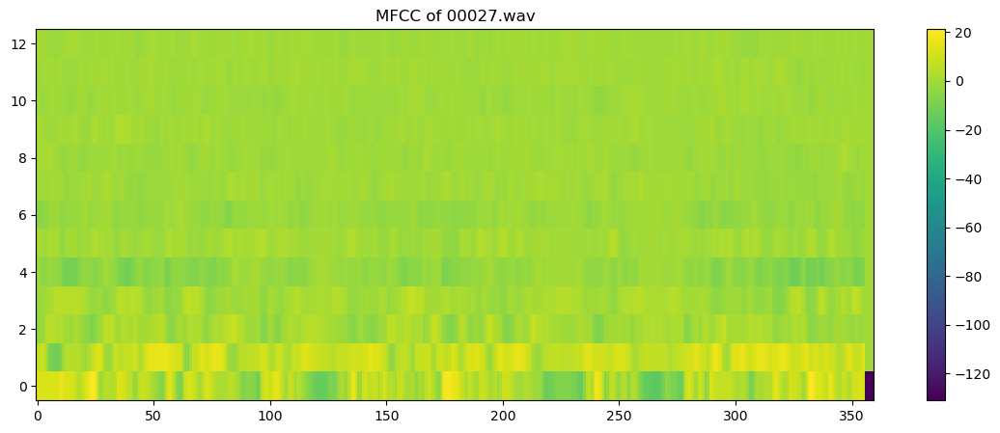

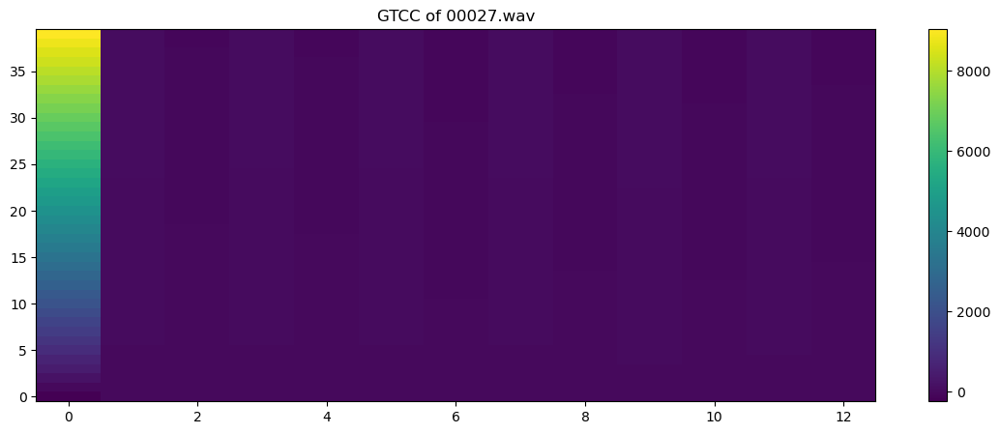

	processed: ../SpeakerVerification\id10270\5r0dWxy17C8\00027.wav
	ZCR: [0.13671875 0.1953125  0.30517578 0.42089844 0.53710938 0.55322266
 0.54785156 0.50341797 0.41796875 0.32421875 0.22119141 0.15527344
 0.15039062 0.16113281 0.15136719 0.16845703 0.19189453 0.21679688
 0.2734375  0.26904297 0.234375   0.19189453 0.12988281 0.1015625
 0.09375    0.08691406 0.16992188 0.25830078 0.36181641 0.38476562
 0.29541016 0.20361328 0.09326172 0.07080078 0.08251953 0.08496094
 0.08642578 0.08447266 0.07470703 0.07519531 0.06445312 0.09179688
 0.09179688 0.09179688 0.09521484 0.05957031 0.05615234 0.05078125
 0.04785156 0.04541016 0.04736328 0.04785156 0.05029297 0.06005859
 0.07275391 0.08398438 0.09619141 0.10009766 0.09423828 0.09667969
 0.11816406 0.20751953 0.28320312 0.28466797 0.26464844 0.16894531
 0.08691406 0.07324219 0.05908203 0.06103516 0.06494141 0.07373047
 0.07910156 0.07275391 0.06689453 0.06054688 0.05566406 0.05712891
 0.125      0.22119141 0.35595703 0.49462891 0.55175781 0.4

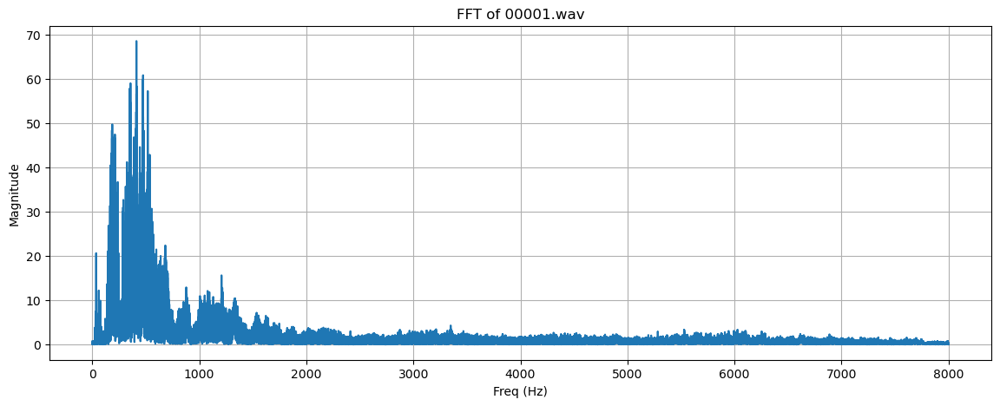

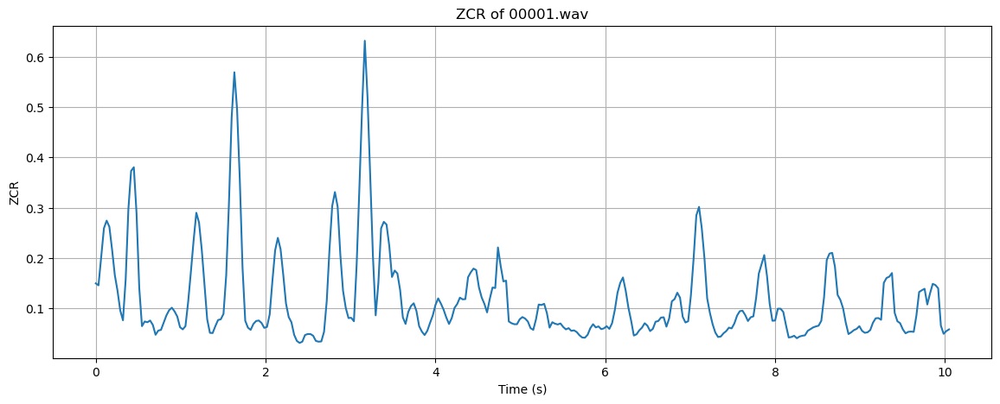

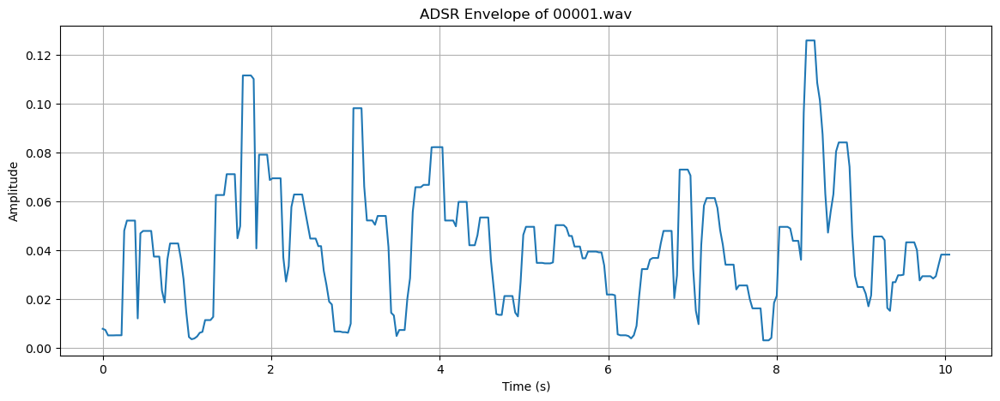

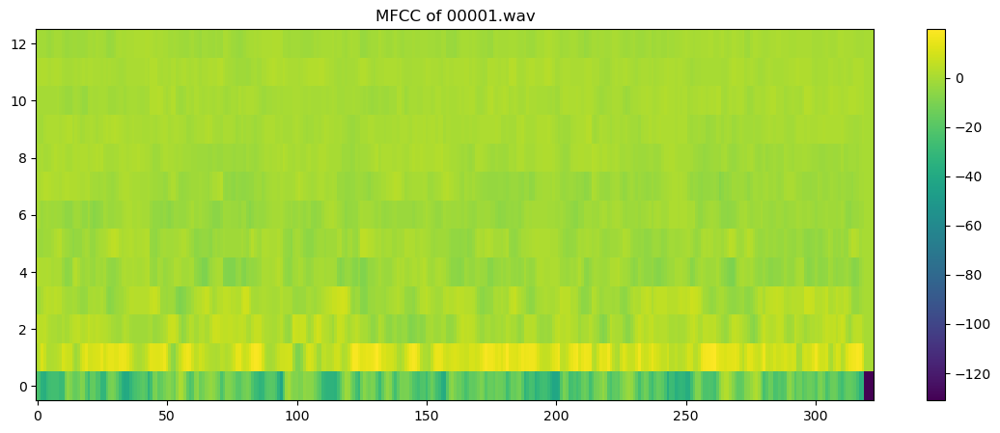

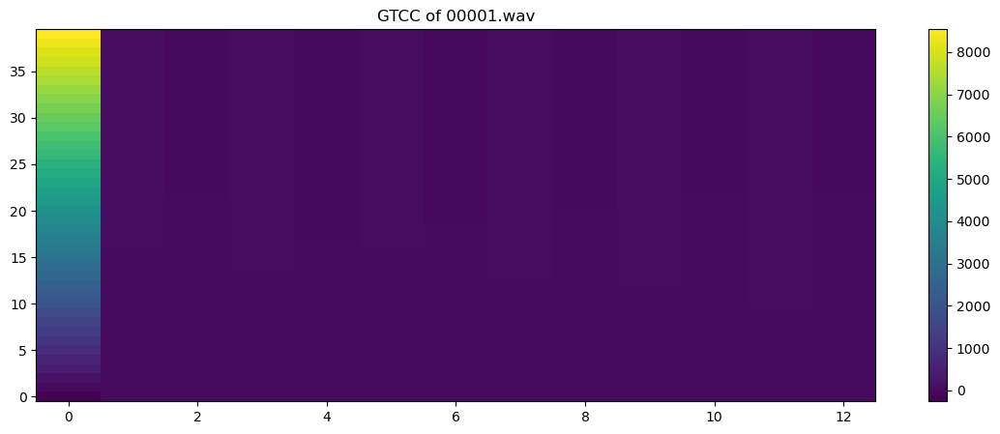

	processed: ../SpeakerVerification\id10270\5sJomL_D0_g\00001.wav
	ZCR: [0.14990234 0.14599609 0.203125   0.25927734 0.27441406 0.26220703
 0.21679688 0.16650391 0.13525391 0.09619141 0.07666016 0.15771484
 0.29736328 0.37304688 0.38037109 0.2890625  0.140625   0.06494141
 0.07421875 0.07275391 0.07617188 0.06738281 0.04785156 0.05615234
 0.05761719 0.07226562 0.08642578 0.09667969 0.1015625  0.09423828
 0.08398438 0.06298828 0.05859375 0.06494141 0.11328125 0.17285156
 0.23486328 0.29003906 0.27050781 0.21679688 0.14697266 0.07861328
 0.05175781 0.05126953 0.06494141 0.07714844 0.07861328 0.08935547
 0.16601562 0.30810547 0.47900391 0.56884766 0.49511719 0.35595703
 0.18164062 0.07568359 0.06201172 0.05761719 0.06933594 0.07519531
 0.07617188 0.07128906 0.06152344 0.06347656 0.08837891 0.15478516
 0.21533203 0.24023438 0.21777344 0.16650391 0.10986328 0.08300781
 0.07275391 0.04785156 0.03564453 0.03173828 0.03417969 0.04736328
 0.04931641 0.04931641 0.04589844 0.03564453 0.03417969 0.

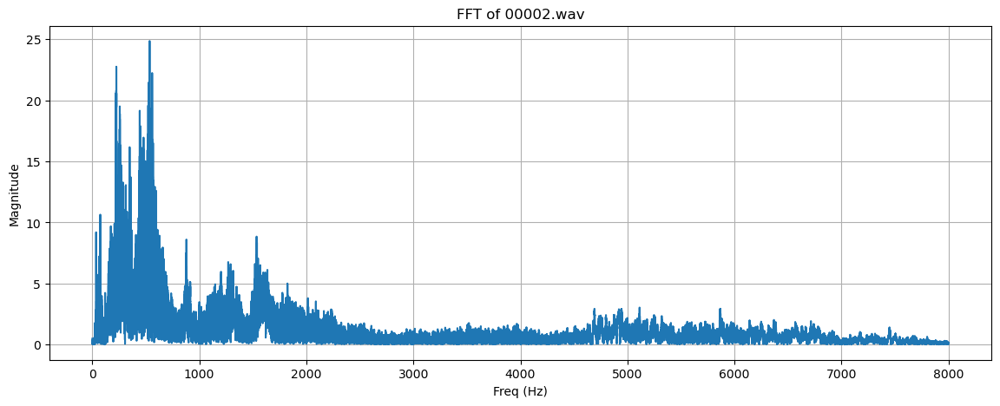

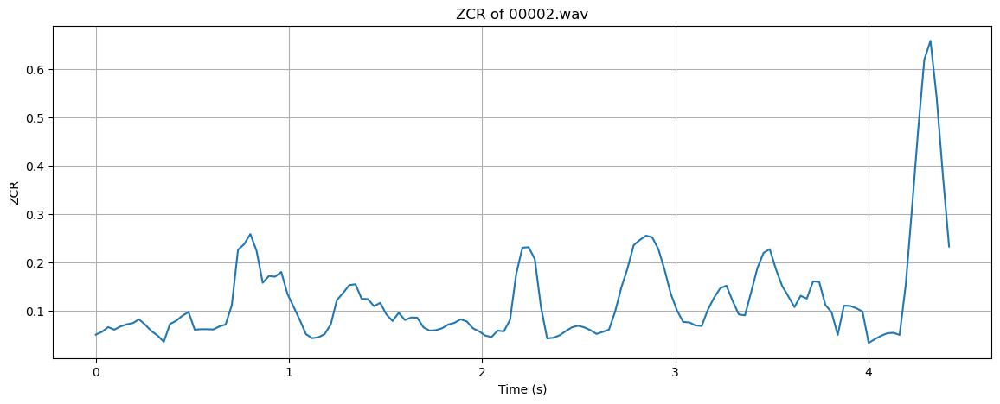

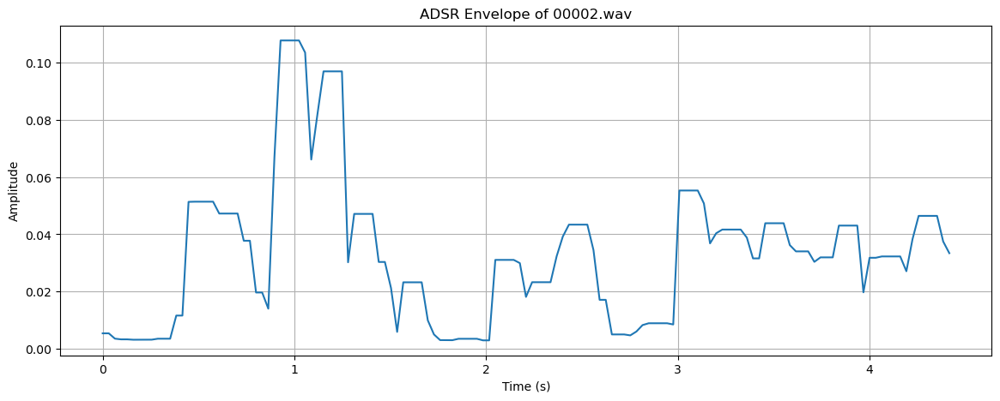

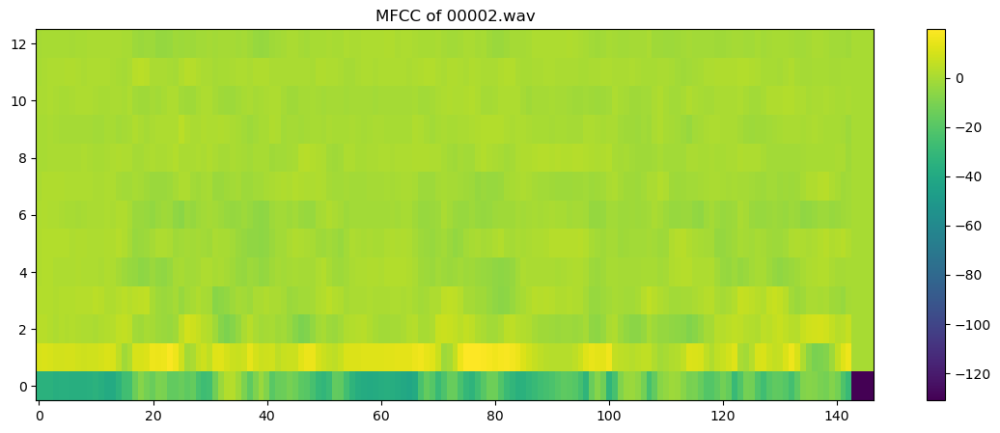

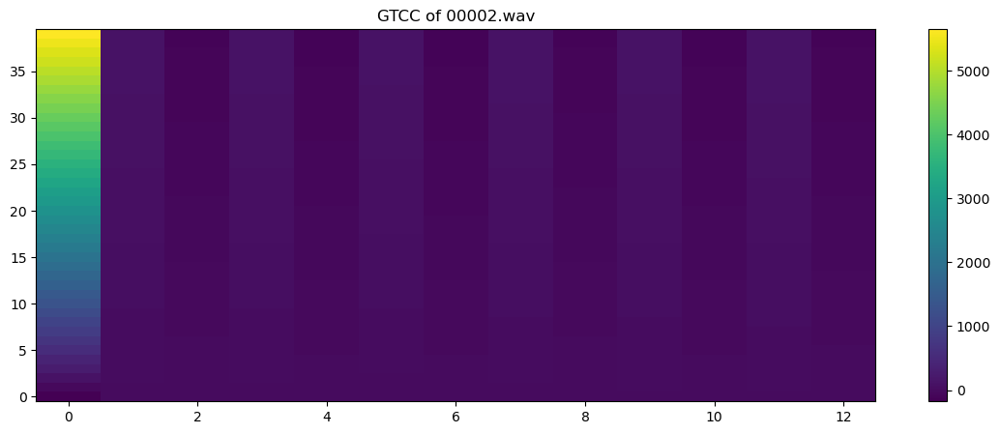

	processed: ../SpeakerVerification\id10270\5sJomL_D0_g\00002.wav
	ZCR: [0.05029297 0.05615234 0.06591797 0.06054688 0.06738281 0.07177734
 0.07421875 0.08203125 0.07080078 0.05761719 0.04833984 0.03564453
 0.07226562 0.07910156 0.08935547 0.09716797 0.06054688 0.06152344
 0.06152344 0.06103516 0.06738281 0.07128906 0.11132812 0.22607422
 0.23779297 0.25878906 0.22412109 0.15771484 0.171875   0.17041016
 0.18017578 0.13476562 0.10791016 0.08056641 0.05126953 0.04296875
 0.04492188 0.05126953 0.07128906 0.12207031 0.13671875 0.15283203
 0.15478516 0.12451172 0.12402344 0.109375   0.11621094 0.09228516
 0.07861328 0.09570312 0.08056641 0.0859375  0.08544922 0.06542969
 0.05859375 0.05957031 0.06347656 0.07128906 0.07470703 0.08203125
 0.07763672 0.06347656 0.05712891 0.04833984 0.04541016 0.05859375
 0.05712891 0.08105469 0.17626953 0.23046875 0.23144531 0.20703125
 0.10742188 0.04248047 0.04394531 0.04882812 0.05761719 0.06542969
 0.06884766 0.06542969 0.05957031 0.05175781 0.05615234 0.

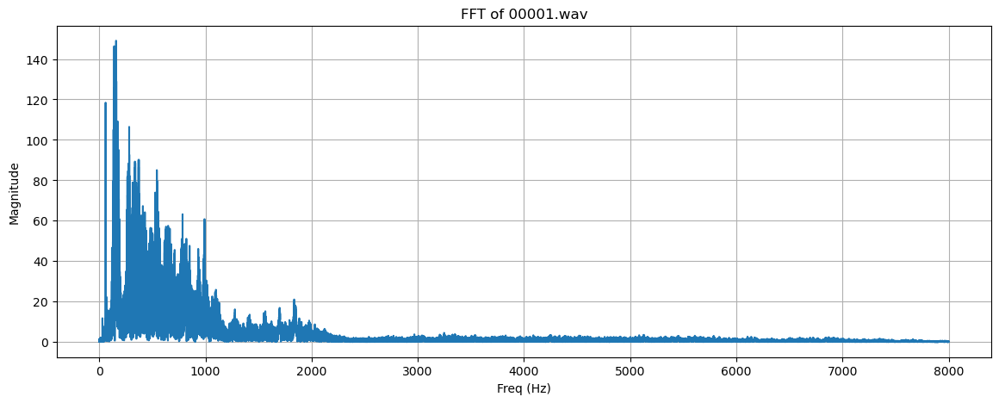

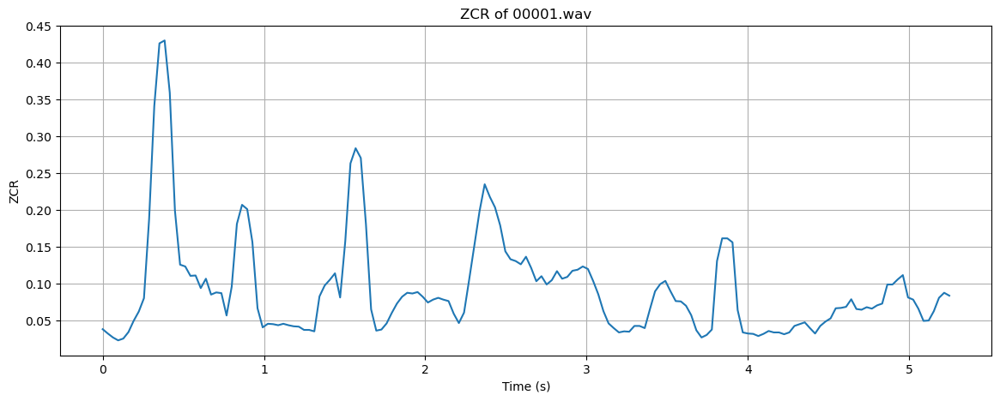

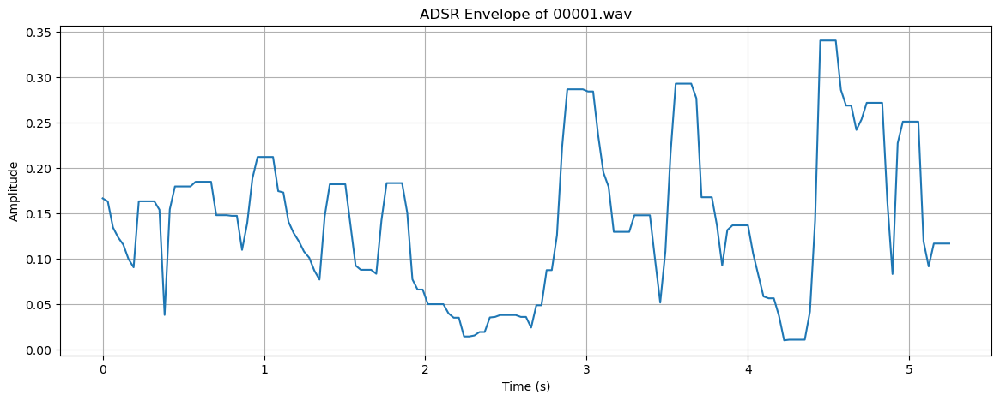

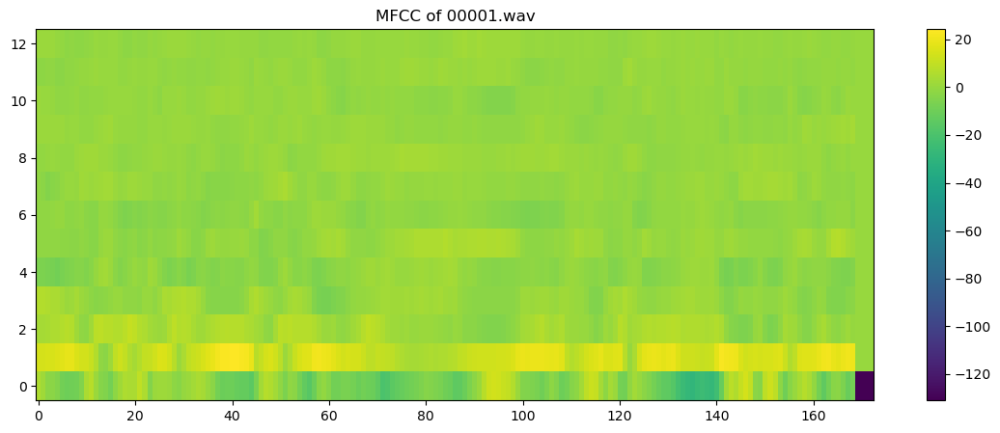

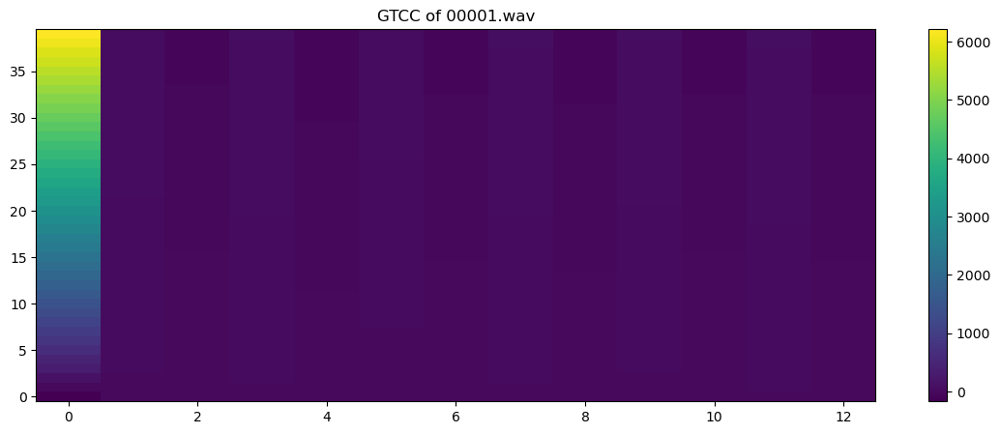

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00001.wav
	ZCR: [0.03857422 0.03271484 0.02734375 0.0234375  0.02587891 0.03466797
 0.04980469 0.0625     0.08056641 0.18798828 0.34082031 0.42578125
 0.4296875  0.35888672 0.19921875 0.12597656 0.12353516 0.11083984
 0.11132812 0.09423828 0.10693359 0.08544922 0.08837891 0.08740234
 0.05712891 0.09619141 0.18115234 0.20703125 0.20117188 0.15673828
 0.06689453 0.04101562 0.04589844 0.04541016 0.04394531 0.04589844
 0.04394531 0.04248047 0.04199219 0.03759766 0.03759766 0.03564453
 0.08300781 0.09765625 0.10546875 0.11425781 0.08154297 0.15820312
 0.26318359 0.28369141 0.27050781 0.18066406 0.06542969 0.03662109
 0.03808594 0.04638672 0.06054688 0.07324219 0.08251953 0.08789062
 0.08691406 0.08886719 0.08251953 0.07470703 0.07861328 0.08105469
 0.07861328 0.07666016 0.05957031 0.046875   0.06103516 0.10595703
 0.15185547 0.19824219 0.23486328 0.21777344 0.20361328 0.17919922
 0.14404297 0.13330078 0.13085938 0.12646484 0.13671875 0.

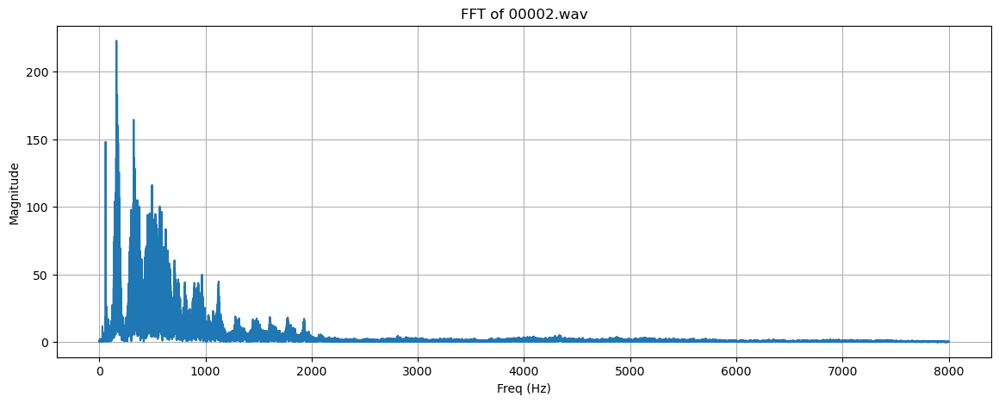

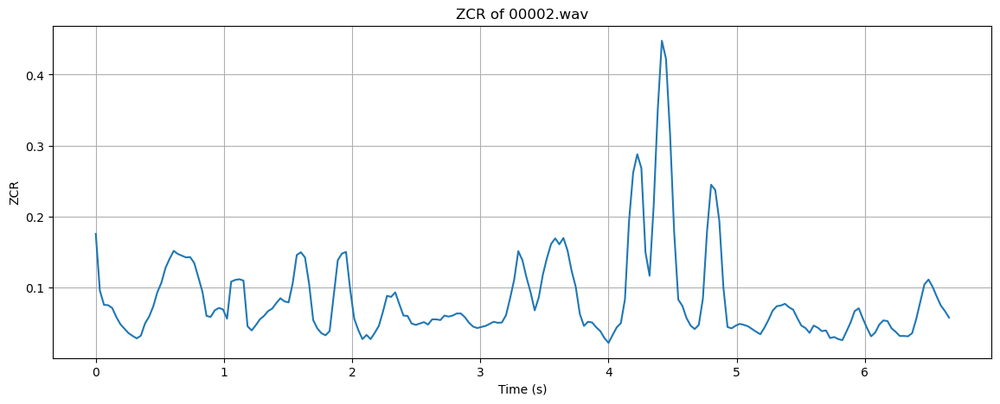

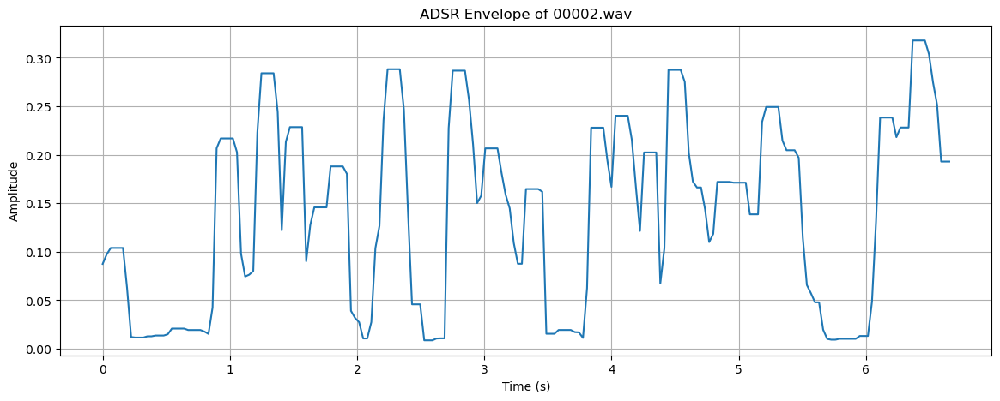

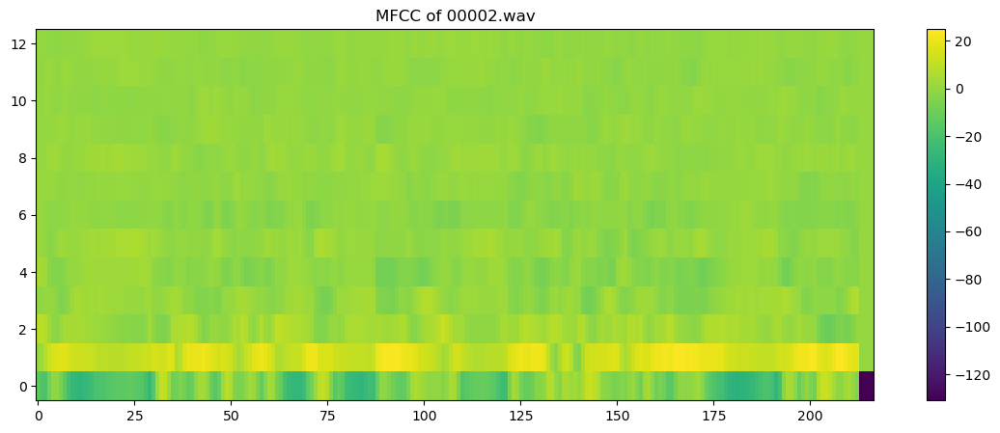

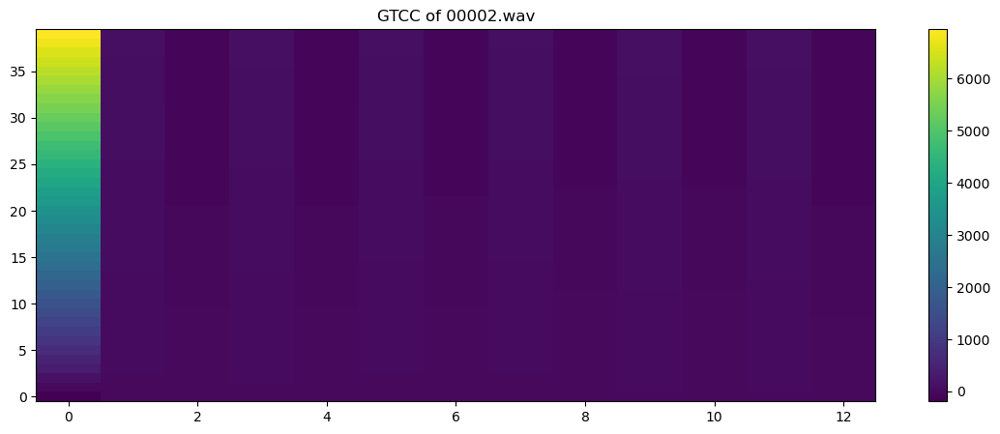

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00002.wav
	ZCR: [0.17529297 0.09521484 0.07519531 0.07470703 0.07080078 0.05810547
 0.04785156 0.04150391 0.03515625 0.03125    0.02783203 0.03173828
 0.04882812 0.05859375 0.07275391 0.09277344 0.10644531 0.12744141
 0.14013672 0.15136719 0.14697266 0.14453125 0.14208984 0.14257812
 0.13427734 0.11376953 0.09375    0.05957031 0.05810547 0.06738281
 0.07080078 0.06884766 0.05566406 0.10791016 0.11035156 0.11132812
 0.109375   0.04492188 0.0390625  0.04638672 0.0546875  0.05957031
 0.06640625 0.06982422 0.07763672 0.08447266 0.08007812 0.07861328
 0.10546875 0.14550781 0.14941406 0.14208984 0.10498047 0.05371094
 0.04199219 0.03515625 0.03222656 0.03808594 0.08837891 0.13818359
 0.14746094 0.14990234 0.09765625 0.05566406 0.03955078 0.02685547
 0.03271484 0.02685547 0.03564453 0.04541016 0.06542969 0.08789062
 0.08642578 0.09277344 0.07617188 0.06005859 0.05957031 0.04882812
 0.046875   0.04882812 0.05078125 0.04736328 0.0546875  0.

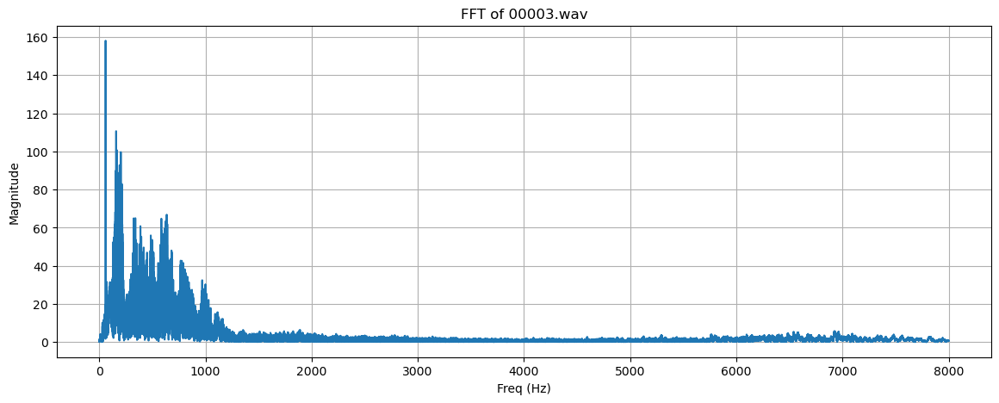

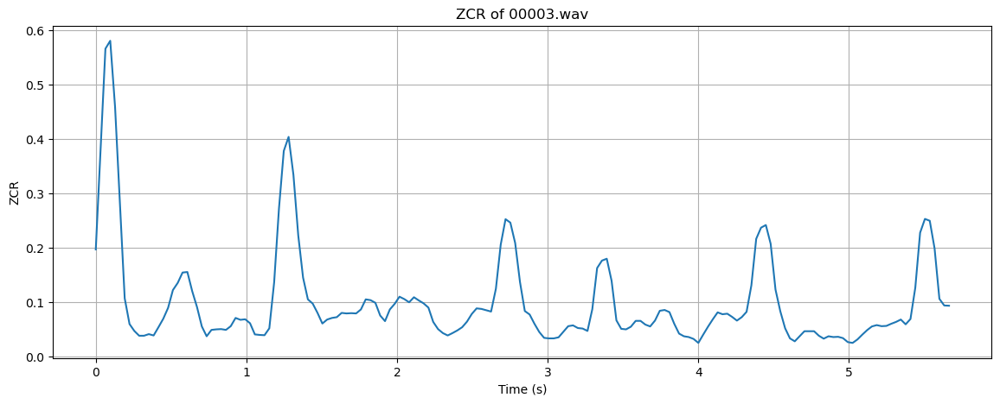

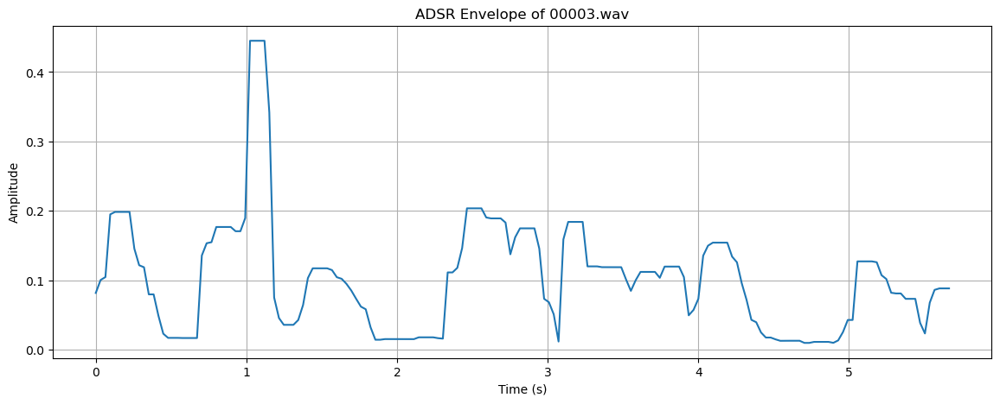

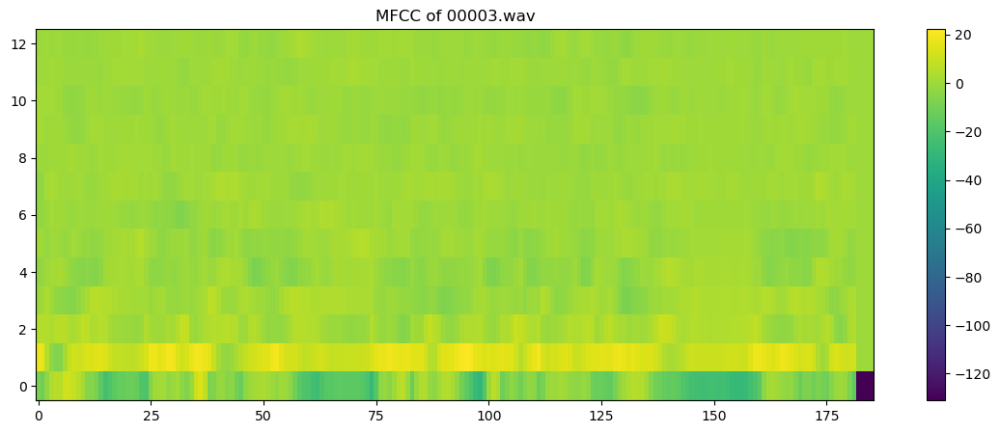

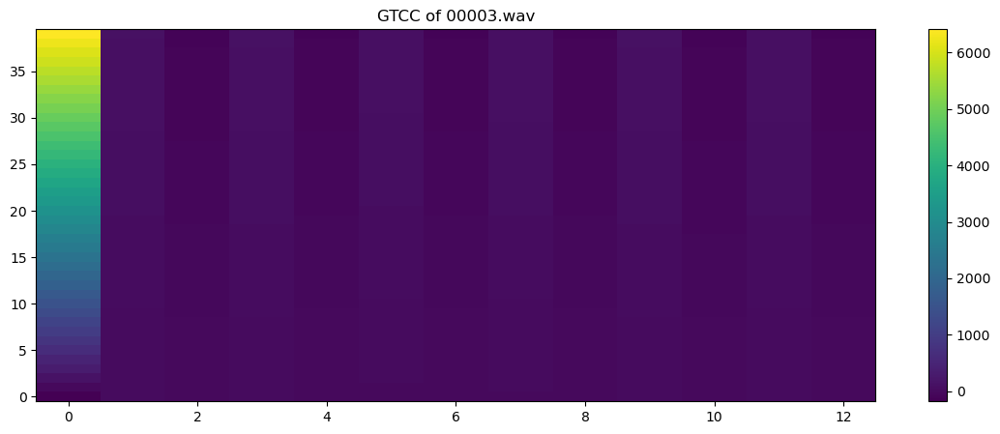

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00003.wav
	ZCR: [0.19628906 0.38183594 0.56542969 0.58007812 0.45849609 0.28222656
 0.10644531 0.05908203 0.04638672 0.03759766 0.03759766 0.04052734
 0.03808594 0.05322266 0.06884766 0.08886719 0.12158203 0.13476562
 0.15380859 0.15478516 0.11962891 0.09033203 0.0546875  0.03662109
 0.04833984 0.04931641 0.04980469 0.04833984 0.05517578 0.0703125
 0.06689453 0.06787109 0.06054688 0.04003906 0.0390625  0.03857422
 0.05126953 0.13574219 0.27148438 0.37744141 0.40332031 0.33349609
 0.22216797 0.14453125 0.10449219 0.09667969 0.07958984 0.06005859
 0.06738281 0.0703125  0.07177734 0.07958984 0.07861328 0.07910156
 0.07861328 0.0859375  0.10449219 0.10302734 0.09814453 0.07470703
 0.06445312 0.0859375  0.09619141 0.109375   0.10498047 0.09912109
 0.10839844 0.10253906 0.09716797 0.08935547 0.06298828 0.04980469
 0.04248047 0.03808594 0.04248047 0.04736328 0.05322266 0.06347656
 0.07763672 0.08789062 0.08691406 0.08447266 0.08203125 0.1

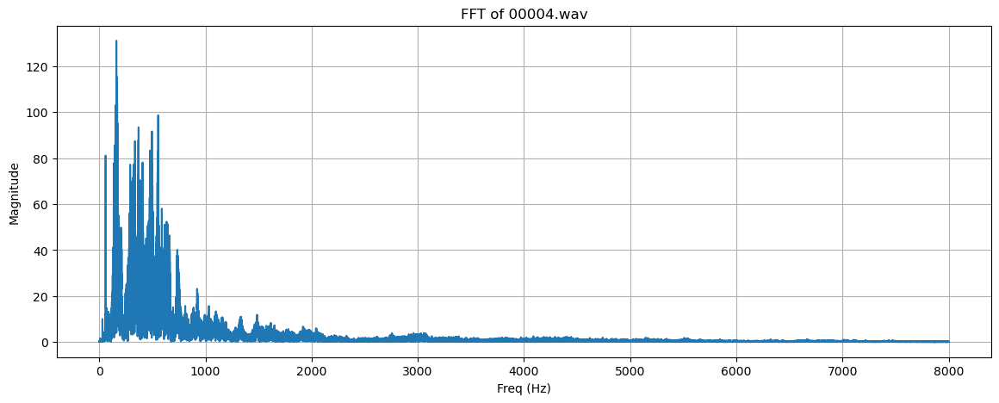

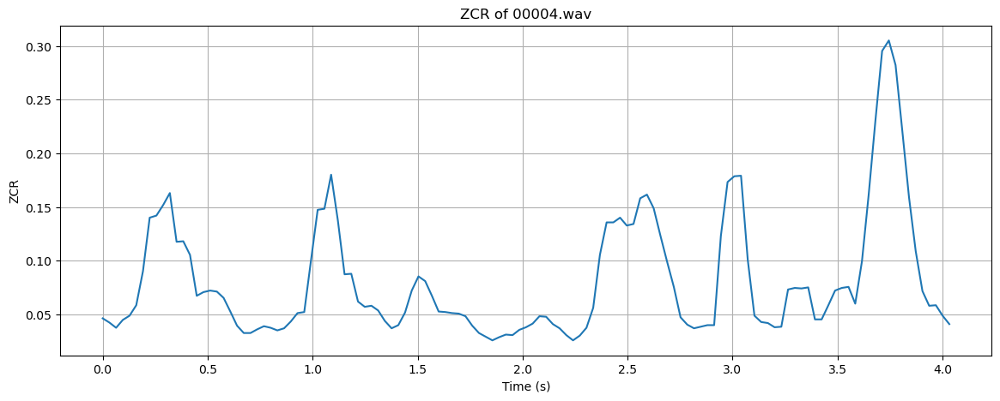

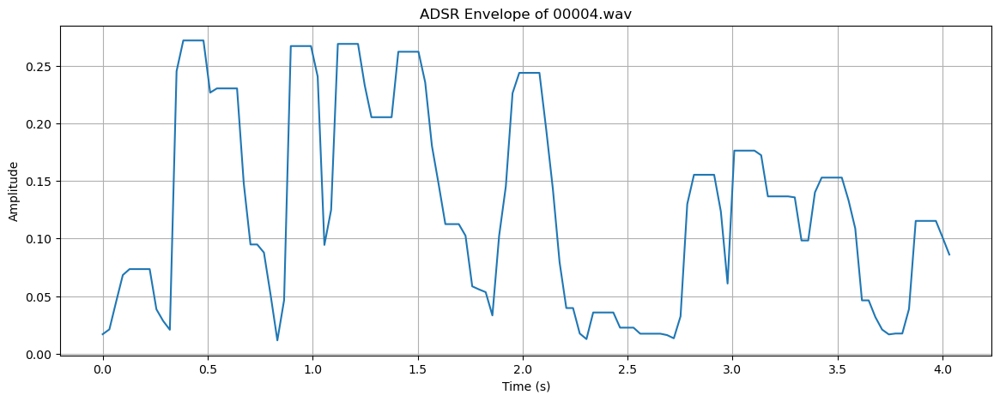

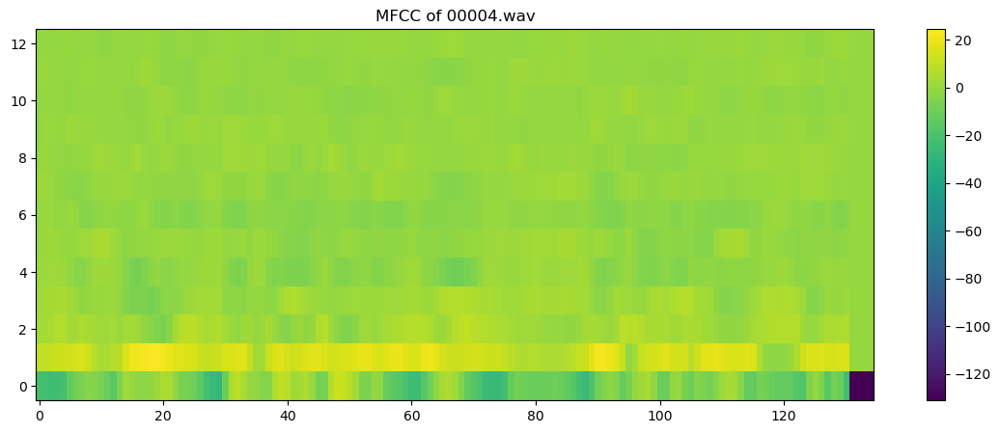

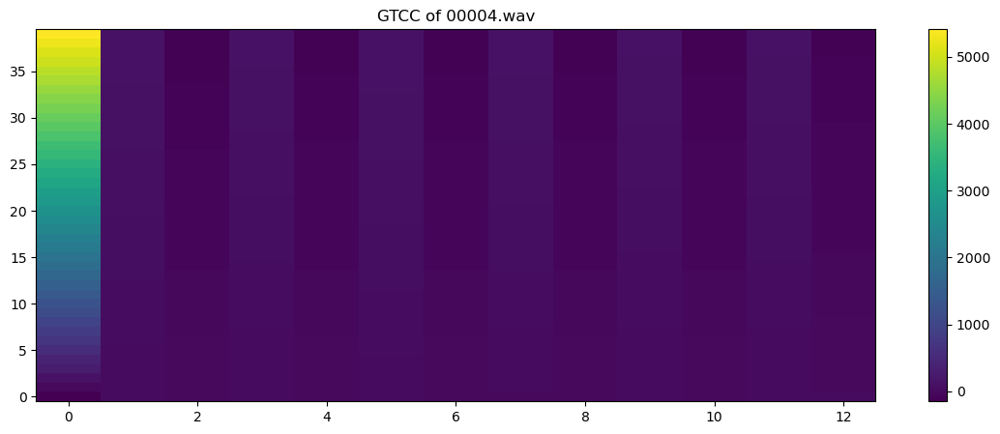

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00004.wav
	ZCR: [0.04638672 0.04248047 0.03759766 0.04492188 0.04882812 0.05859375
 0.09033203 0.14013672 0.14208984 0.15185547 0.16308594 0.11767578
 0.11816406 0.10546875 0.06738281 0.07080078 0.07226562 0.07128906
 0.06542969 0.05273438 0.03955078 0.03271484 0.03271484 0.03613281
 0.0390625  0.03759766 0.03515625 0.03710938 0.04345703 0.05126953
 0.05224609 0.10009766 0.14746094 0.1484375  0.18017578 0.13769531
 0.08740234 0.08789062 0.06201172 0.05712891 0.05810547 0.05371094
 0.04394531 0.03710938 0.04003906 0.05175781 0.07226562 0.08544922
 0.08105469 0.06738281 0.05273438 0.05224609 0.05126953 0.05078125
 0.04833984 0.03955078 0.03271484 0.02929688 0.02587891 0.02880859
 0.03125    0.03076172 0.03564453 0.03808594 0.04150391 0.04833984
 0.04785156 0.04101562 0.03710938 0.03076172 0.02587891 0.03027344
 0.03759766 0.05615234 0.10546875 0.13574219 0.13574219 0.14013672
 0.1328125  0.13427734 0.15820312 0.16162109 0.14892578 0.

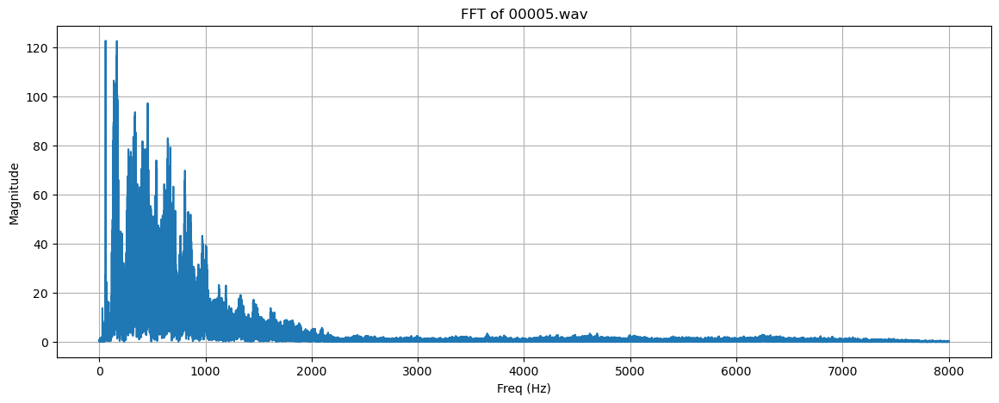

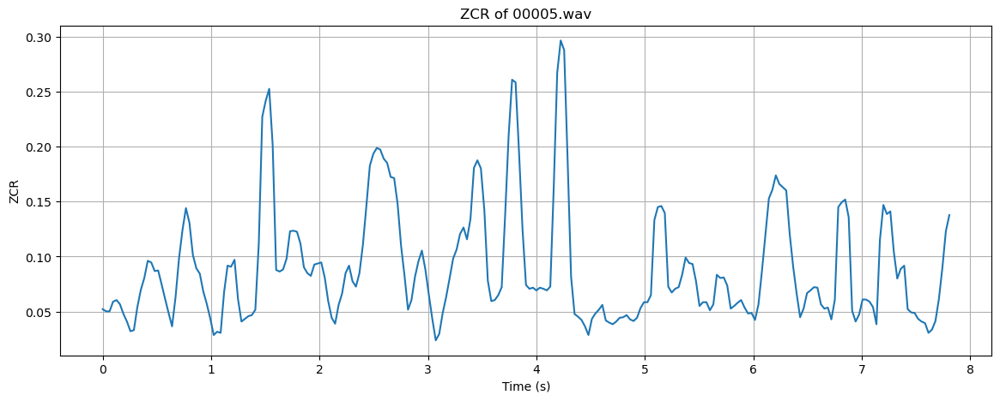

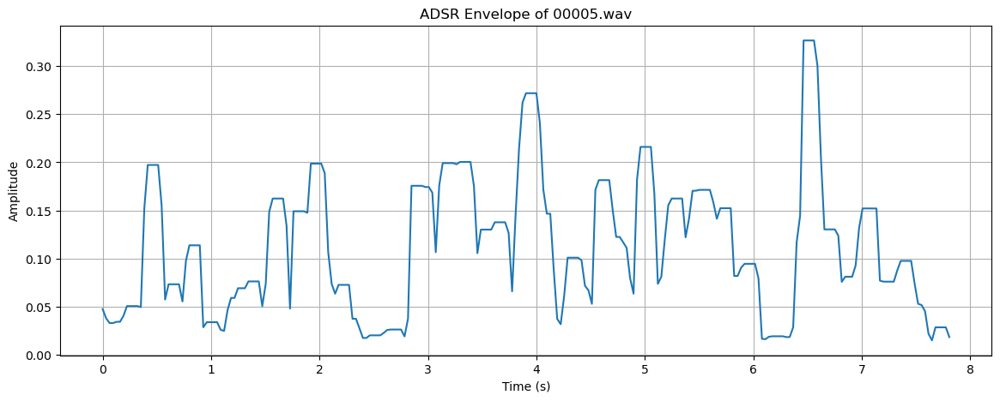

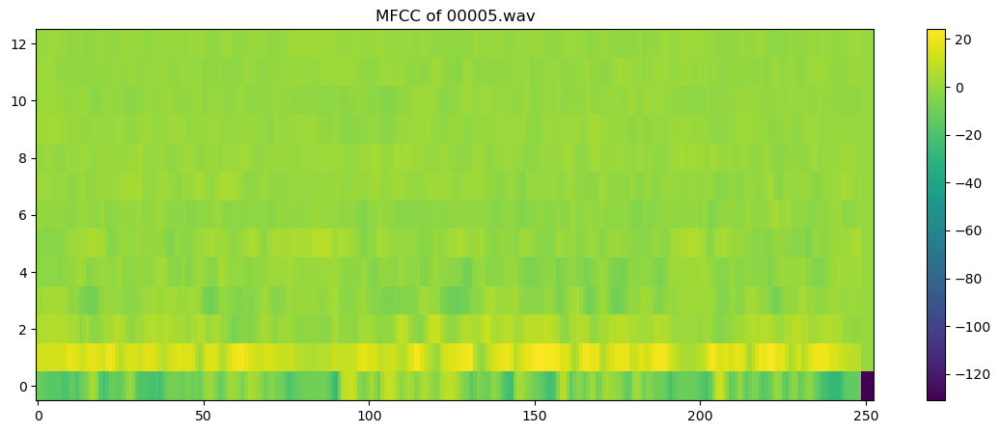

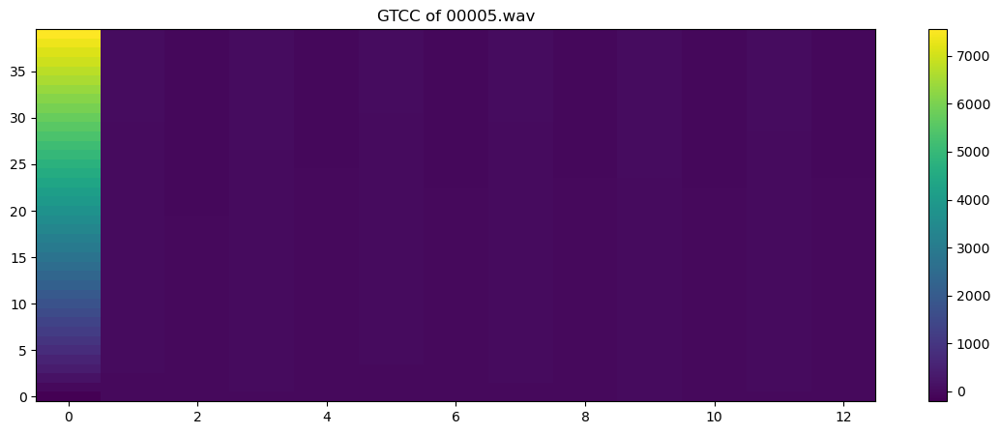

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00005.wav
	ZCR: [0.05224609 0.05029297 0.05029297 0.05908203 0.06054688 0.05664062
 0.04785156 0.04101562 0.03222656 0.03320312 0.05419922 0.06982422
 0.08056641 0.09619141 0.09472656 0.08691406 0.08740234 0.07470703
 0.06152344 0.04882812 0.03662109 0.06298828 0.09814453 0.12402344
 0.14404297 0.13085938 0.1015625  0.08935547 0.08447266 0.06835938
 0.05712891 0.04394531 0.02880859 0.03173828 0.03076172 0.06787109
 0.09179688 0.09082031 0.09716797 0.06152344 0.04101562 0.04345703
 0.04589844 0.046875   0.05175781 0.11230469 0.22705078 0.24169922
 0.25244141 0.20117188 0.08789062 0.08642578 0.08837891 0.09814453
 0.12304688 0.12353516 0.12255859 0.11181641 0.09033203 0.08496094
 0.08251953 0.09277344 0.09375    0.09472656 0.08105469 0.05957031
 0.04443359 0.0390625  0.05615234 0.06640625 0.08496094 0.09179688
 0.07763672 0.07275391 0.08496094 0.11083984 0.14599609 0.18261719
 0.19335938 0.19873047 0.19726562 0.18896484 0.18505859 0.

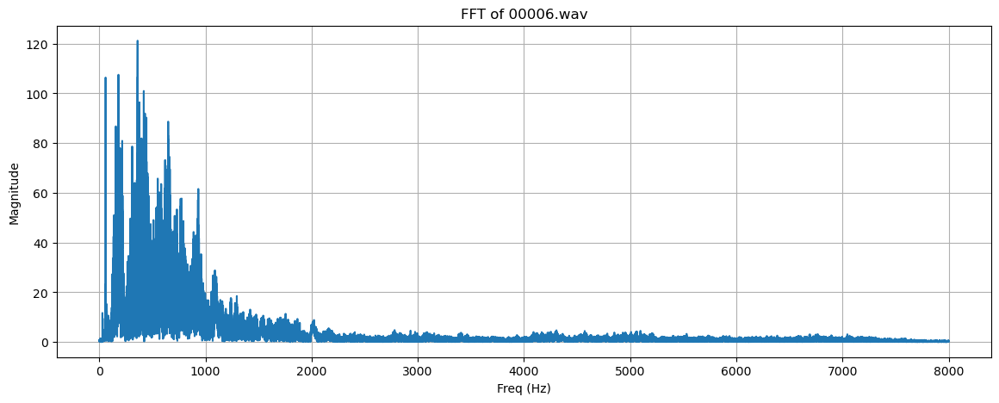

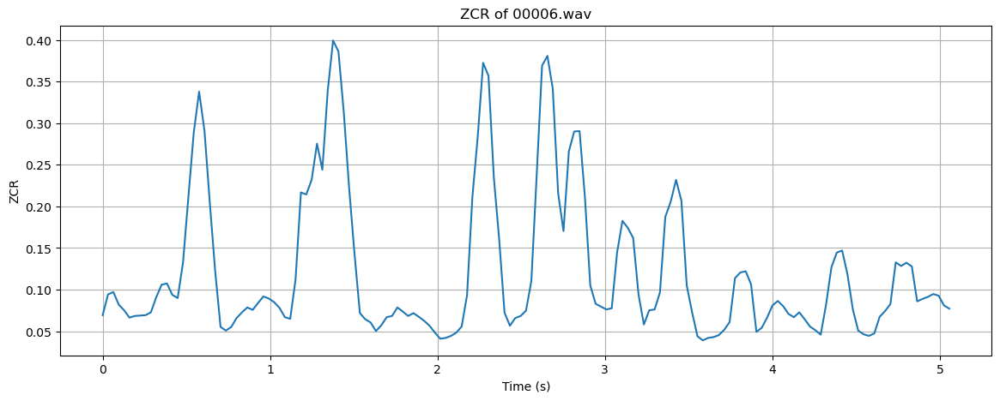

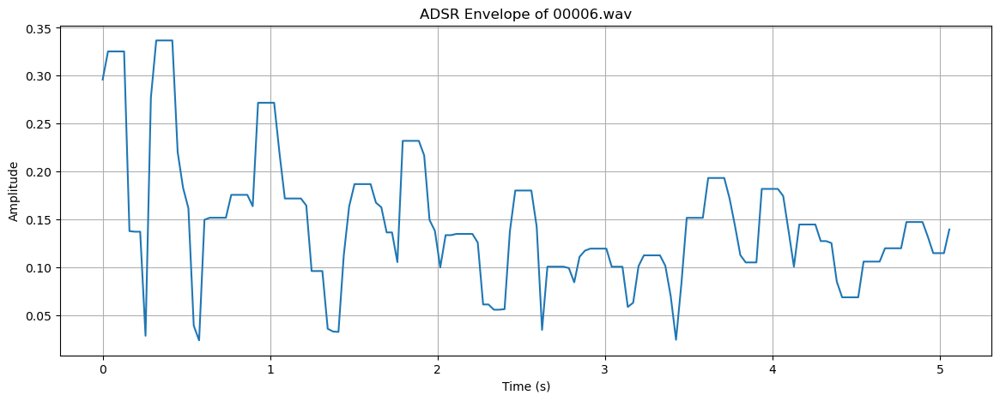

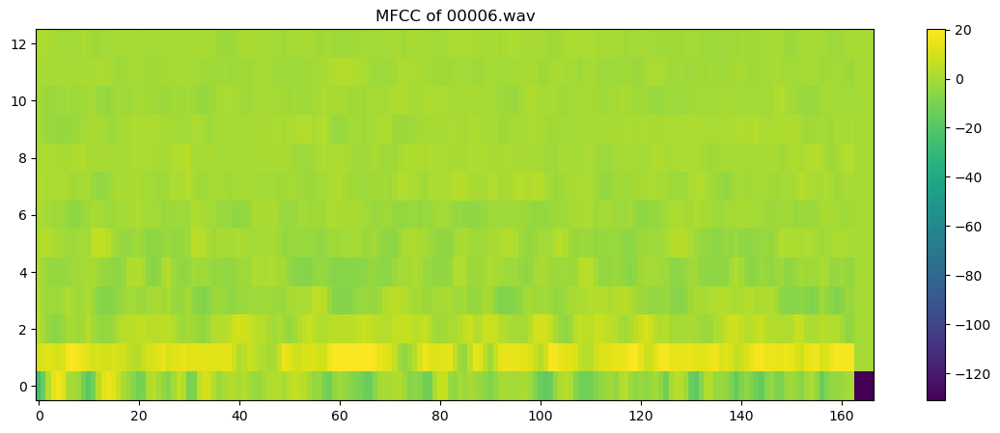

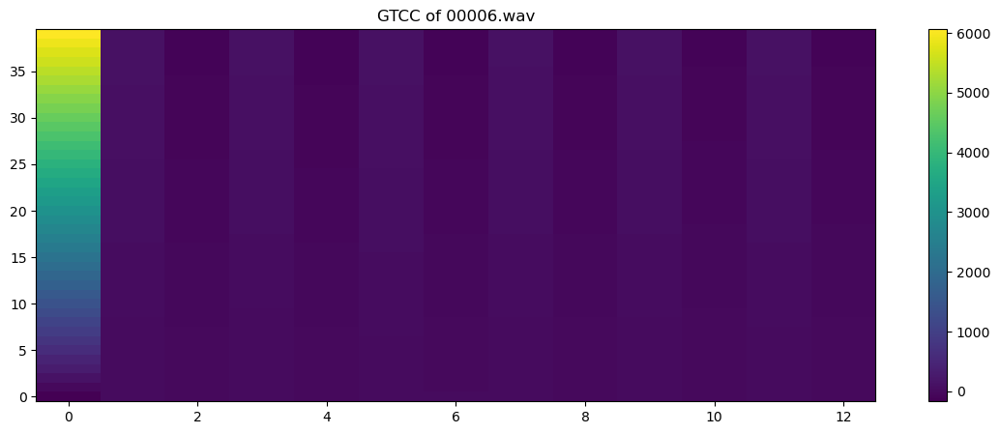

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00006.wav
	ZCR: [0.06933594 0.09423828 0.09716797 0.08203125 0.07519531 0.06640625
 0.06835938 0.06884766 0.06933594 0.07275391 0.09082031 0.10595703
 0.10742188 0.09375    0.08984375 0.1328125  0.21142578 0.28857422
 0.33789062 0.29101562 0.20410156 0.12207031 0.05517578 0.05078125
 0.05517578 0.06591797 0.07275391 0.07861328 0.07568359 0.08398438
 0.09179688 0.08935547 0.08496094 0.078125   0.06689453 0.06494141
 0.11230469 0.21679688 0.21435547 0.23193359 0.27539062 0.24414062
 0.33886719 0.39941406 0.38623047 0.31298828 0.22167969 0.14306641
 0.07177734 0.06445312 0.06054688 0.05029297 0.05712891 0.06689453
 0.06835938 0.07861328 0.07373047 0.06835938 0.07177734 0.06738281
 0.0625     0.05664062 0.04833984 0.04101562 0.04199219 0.04443359
 0.04833984 0.05566406 0.09326172 0.21142578 0.28417969 0.37255859
 0.35693359 0.23486328 0.16015625 0.07226562 0.05664062 0.06591797
 0.06835938 0.07470703 0.11035156 0.23779297 0.36914062 0.

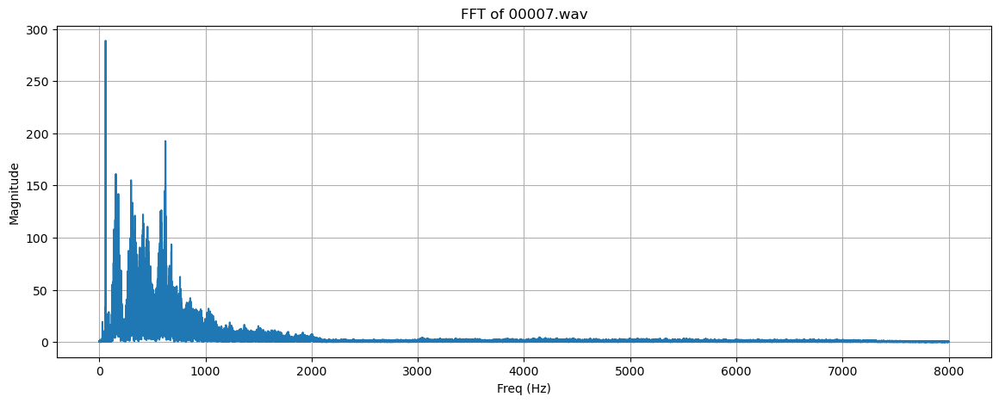

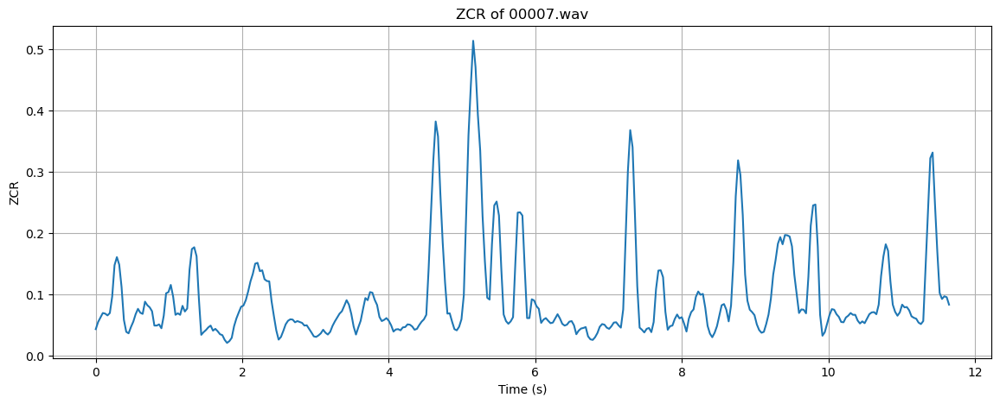

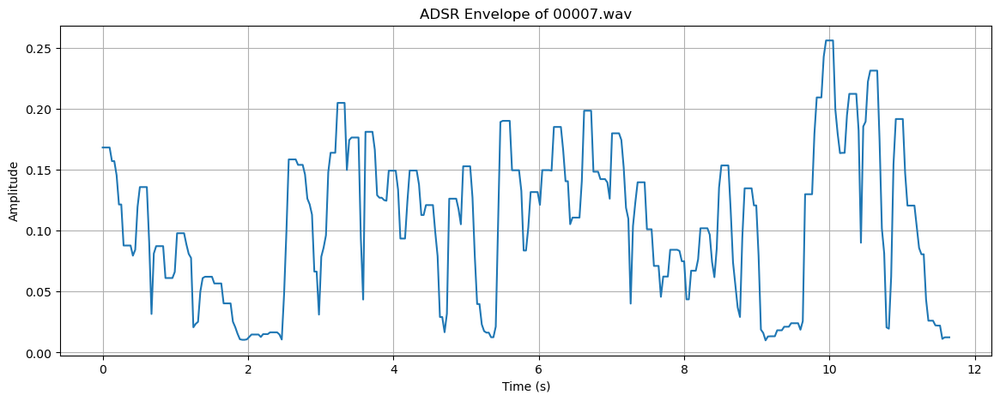

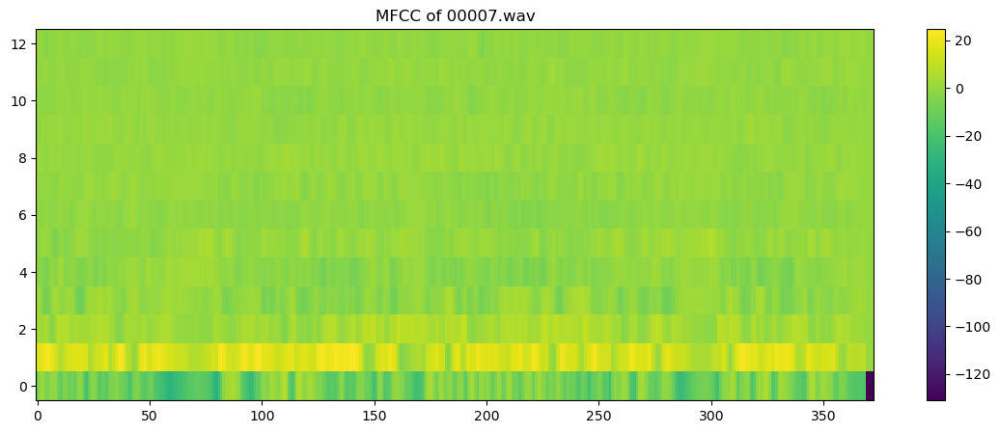

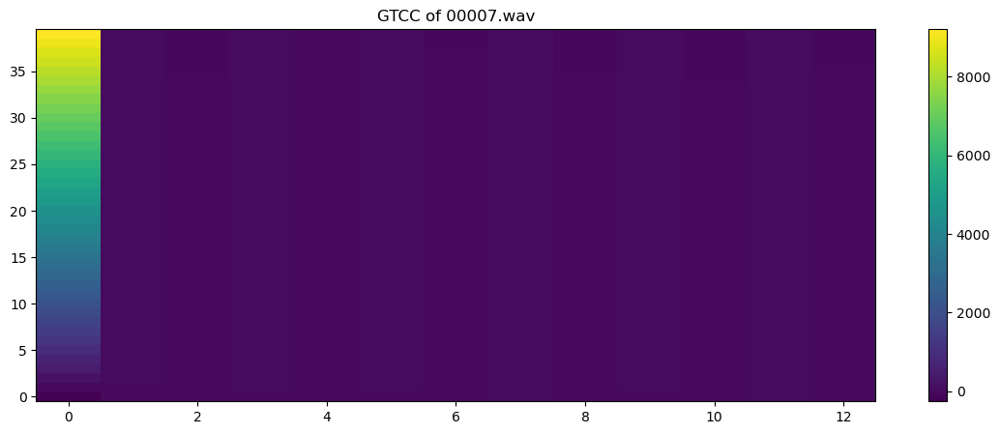

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00007.wav
	ZCR: [0.04296875 0.0546875  0.06201172 0.06933594 0.06835938 0.06542969
 0.06933594 0.09619141 0.14746094 0.16064453 0.1484375  0.11181641
 0.05810547 0.03857422 0.03613281 0.04638672 0.05517578 0.06738281
 0.07617188 0.06982422 0.06787109 0.08789062 0.08203125 0.07861328
 0.07226562 0.04882812 0.04882812 0.05078125 0.04443359 0.06494141
 0.1015625  0.10351562 0.11523438 0.09619141 0.06640625 0.06884766
 0.06640625 0.08105469 0.07177734 0.07666016 0.14013672 0.17382812
 0.17675781 0.16210938 0.09179688 0.03369141 0.03808594 0.04150391
 0.04589844 0.04882812 0.04052734 0.04345703 0.03955078 0.03466797
 0.03320312 0.02539062 0.02050781 0.0234375  0.02880859 0.04785156
 0.06054688 0.0703125  0.07958984 0.08154297 0.09033203 0.10449219
 0.12109375 0.13330078 0.14990234 0.15136719 0.13769531 0.13916016
 0.12451172 0.12158203 0.12109375 0.08837891 0.06396484 0.04101562
 0.02587891 0.03027344 0.04003906 0.05078125 0.05664062 0.

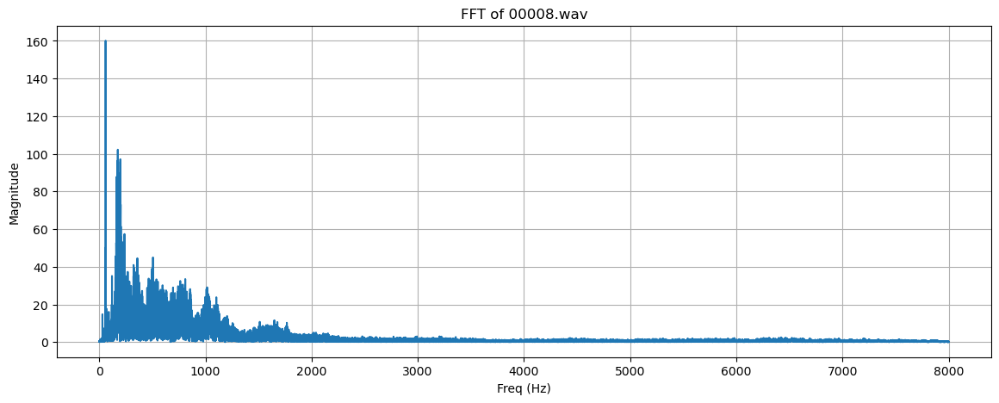

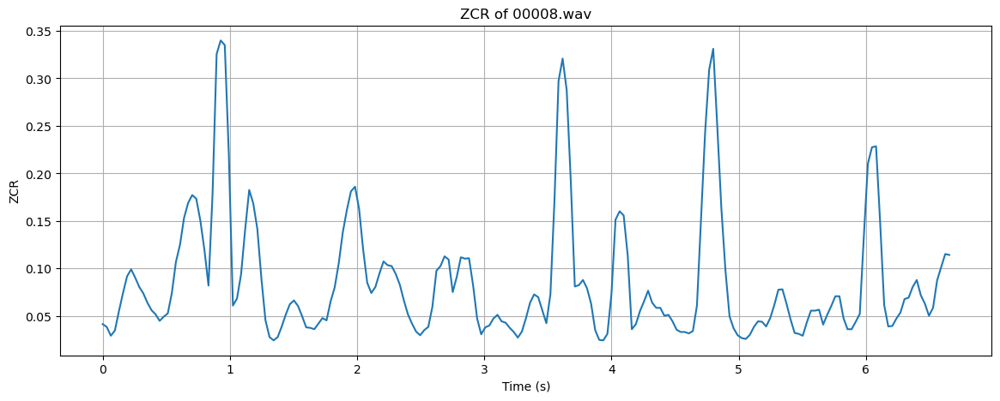

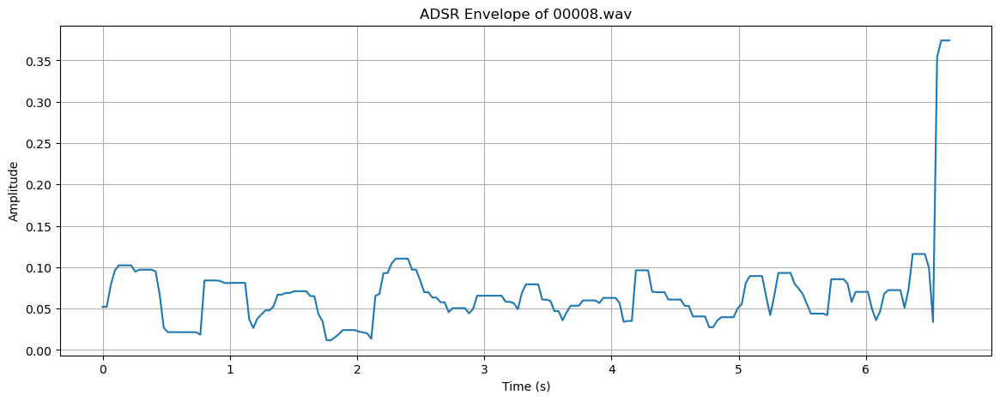

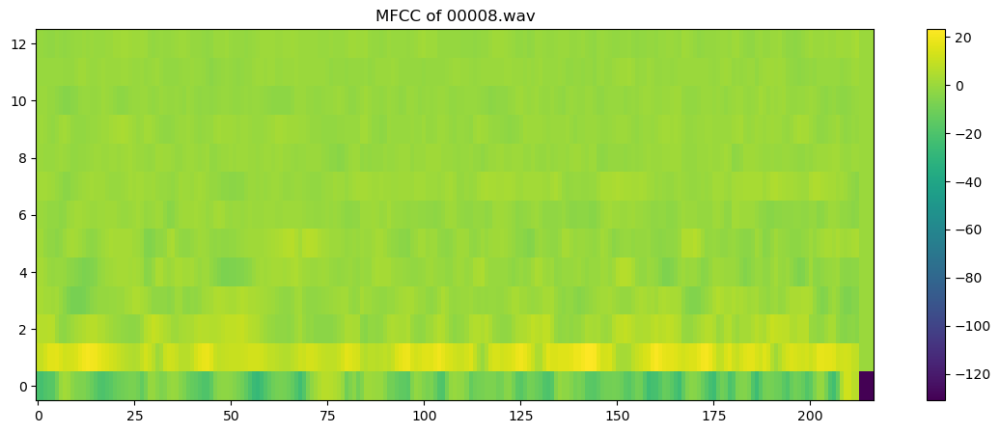

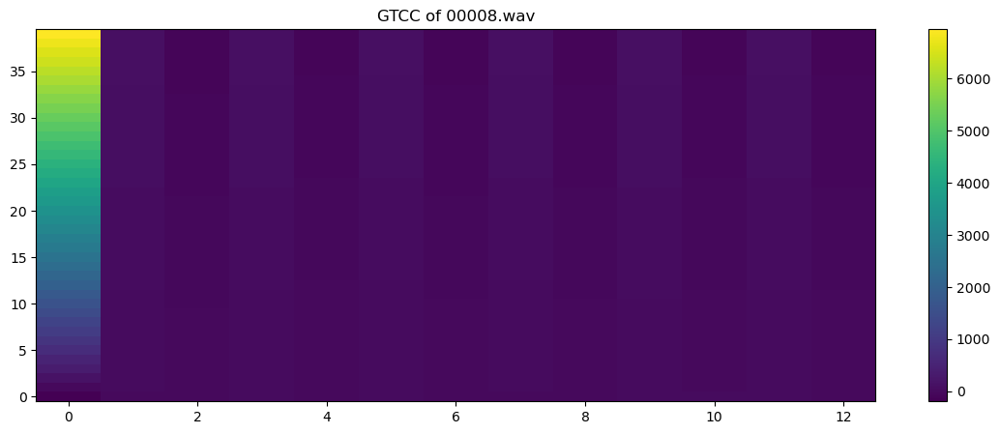

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00008.wav
	ZCR: [0.04150391 0.03857422 0.02929688 0.03466797 0.05517578 0.07421875
 0.09179688 0.09912109 0.09033203 0.08056641 0.07373047 0.06396484
 0.05615234 0.05175781 0.04492188 0.04931641 0.05273438 0.07421875
 0.10693359 0.125      0.15332031 0.16894531 0.17724609 0.17333984
 0.15039062 0.11962891 0.08203125 0.17871094 0.32568359 0.33984375
 0.33496094 0.21923828 0.06103516 0.06835938 0.09375    0.140625
 0.18261719 0.16845703 0.14160156 0.08935547 0.04541016 0.02783203
 0.02441406 0.02783203 0.0390625  0.05175781 0.0625     0.06640625
 0.06054688 0.04980469 0.03808594 0.03759766 0.03613281 0.04199219
 0.04785156 0.04541016 0.06542969 0.08007812 0.10546875 0.13818359
 0.16162109 0.18115234 0.18603516 0.16259766 0.11962891 0.08496094
 0.07421875 0.08056641 0.09472656 0.10742188 0.10351562 0.10253906
 0.09423828 0.08300781 0.06640625 0.05175781 0.04199219 0.03369141
 0.02978516 0.03515625 0.03857422 0.05957031 0.09765625 0.10

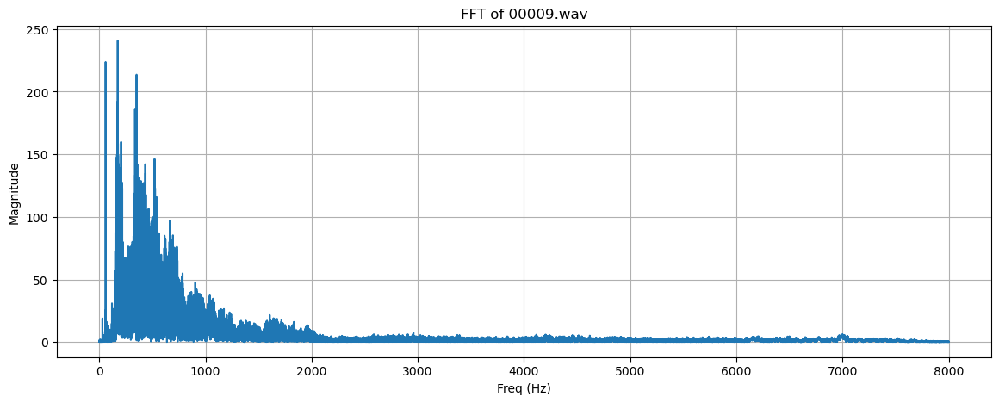

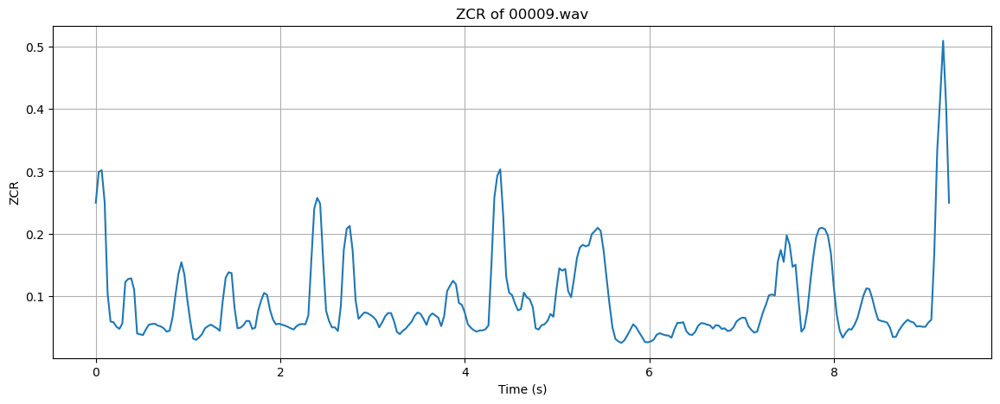

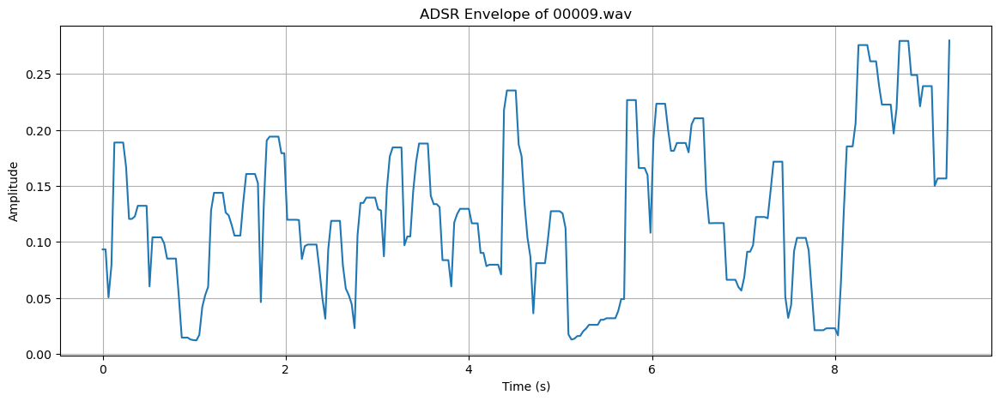

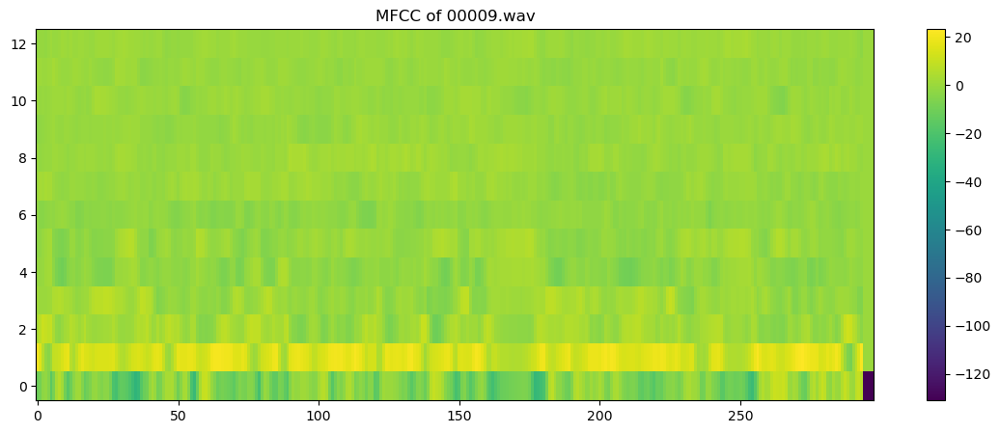

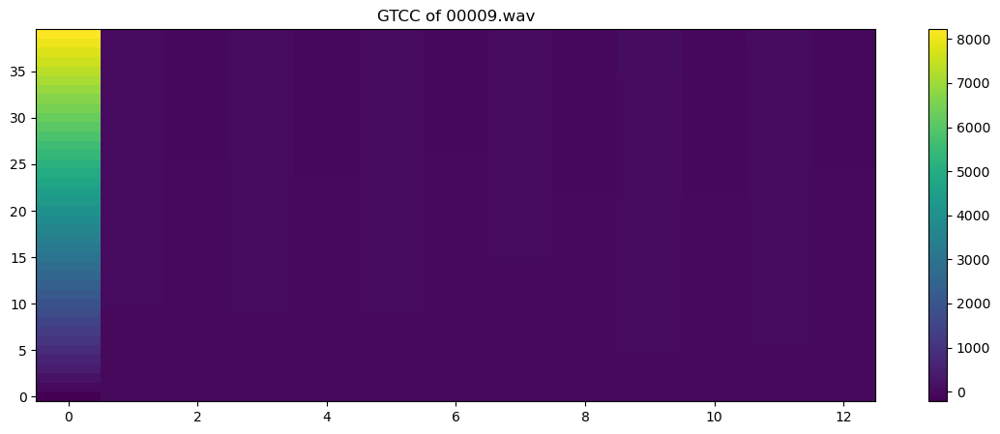

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00009.wav
	ZCR: [0.24951172 0.29882812 0.30175781 0.25097656 0.10449219 0.05908203
 0.05810547 0.05078125 0.04736328 0.05615234 0.12255859 0.12744141
 0.12841797 0.10986328 0.04003906 0.03857422 0.03759766 0.046875
 0.05419922 0.05517578 0.05566406 0.05273438 0.05126953 0.04833984
 0.04296875 0.04443359 0.06591797 0.10205078 0.13525391 0.15429688
 0.13476562 0.09423828 0.06005859 0.03173828 0.02978516 0.03369141
 0.0390625  0.04833984 0.05175781 0.05419922 0.05126953 0.04833984
 0.04443359 0.09228516 0.12939453 0.13818359 0.13671875 0.08105469
 0.04833984 0.04931641 0.05322266 0.06005859 0.06005859 0.04736328
 0.04931641 0.07666016 0.09277344 0.10498047 0.10205078 0.078125
 0.0625     0.0546875  0.05566406 0.05419922 0.05273438 0.05078125
 0.04833984 0.04638672 0.05175781 0.0546875  0.05517578 0.0546875
 0.06884766 0.15625    0.24023438 0.25732422 0.24804688 0.15820312
 0.07666016 0.06005859 0.04980469 0.04980469 0.04394531 0.08398

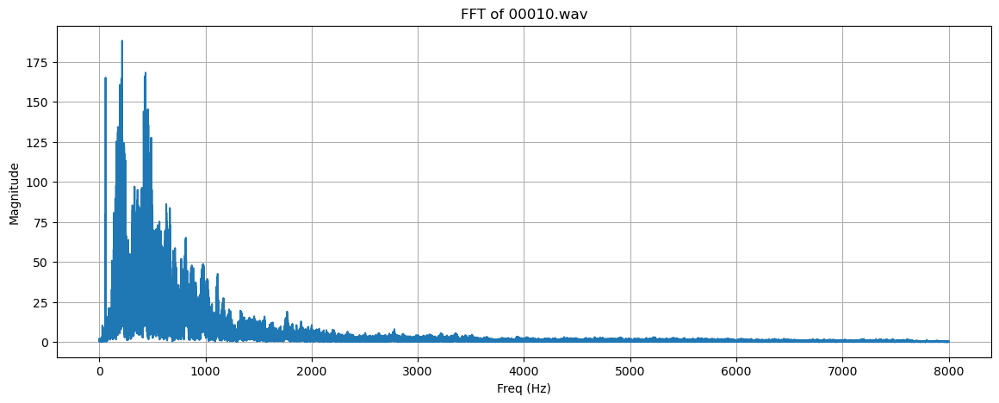

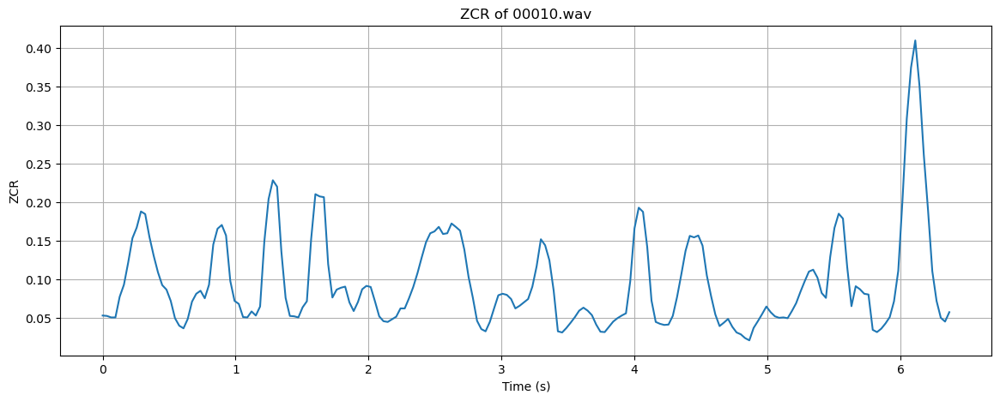

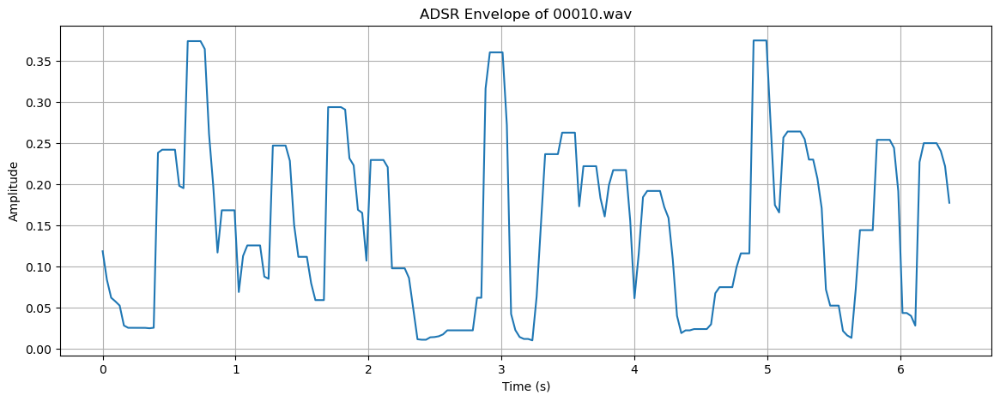

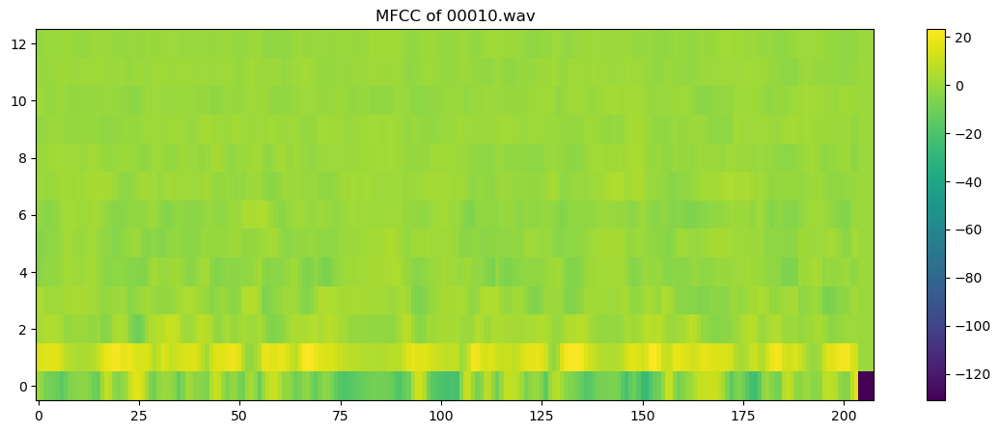

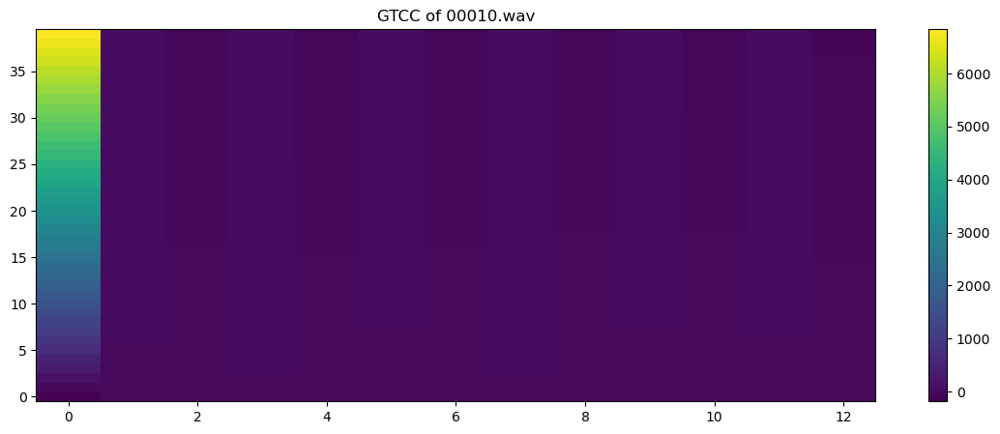

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00010.wav
	ZCR: [0.05273438 0.05224609 0.05029297 0.05029297 0.07714844 0.09277344
 0.12158203 0.15332031 0.16699219 0.18798828 0.18457031 0.15478516
 0.13037109 0.10888672 0.09228516 0.08642578 0.07177734 0.04931641
 0.03955078 0.03613281 0.04833984 0.07080078 0.08105469 0.08496094
 0.07519531 0.09277344 0.14501953 0.16552734 0.17041016 0.15673828
 0.09765625 0.07177734 0.06787109 0.05078125 0.05029297 0.05810547
 0.05273438 0.06445312 0.14892578 0.20410156 0.22851562 0.22021484
 0.13623047 0.07568359 0.05224609 0.05175781 0.05029297 0.06347656
 0.07128906 0.15185547 0.21044922 0.20751953 0.20654297 0.11962891
 0.07617188 0.08642578 0.08886719 0.09033203 0.06982422 0.05859375
 0.0703125  0.08691406 0.09130859 0.08984375 0.07128906 0.05175781
 0.04541016 0.04443359 0.04785156 0.05126953 0.06201172 0.06201172
 0.07519531 0.08984375 0.10791016 0.12841797 0.14794922 0.15966797
 0.16210938 0.16796875 0.15869141 0.15966797 0.17236328 0.

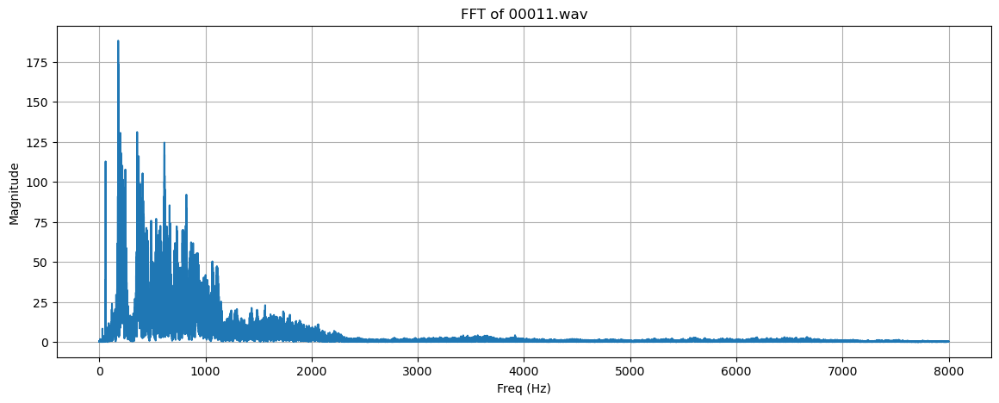

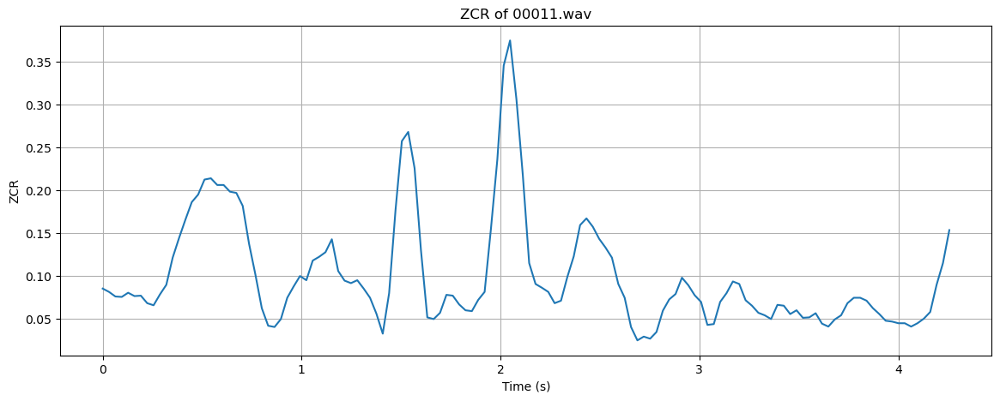

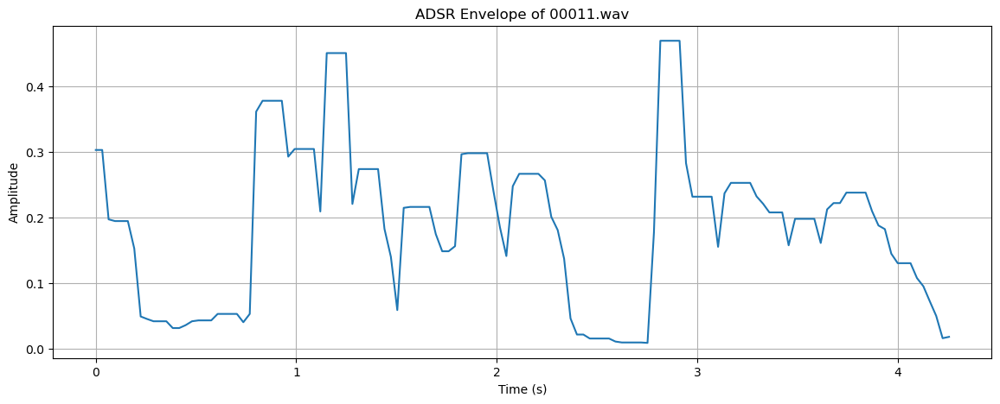

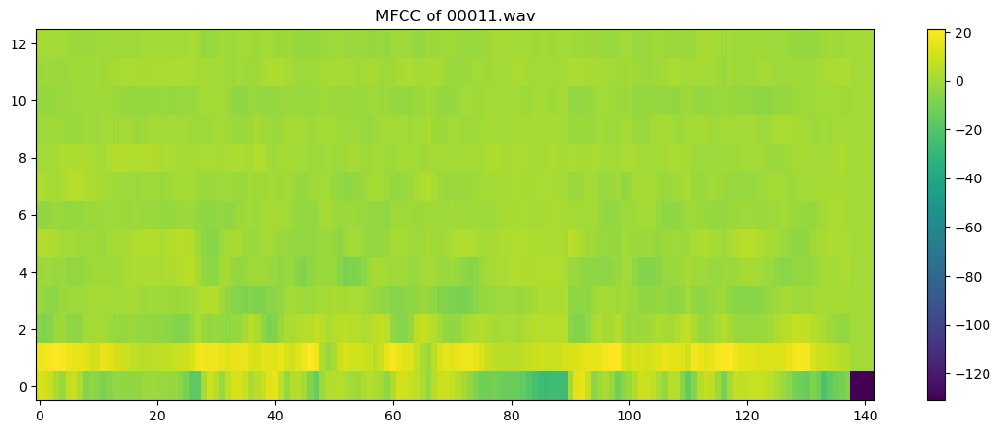

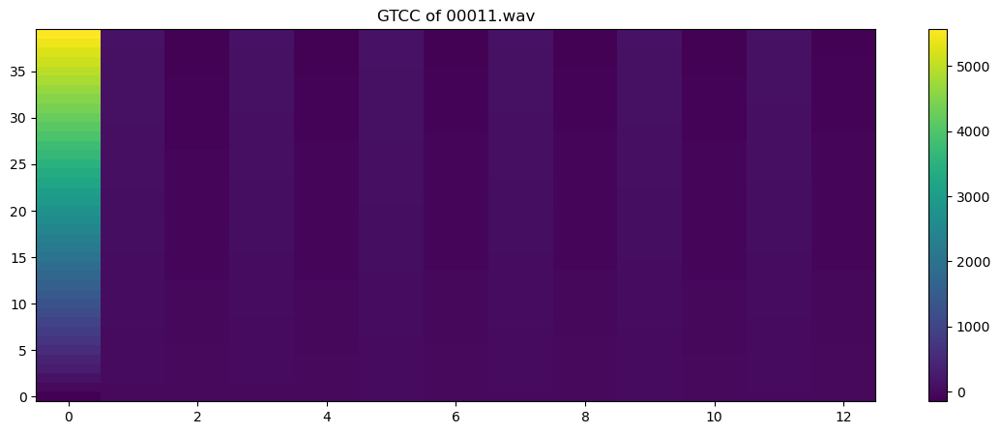

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00011.wav
	ZCR: [0.08496094 0.08105469 0.07568359 0.07519531 0.08007812 0.07617188
 0.07666016 0.06787109 0.06542969 0.078125   0.08935547 0.12109375
 0.14404297 0.16552734 0.18603516 0.19482422 0.21240234 0.21386719
 0.20605469 0.20605469 0.19824219 0.19677734 0.18164062 0.13720703
 0.10107422 0.06201172 0.04150391 0.04003906 0.04931641 0.07421875
 0.08740234 0.09960938 0.09472656 0.11767578 0.12207031 0.12744141
 0.14257812 0.10546875 0.09423828 0.09130859 0.09472656 0.08496094
 0.07421875 0.05566406 0.03222656 0.07958984 0.17626953 0.25732422
 0.26806641 0.22558594 0.12988281 0.05126953 0.04931641 0.05664062
 0.07763672 0.07666016 0.06640625 0.05957031 0.05859375 0.07177734
 0.08105469 0.15527344 0.23583984 0.34570312 0.375      0.30615234
 0.21777344 0.11474609 0.09033203 0.0859375  0.08105469 0.06787109
 0.07080078 0.09863281 0.12255859 0.15917969 0.16699219 0.15722656
 0.14306641 0.1328125  0.12109375 0.09033203 0.07421875 0.

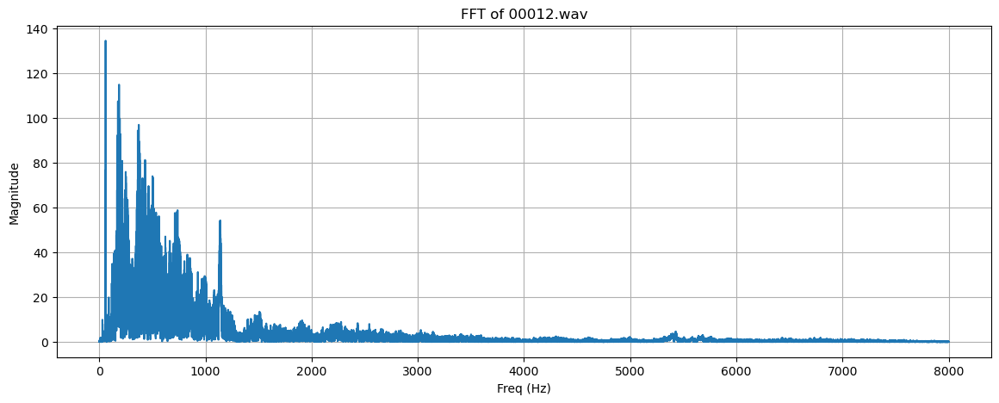

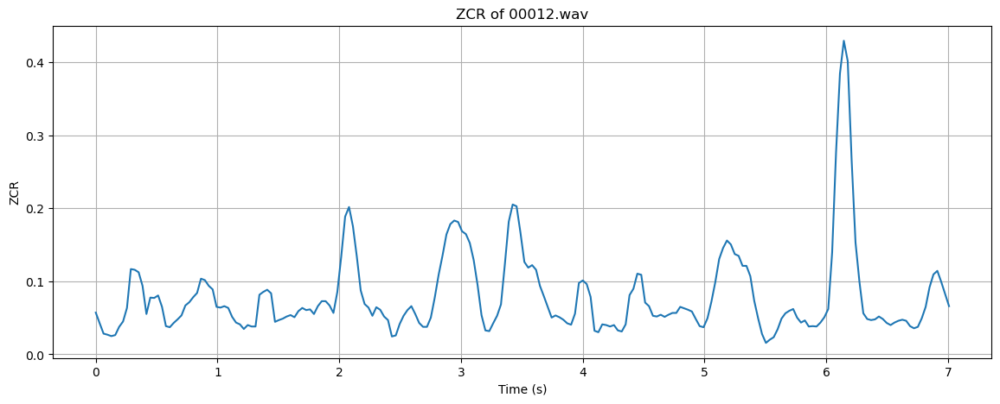

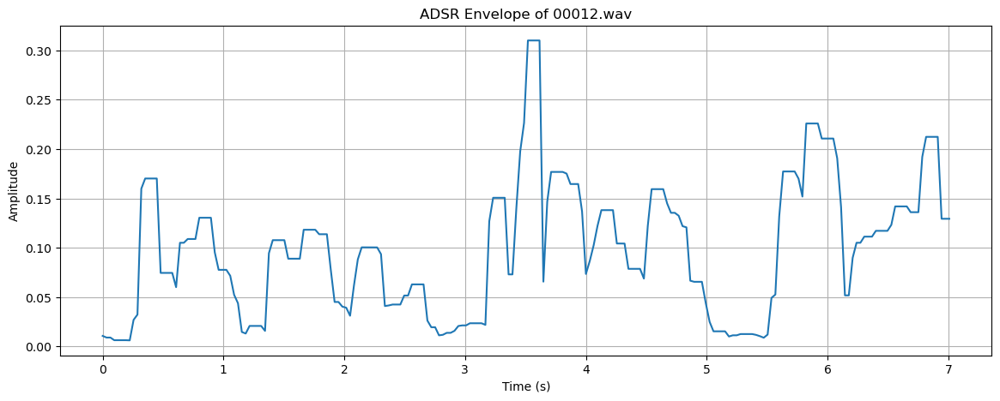

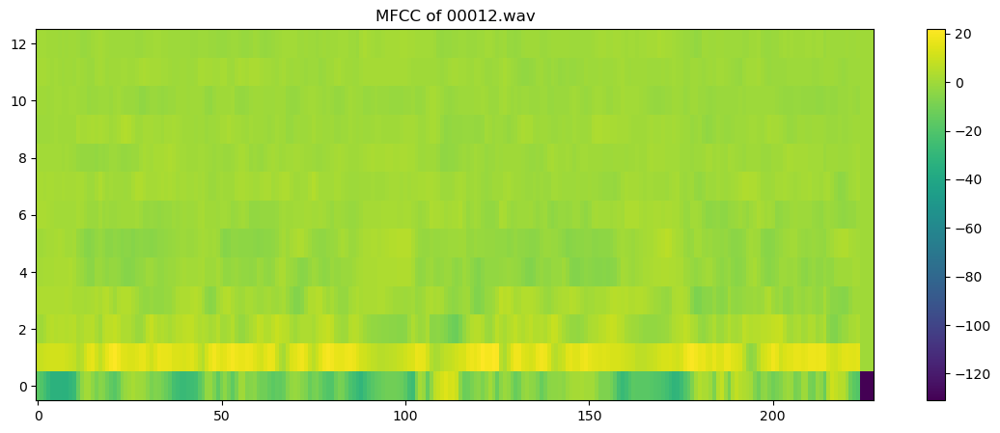

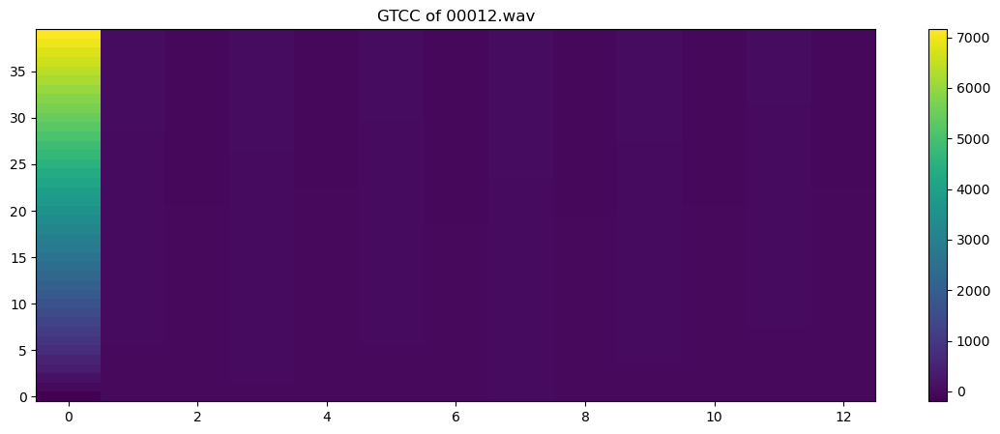

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00012.wav
	ZCR: [0.05712891 0.04248047 0.02832031 0.02685547 0.02490234 0.02636719
 0.03759766 0.04492188 0.06347656 0.11669922 0.11572266 0.11230469
 0.09375    0.05517578 0.07763672 0.07714844 0.08056641 0.06494141
 0.03857422 0.03710938 0.04296875 0.04785156 0.05322266 0.06689453
 0.07128906 0.078125   0.08398438 0.10351562 0.1015625  0.09375
 0.08886719 0.06494141 0.06396484 0.06591797 0.06347656 0.05126953
 0.04345703 0.04101562 0.03466797 0.04003906 0.03808594 0.03808594
 0.08154297 0.08544922 0.08837891 0.08349609 0.04443359 0.046875
 0.04882812 0.05175781 0.05371094 0.05078125 0.05908203 0.06347656
 0.06054688 0.06152344 0.05517578 0.06591797 0.07275391 0.07275391
 0.06689453 0.05664062 0.08544922 0.13378906 0.18847656 0.20166016
 0.17529297 0.13378906 0.08740234 0.06884766 0.06396484 0.05273438
 0.06445312 0.06103516 0.05175781 0.046875   0.02441406 0.02587891
 0.04150391 0.05273438 0.06054688 0.06591797 0.05517578 0.04296

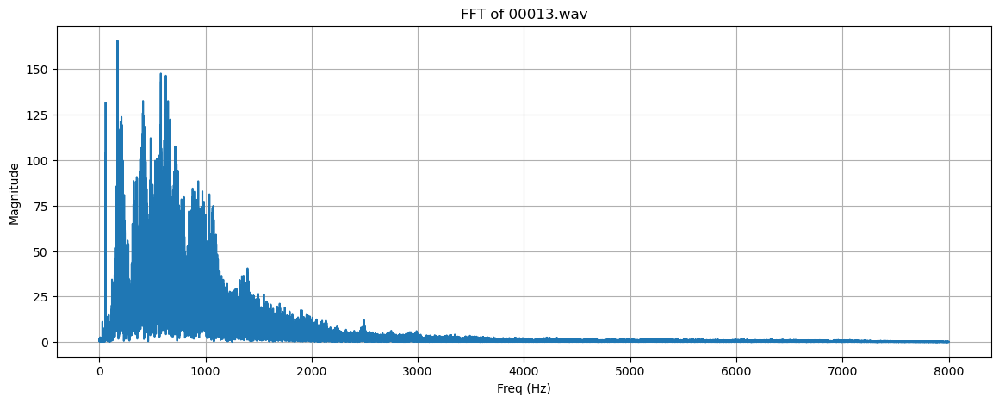

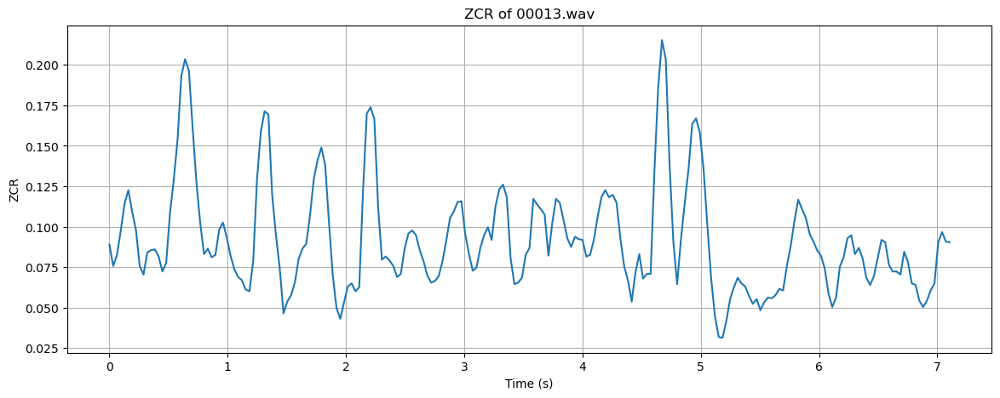

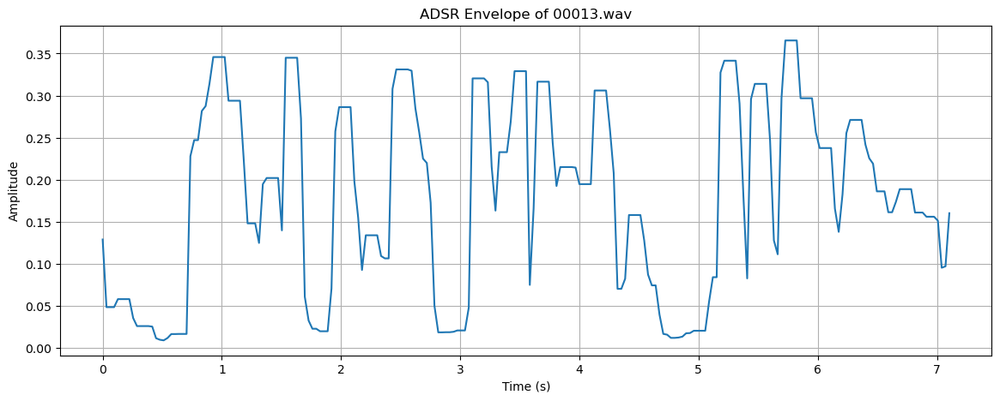

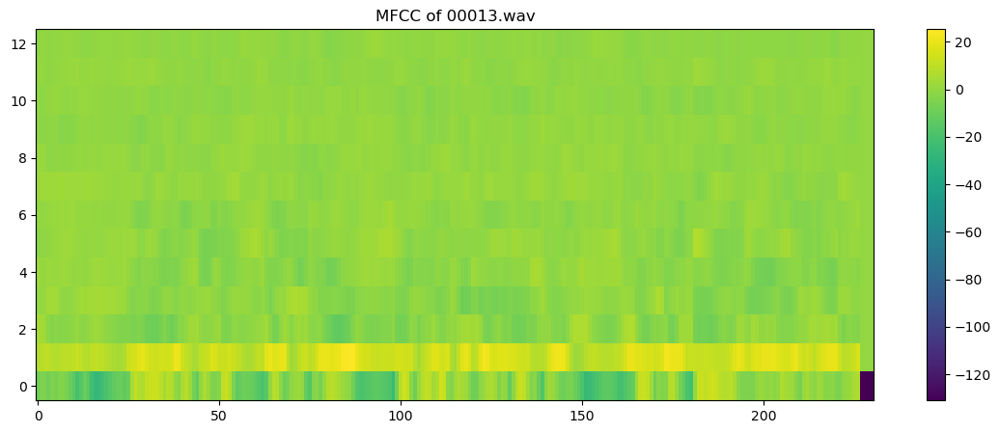

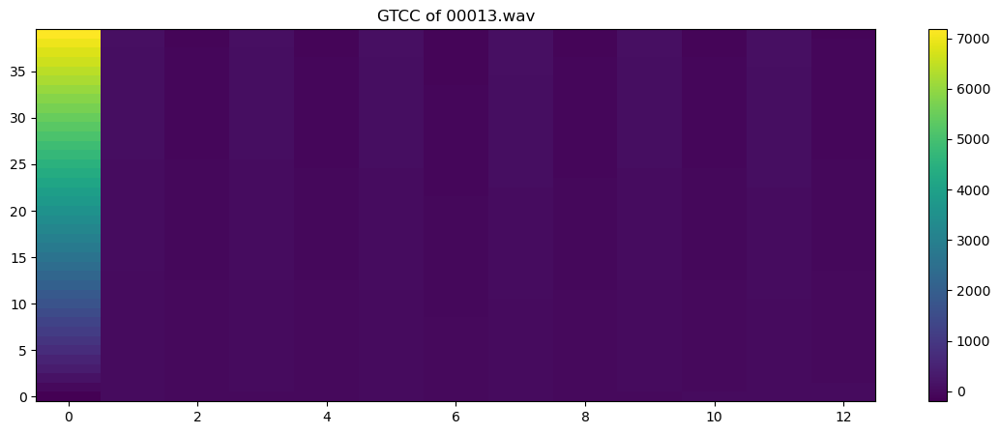

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00013.wav
	ZCR: [0.08886719 0.07568359 0.08251953 0.09765625 0.11425781 0.12255859
 0.109375   0.09814453 0.07568359 0.0703125  0.08398438 0.08544922
 0.0859375  0.08154297 0.07226562 0.07763672 0.10839844 0.12890625
 0.15380859 0.19335938 0.20361328 0.19628906 0.16064453 0.12695312
 0.10205078 0.08300781 0.08642578 0.08105469 0.08251953 0.09814453
 0.10253906 0.09326172 0.08203125 0.07373047 0.06884766 0.06689453
 0.06103516 0.06005859 0.07910156 0.12939453 0.15869141 0.17138672
 0.16943359 0.11962891 0.09472656 0.07421875 0.04638672 0.05371094
 0.05761719 0.06542969 0.08007812 0.08642578 0.08935547 0.10693359
 0.12939453 0.14111328 0.14892578 0.13818359 0.10302734 0.0703125
 0.04980469 0.04296875 0.05322266 0.06298828 0.06494141 0.06005859
 0.0625     0.12158203 0.16992188 0.17382812 0.16650391 0.11181641
 0.07958984 0.08154297 0.07910156 0.07568359 0.06884766 0.07080078
 0.08642578 0.09570312 0.09765625 0.09472656 0.08544922 0.0

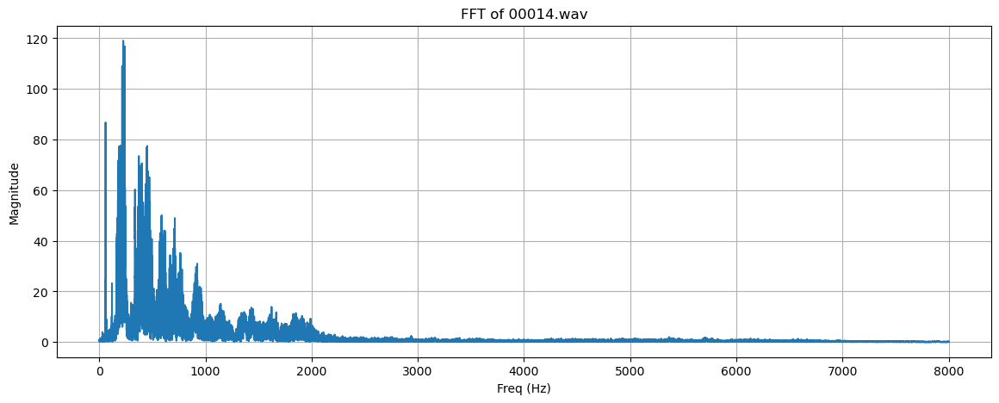

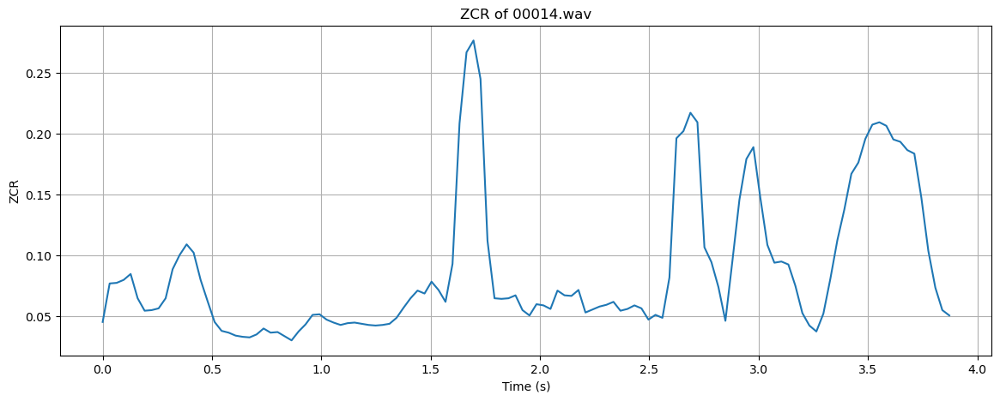

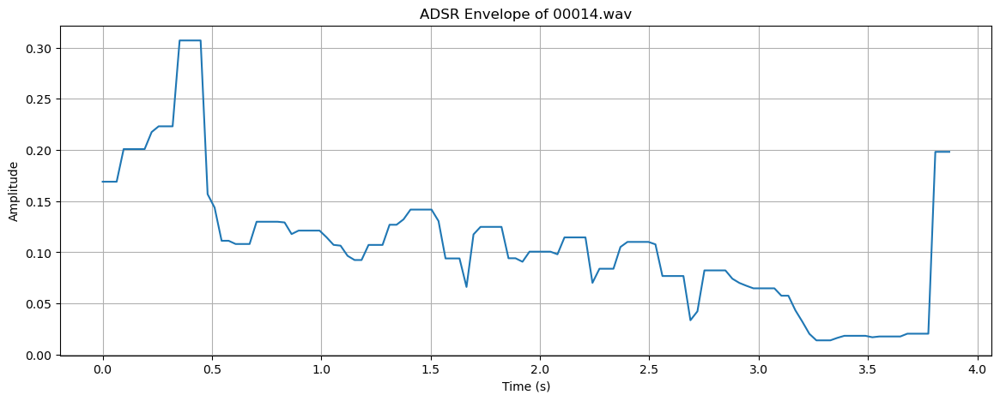

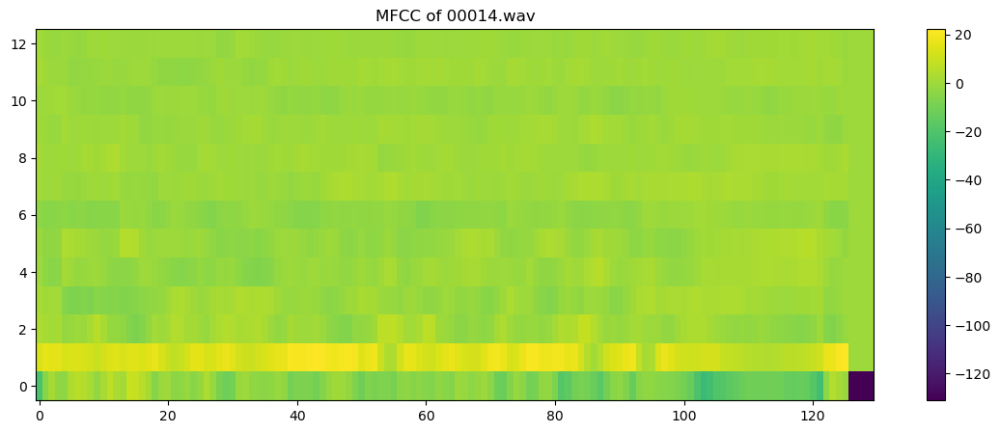

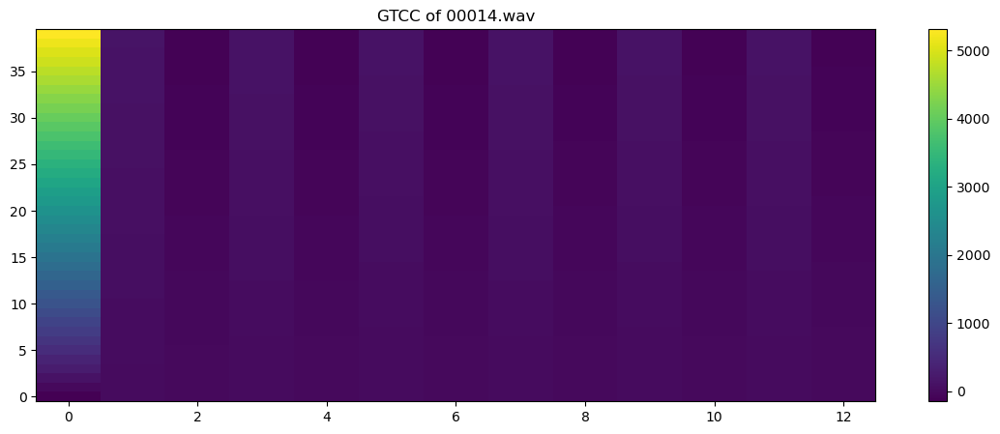

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00014.wav
	ZCR: [0.04492188 0.07666016 0.07714844 0.07958984 0.08447266 0.06445312
 0.05419922 0.0546875  0.05615234 0.06445312 0.08837891 0.10009766
 0.10888672 0.10205078 0.07958984 0.06201172 0.04492188 0.03759766
 0.03613281 0.03369141 0.03271484 0.03222656 0.03466797 0.03955078
 0.03613281 0.03662109 0.03320312 0.02978516 0.03710938 0.04296875
 0.05078125 0.05126953 0.046875   0.04443359 0.04248047 0.04394531
 0.04443359 0.04345703 0.04248047 0.04199219 0.04248047 0.04345703
 0.04833984 0.05664062 0.06445312 0.07080078 0.06835938 0.078125
 0.07128906 0.06152344 0.09277344 0.20849609 0.26708984 0.27685547
 0.24511719 0.11181641 0.06445312 0.06396484 0.06445312 0.06689453
 0.0546875  0.05029297 0.05957031 0.05859375 0.05566406 0.07080078
 0.06689453 0.06640625 0.07128906 0.05273438 0.05517578 0.05761719
 0.05908203 0.06152344 0.05419922 0.05566406 0.05859375 0.05615234
 0.046875   0.05078125 0.04833984 0.08154297 0.19628906 0.20

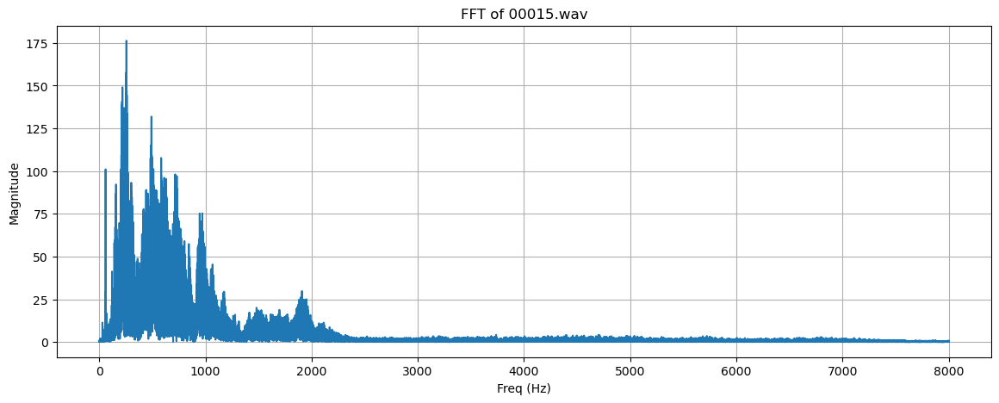

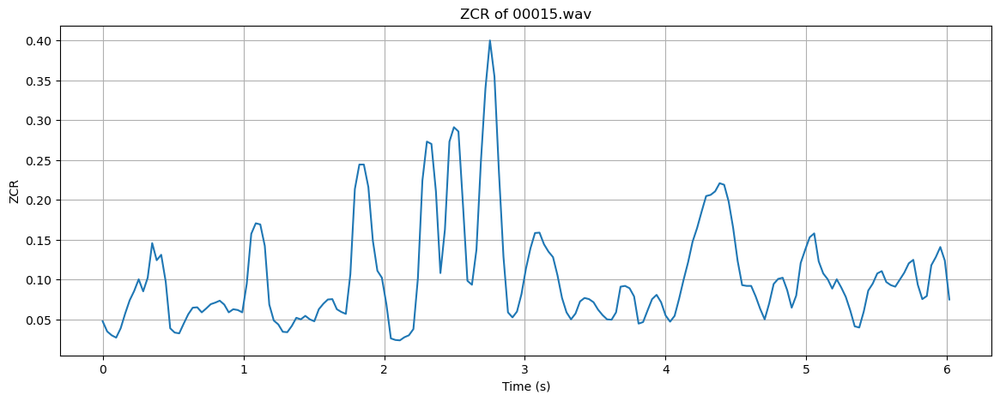

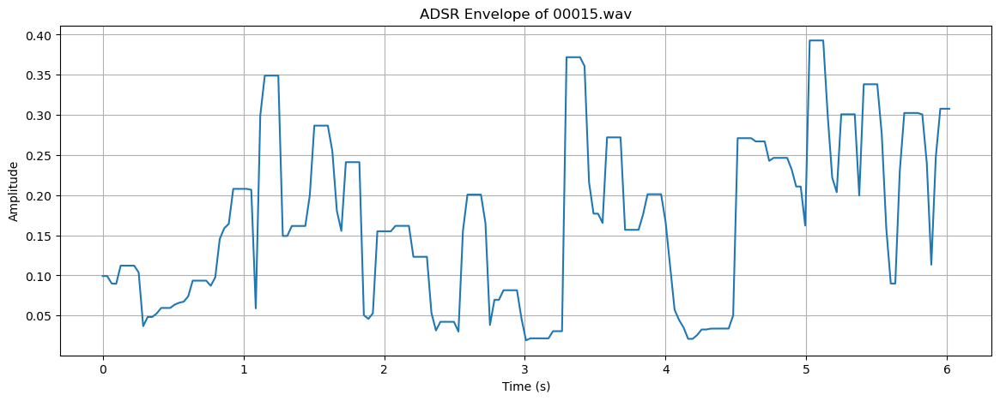

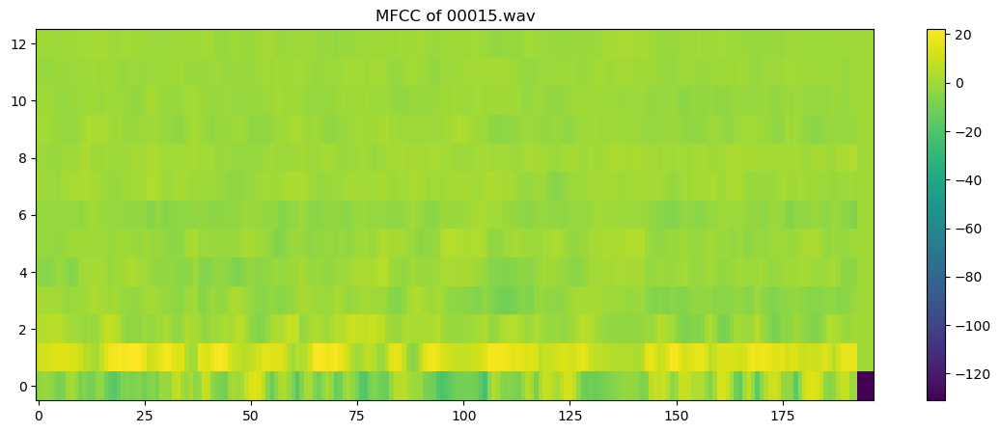

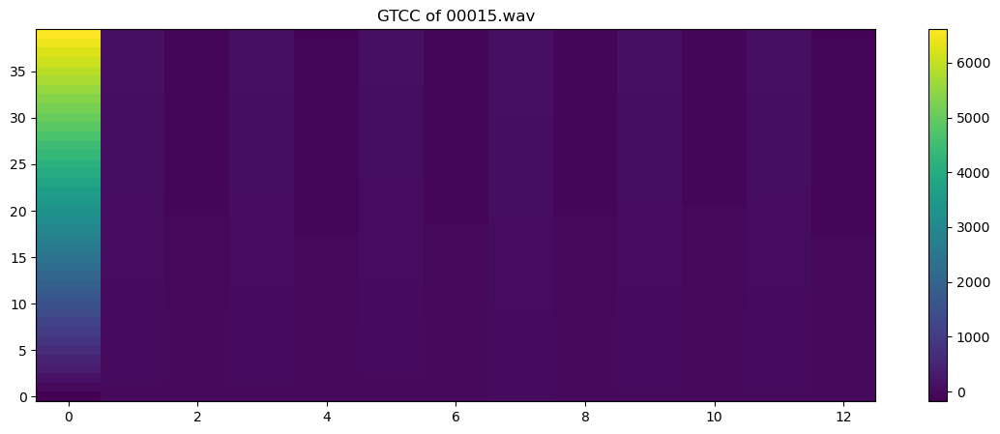

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00015.wav
	ZCR: [0.04736328 0.03466797 0.02978516 0.02685547 0.03857422 0.05712891
 0.07373047 0.08544922 0.10009766 0.08496094 0.10205078 0.14550781
 0.12402344 0.13085938 0.09716797 0.03857422 0.03320312 0.03222656
 0.04443359 0.05615234 0.06445312 0.06494141 0.05859375 0.06347656
 0.06884766 0.07080078 0.07324219 0.06835938 0.05859375 0.0625
 0.06152344 0.05859375 0.09472656 0.15722656 0.17041016 0.16894531
 0.14208984 0.06835938 0.04833984 0.04345703 0.03417969 0.03369141
 0.04150391 0.05175781 0.04980469 0.05419922 0.04980469 0.04736328
 0.0625     0.06933594 0.07470703 0.07519531 0.0625     0.05908203
 0.05664062 0.10644531 0.21337891 0.24414062 0.24414062 0.21582031
 0.1484375  0.11083984 0.10205078 0.06884766 0.02587891 0.02392578
 0.0234375  0.02734375 0.02978516 0.03759766 0.1015625  0.22412109
 0.27294922 0.27001953 0.21044922 0.10791016 0.16259766 0.27294922
 0.29101562 0.28564453 0.19433594 0.09814453 0.09326172 0.1372

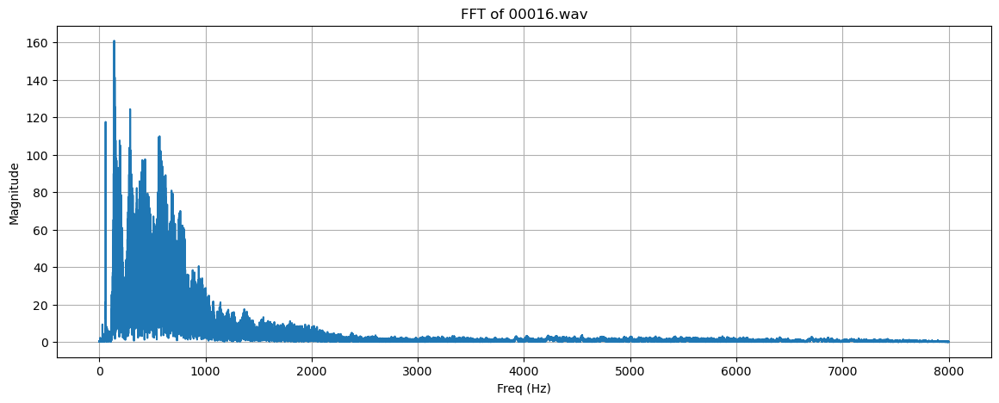

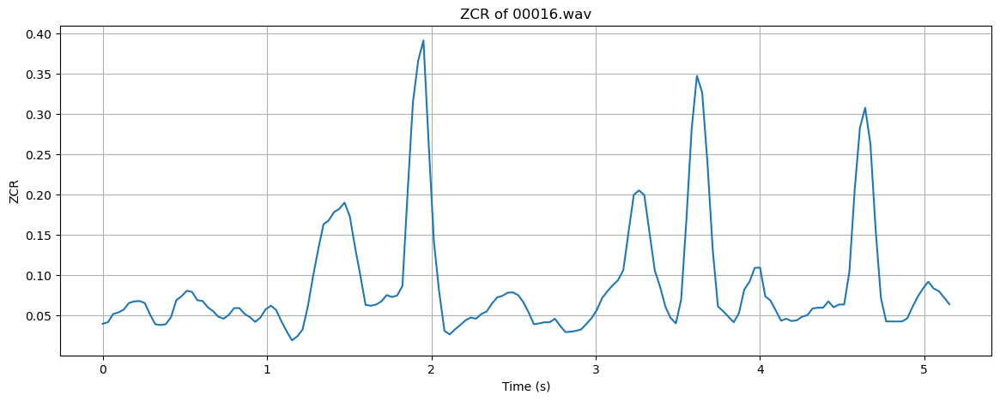

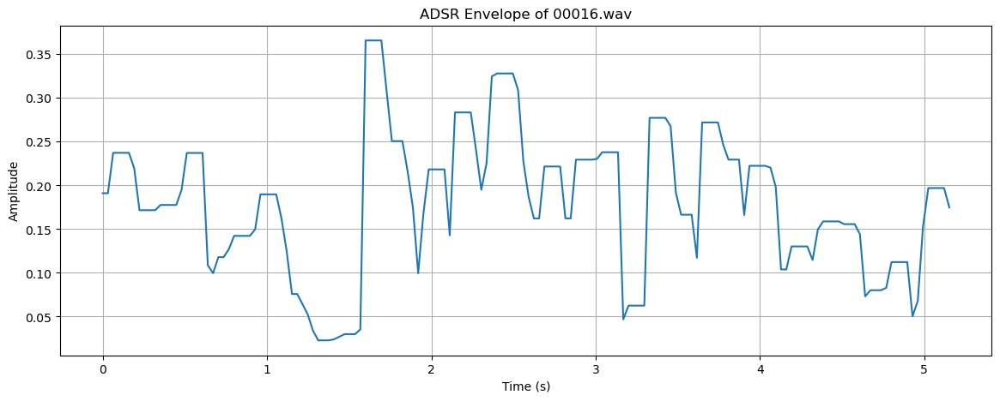

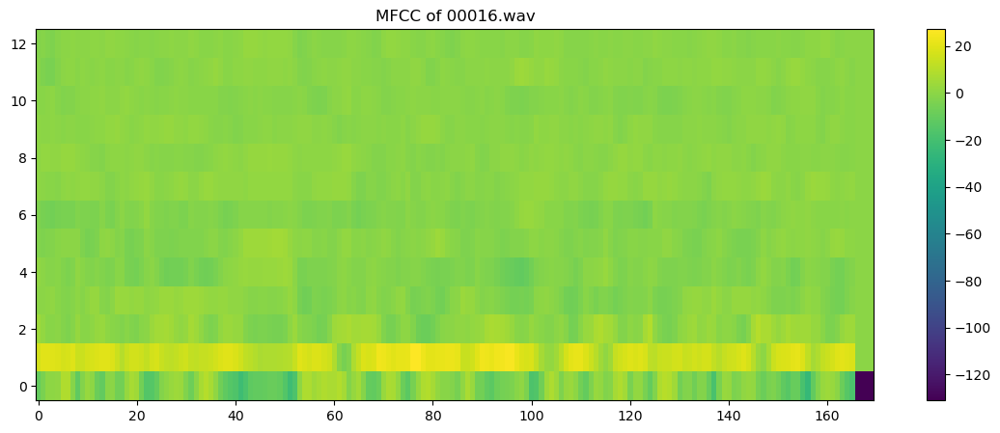

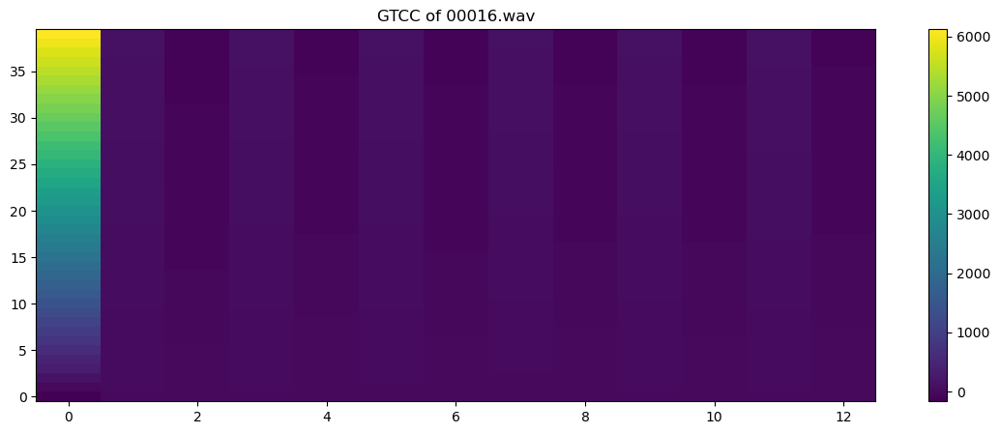

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00016.wav
	ZCR: [0.03955078 0.04150391 0.05175781 0.05371094 0.05712891 0.06542969
 0.06738281 0.06787109 0.06542969 0.05126953 0.0390625  0.03808594
 0.0390625  0.04785156 0.06884766 0.07373047 0.08056641 0.07910156
 0.06884766 0.06787109 0.06005859 0.05517578 0.04833984 0.04589844
 0.05078125 0.05908203 0.05908203 0.05175781 0.04785156 0.04199219
 0.04736328 0.05761719 0.06201172 0.05664062 0.04248047 0.03027344
 0.01904297 0.02392578 0.03222656 0.06054688 0.09814453 0.13232422
 0.16308594 0.16796875 0.17822266 0.18212891 0.18994141 0.17285156
 0.13427734 0.09960938 0.06298828 0.06201172 0.06347656 0.06738281
 0.07519531 0.07275391 0.07470703 0.08642578 0.20361328 0.31445312
 0.36621094 0.39111328 0.26220703 0.140625   0.07861328 0.03076172
 0.02636719 0.03271484 0.03808594 0.04394531 0.04736328 0.04589844
 0.05175781 0.0546875  0.06445312 0.07226562 0.07421875 0.078125
 0.07861328 0.07519531 0.06640625 0.05371094 0.0390625  0.04

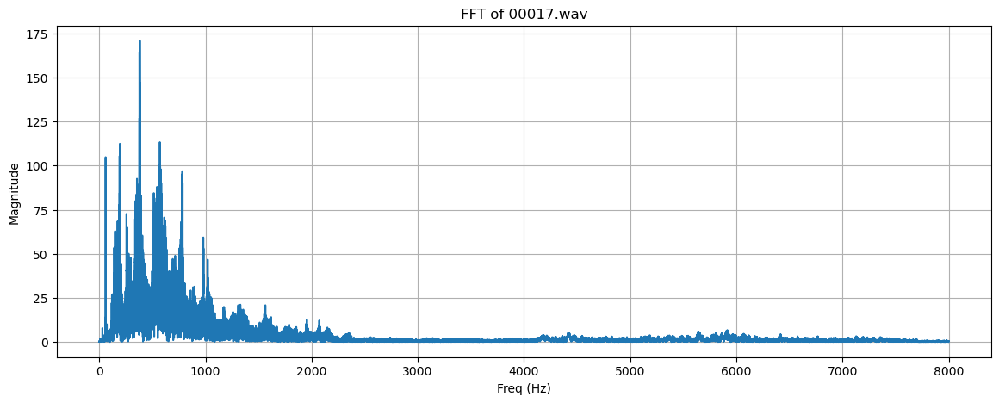

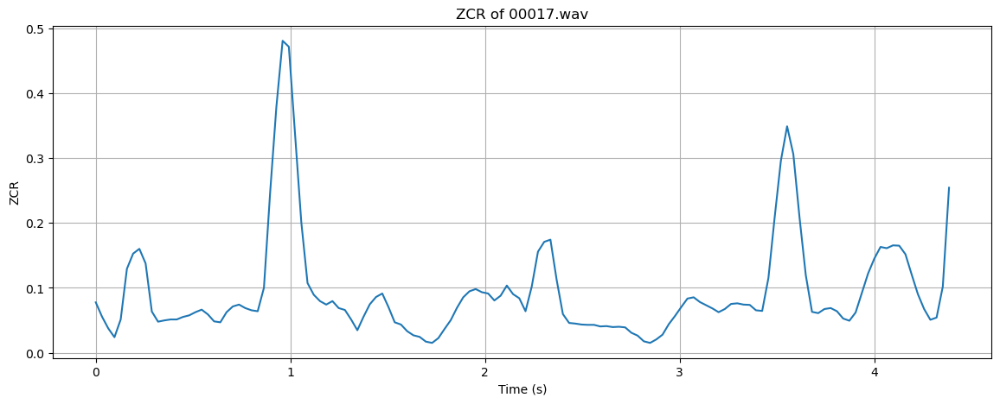

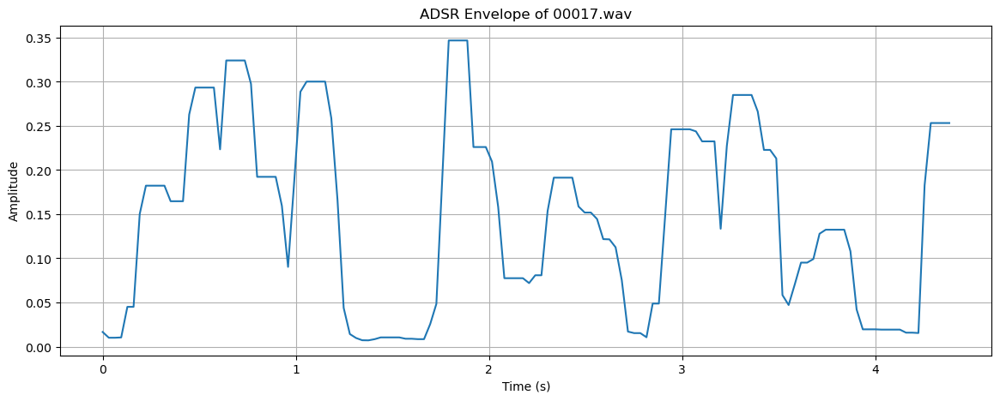

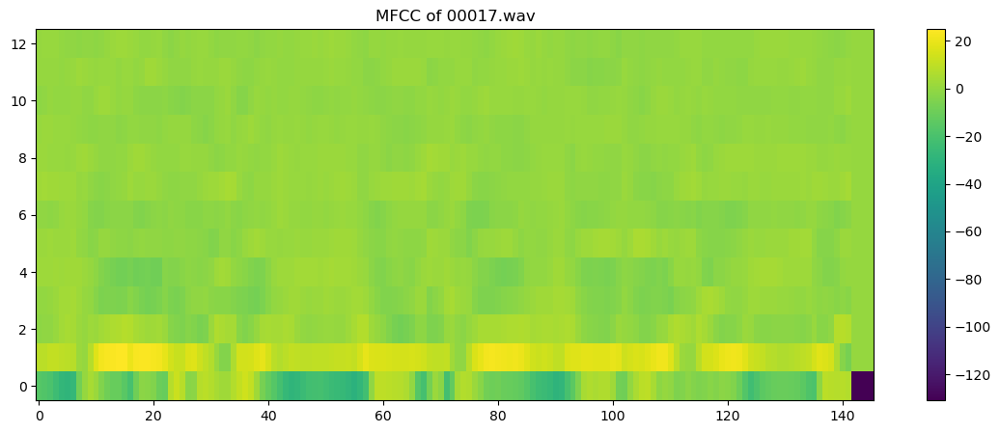

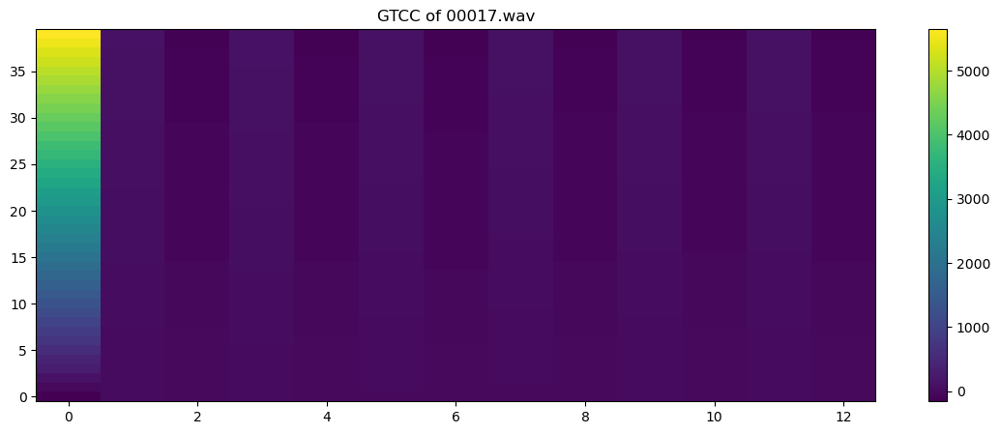

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00017.wav
	ZCR: [0.07763672 0.05566406 0.03759766 0.02392578 0.05126953 0.12939453
 0.15283203 0.16015625 0.13769531 0.06347656 0.04785156 0.04980469
 0.05126953 0.05126953 0.05517578 0.05761719 0.0625     0.06640625
 0.05908203 0.04833984 0.046875   0.0625     0.07128906 0.07421875
 0.06884766 0.06542969 0.06396484 0.10009766 0.24755859 0.37939453
 0.48095703 0.47167969 0.3359375  0.20117188 0.10742188 0.08935547
 0.07958984 0.07421875 0.07958984 0.06884766 0.06591797 0.05126953
 0.03466797 0.05566406 0.07470703 0.0859375  0.09130859 0.0703125
 0.046875   0.04345703 0.03320312 0.02685547 0.02441406 0.01708984
 0.01513672 0.02246094 0.03662109 0.05029297 0.06933594 0.08544922
 0.09472656 0.09814453 0.09326172 0.09130859 0.08056641 0.08789062
 0.10351562 0.09033203 0.08398438 0.06396484 0.10205078 0.15576172
 0.17089844 0.17431641 0.11230469 0.05957031 0.04589844 0.04492188
 0.04345703 0.04296875 0.04296875 0.04052734 0.04101562 0.0

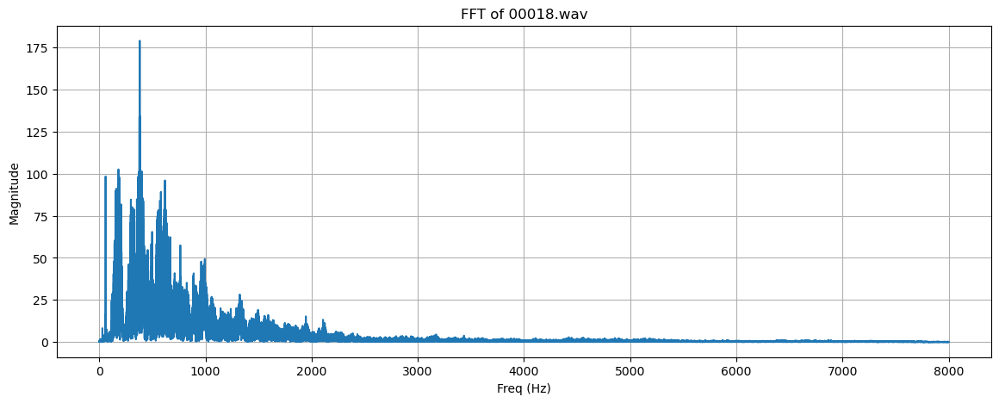

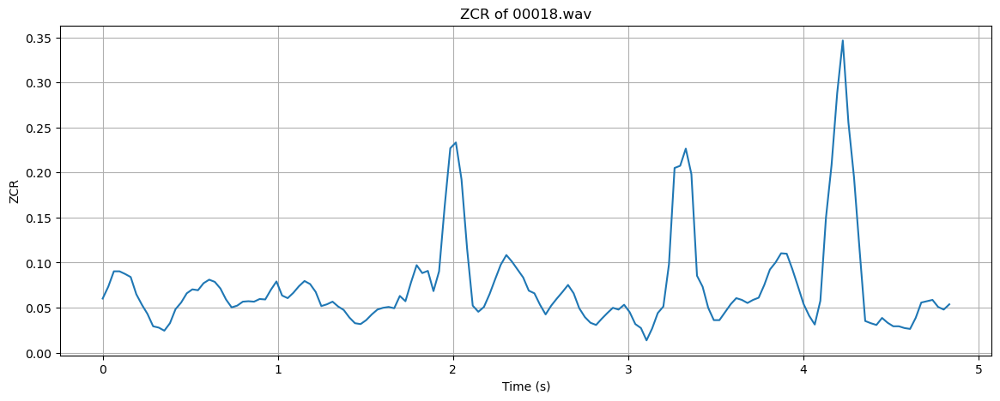

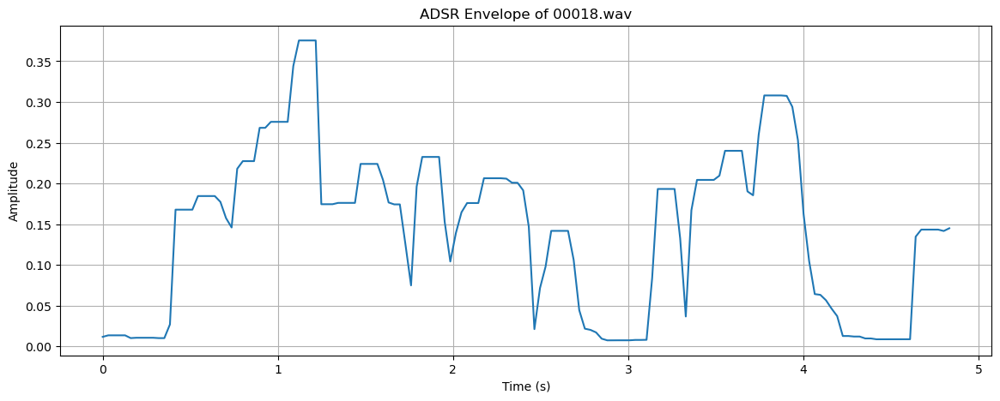

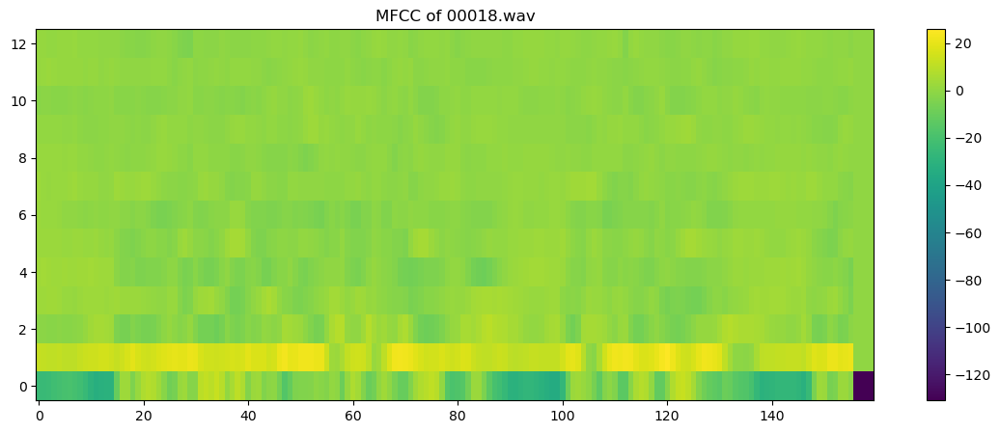

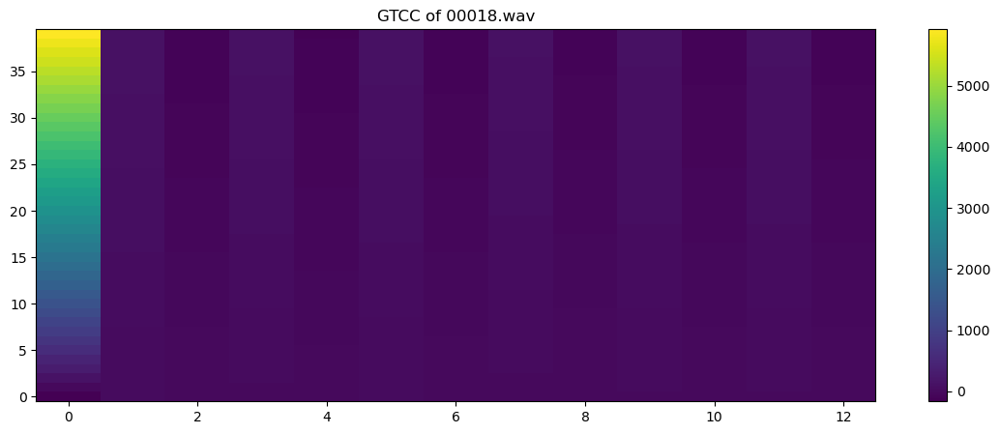

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00018.wav
	ZCR: [0.06005859 0.07324219 0.09033203 0.09033203 0.08740234 0.08398438
 0.06494141 0.05322266 0.04296875 0.02929688 0.02783203 0.02441406
 0.03271484 0.04833984 0.05566406 0.06591797 0.0703125  0.06933594
 0.07714844 0.08105469 0.07861328 0.07128906 0.05908203 0.05029297
 0.05224609 0.05664062 0.05712891 0.05664062 0.05957031 0.05908203
 0.06982422 0.07910156 0.06347656 0.06054688 0.06640625 0.07373047
 0.07958984 0.07617188 0.06738281 0.05175781 0.05371094 0.05664062
 0.05126953 0.04736328 0.0390625  0.03271484 0.03173828 0.03613281
 0.04248047 0.04785156 0.04980469 0.05078125 0.04931641 0.06298828
 0.05712891 0.078125   0.09716797 0.08837891 0.09082031 0.06835938
 0.09033203 0.16259766 0.22705078 0.23339844 0.19238281 0.11523438
 0.05224609 0.04541016 0.05078125 0.06494141 0.08154297 0.09765625
 0.10839844 0.10107422 0.09228516 0.08349609 0.06884766 0.06591797
 0.05322266 0.04248047 0.05224609 0.06005859 0.06738281 0.

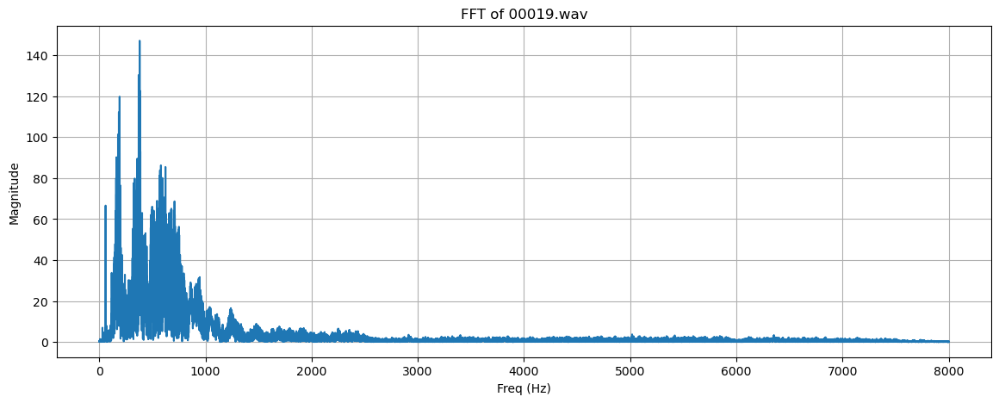

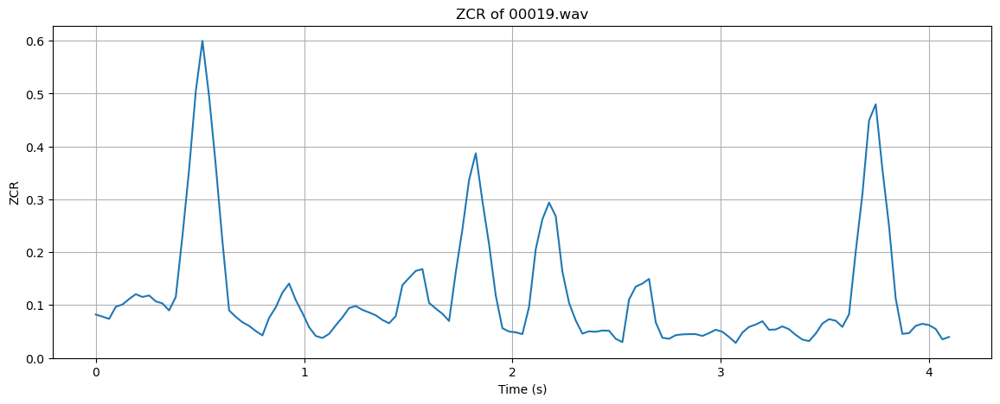

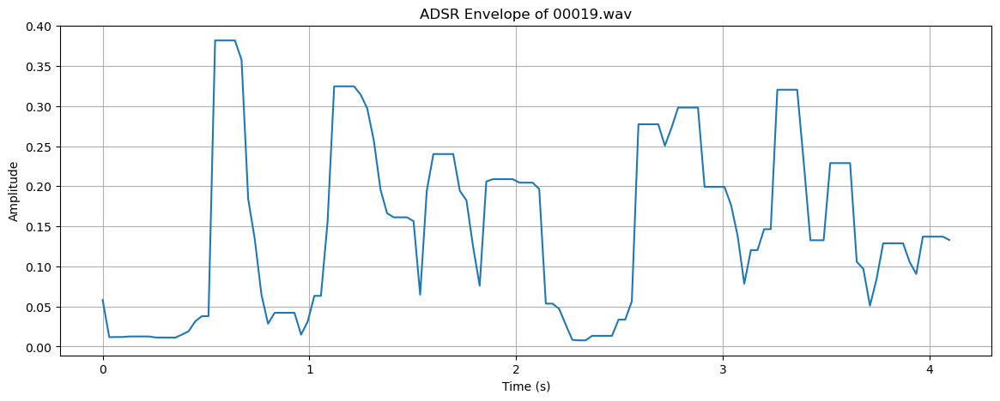

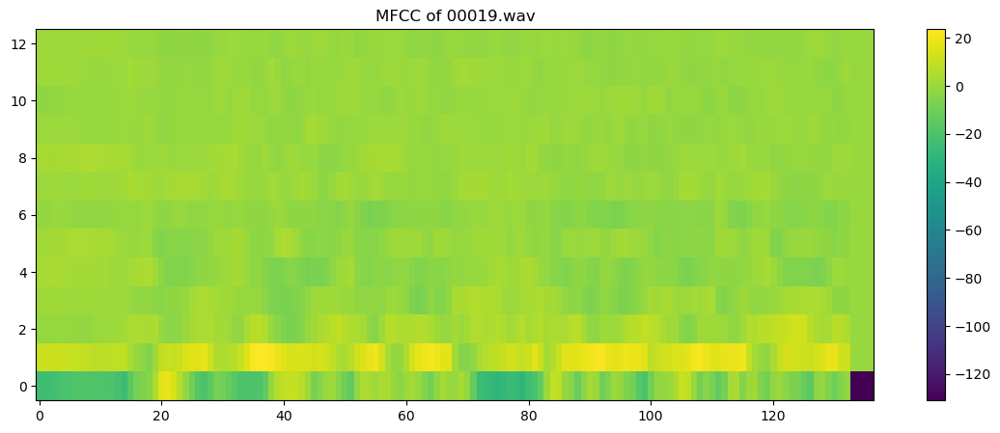

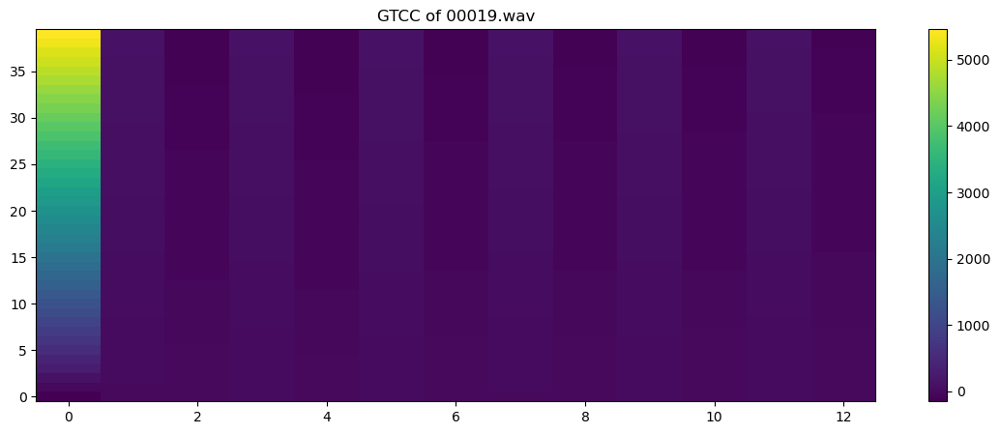

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00019.wav
	ZCR: [0.08203125 0.078125   0.07373047 0.09667969 0.10107422 0.11132812
 0.12060547 0.11523438 0.11816406 0.10693359 0.10302734 0.08984375
 0.11523438 0.23046875 0.35644531 0.50439453 0.60009766 0.49462891
 0.36425781 0.22070312 0.08984375 0.07763672 0.06738281 0.06054688
 0.05078125 0.04248047 0.07568359 0.09570312 0.12353516 0.140625
 0.109375   0.08496094 0.05810547 0.04150391 0.03759766 0.04541016
 0.06152344 0.07666016 0.09423828 0.09814453 0.09082031 0.0859375
 0.08056641 0.07177734 0.06542969 0.07910156 0.13769531 0.15136719
 0.16455078 0.16796875 0.10400391 0.09326172 0.08349609 0.06982422
 0.16210938 0.24316406 0.33691406 0.38720703 0.296875   0.21484375
 0.11816406 0.05615234 0.04980469 0.04833984 0.04492188 0.09667969
 0.20556641 0.26220703 0.29394531 0.26806641 0.16308594 0.10400391
 0.07080078 0.04589844 0.05029297 0.04931641 0.05175781 0.05126953
 0.03613281 0.02978516 0.11035156 0.13476562 0.140625   0.149

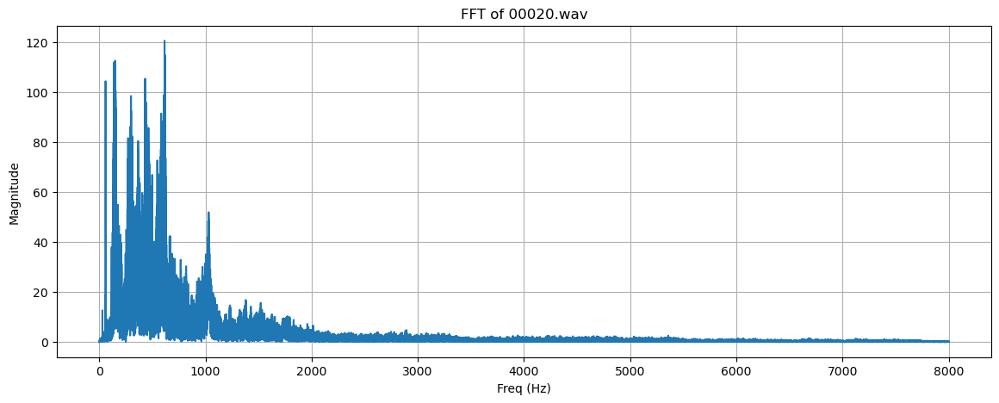

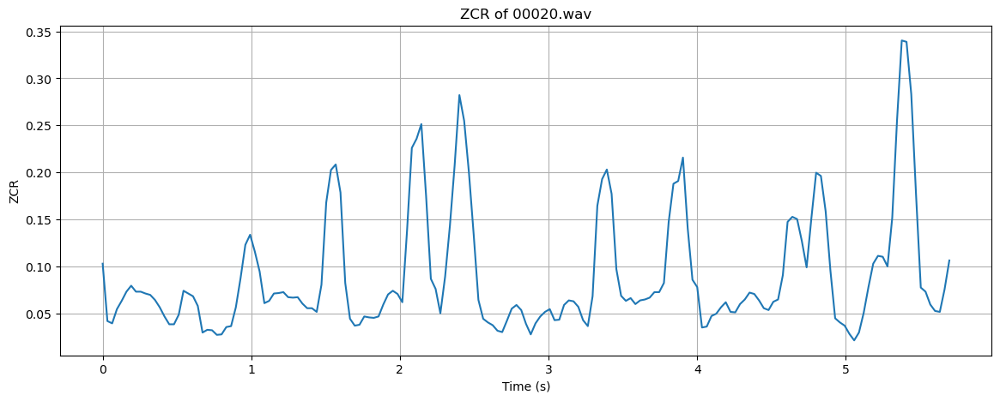

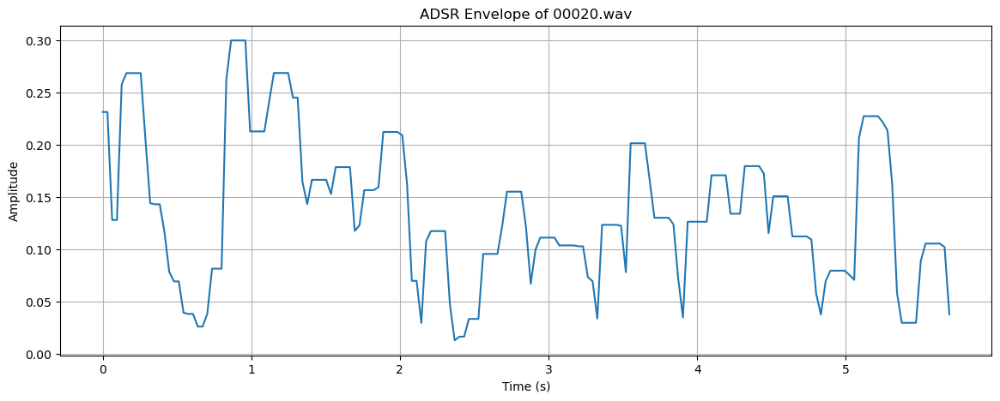

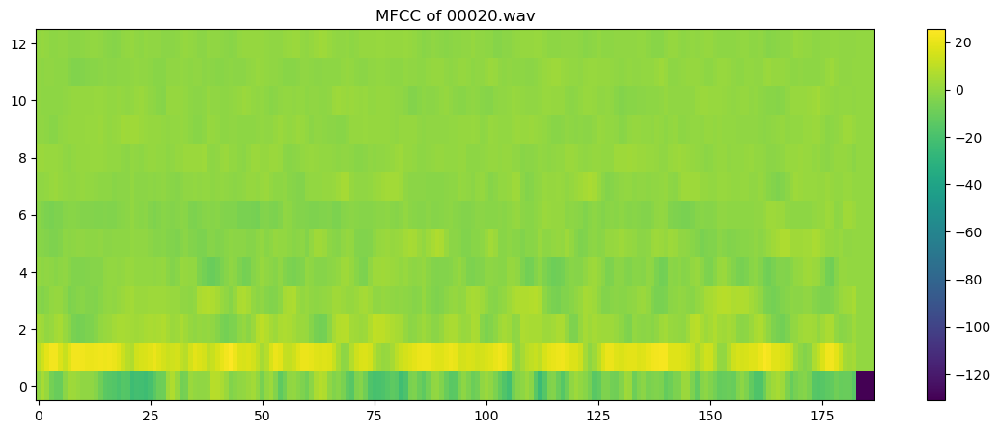

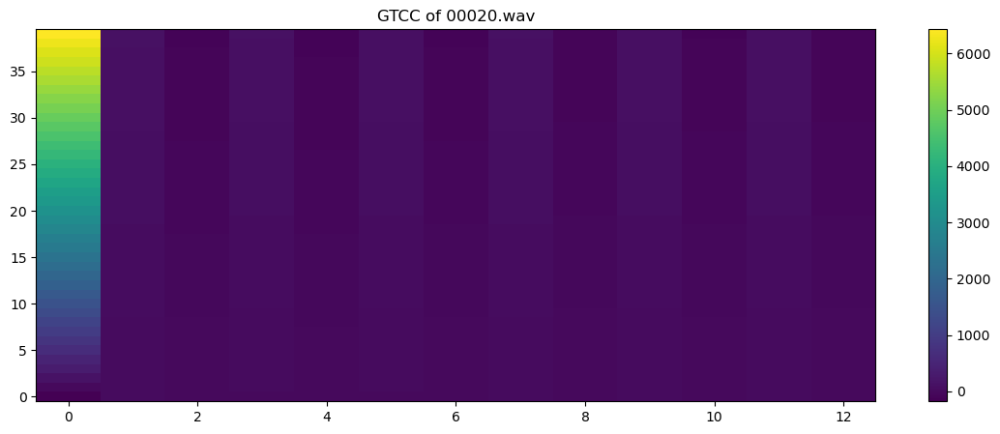

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00020.wav
	ZCR: [0.10302734 0.04199219 0.03955078 0.0546875  0.06347656 0.07324219
 0.07958984 0.07324219 0.07324219 0.07128906 0.06982422 0.06445312
 0.05664062 0.046875   0.03857422 0.03857422 0.04882812 0.07421875
 0.07128906 0.06835938 0.05810547 0.02978516 0.03271484 0.03222656
 0.02734375 0.02783203 0.03564453 0.03662109 0.05664062 0.08789062
 0.12304688 0.13378906 0.11572266 0.09472656 0.06103516 0.06347656
 0.07128906 0.07177734 0.07275391 0.06738281 0.06689453 0.06738281
 0.06054688 0.05566406 0.05566406 0.05175781 0.08056641 0.16796875
 0.20263672 0.20849609 0.17871094 0.08251953 0.04443359 0.03710938
 0.03808594 0.046875   0.04589844 0.04541016 0.046875   0.05957031
 0.0703125  0.07421875 0.07080078 0.06201172 0.13867188 0.22607422
 0.23583984 0.25146484 0.17480469 0.08691406 0.07617188 0.05029297
 0.08935547 0.14306641 0.20751953 0.28222656 0.25488281 0.20019531
 0.13427734 0.06445312 0.04443359 0.04052734 0.03759766 0.

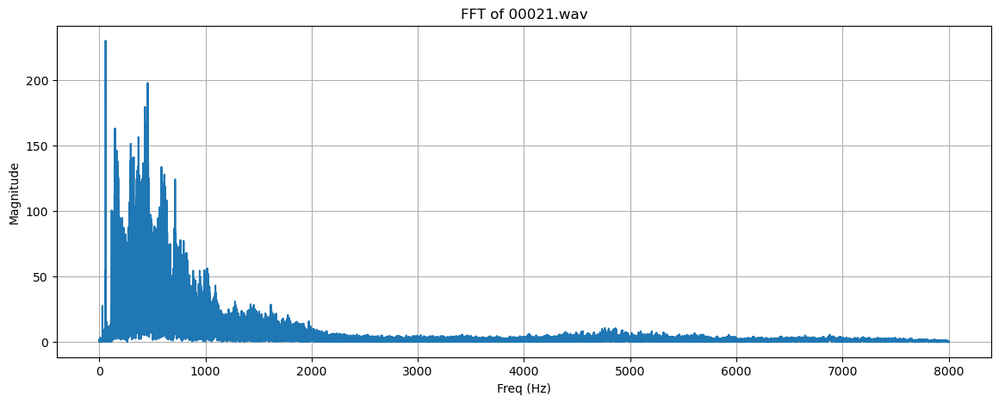

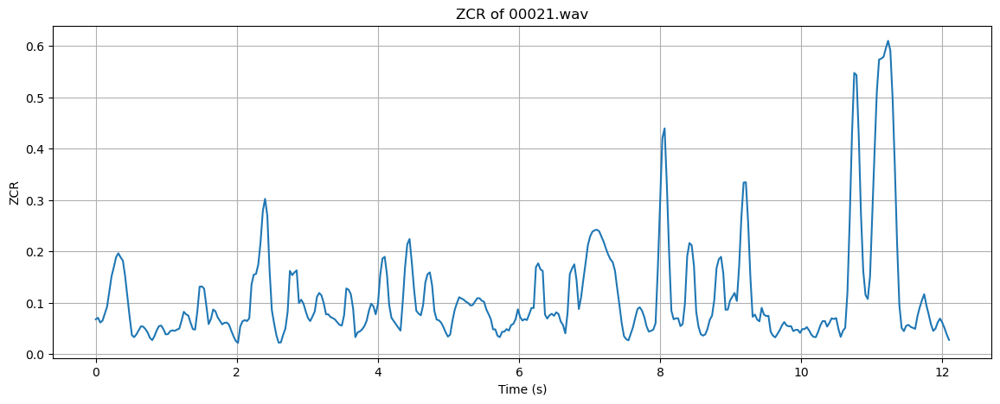

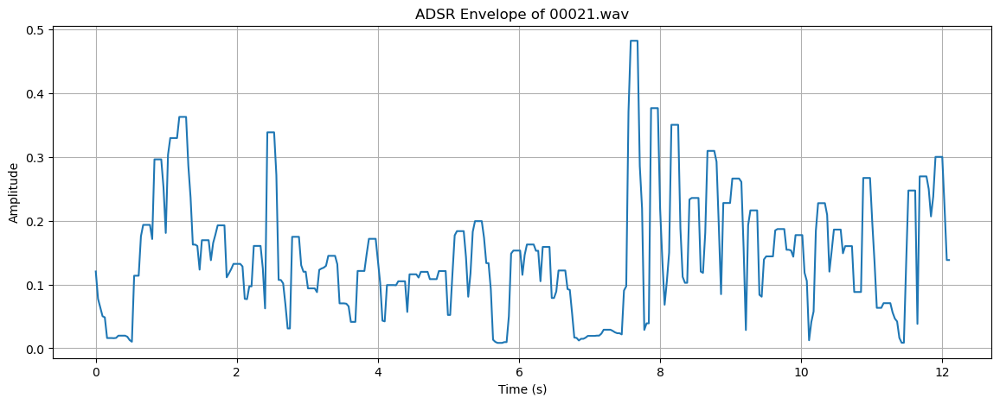

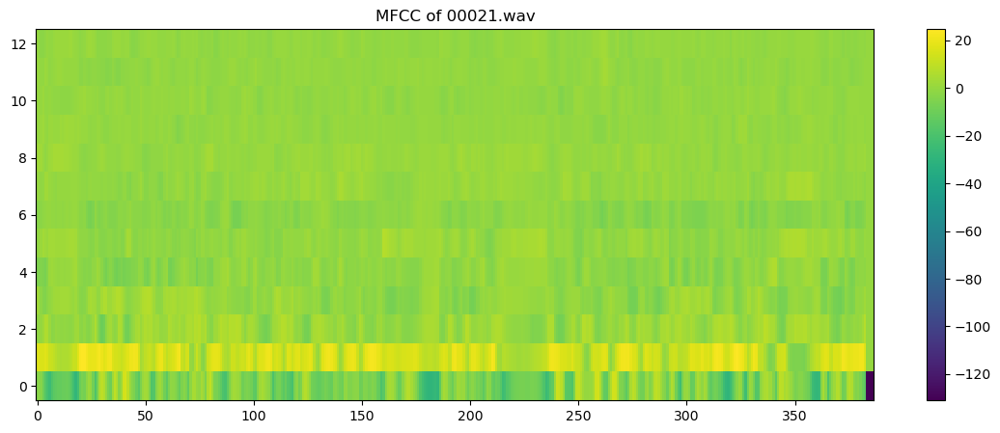

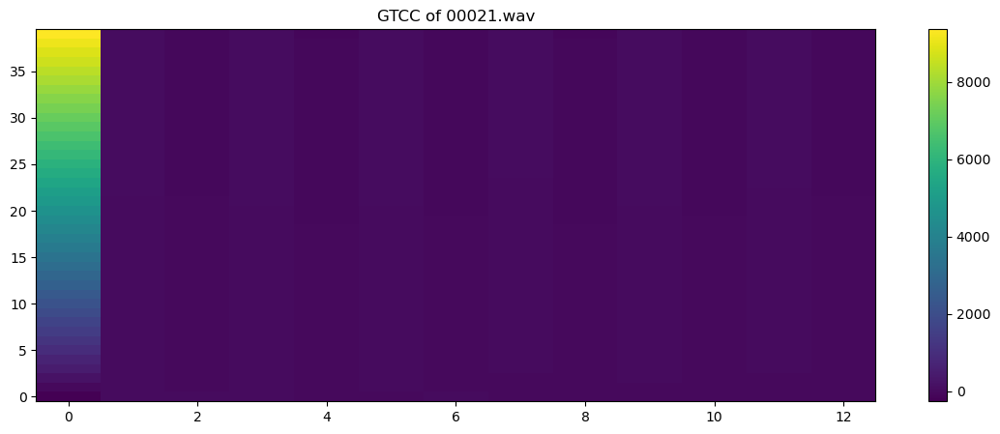

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00021.wav
	ZCR: [0.06787109 0.07080078 0.06152344 0.06542969 0.07861328 0.09228516
 0.12255859 0.15185547 0.16943359 0.18896484 0.19628906 0.18847656
 0.18212891 0.15185547 0.11279297 0.07275391 0.03710938 0.03320312
 0.03857422 0.04638672 0.05419922 0.05371094 0.04882812 0.04199219
 0.03173828 0.02734375 0.03515625 0.04638672 0.0546875  0.05566406
 0.04833984 0.03857422 0.0390625  0.04492188 0.04638672 0.04541016
 0.04785156 0.04980469 0.06494141 0.08251953 0.07763672 0.07519531
 0.06103516 0.04882812 0.04785156 0.08349609 0.13134766 0.13183594
 0.12744141 0.09375    0.05859375 0.06835938 0.08691406 0.08349609
 0.07177734 0.06494141 0.05810547 0.06103516 0.06152344 0.05761719
 0.04589844 0.03515625 0.02587891 0.02197266 0.05371094 0.06396484
 0.06640625 0.06445312 0.06982422 0.13574219 0.15478516 0.15625
 0.17480469 0.21826172 0.27832031 0.30224609 0.26953125 0.16308594
 0.0859375  0.06005859 0.03710938 0.02246094 0.02294922 0.037

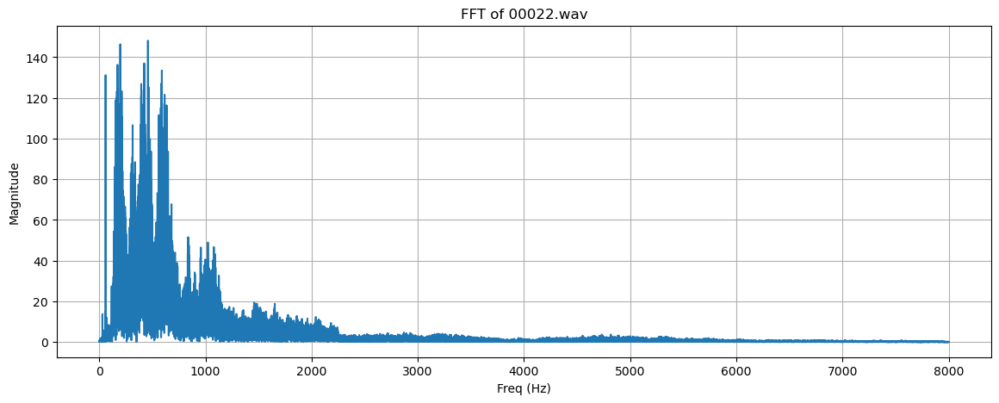

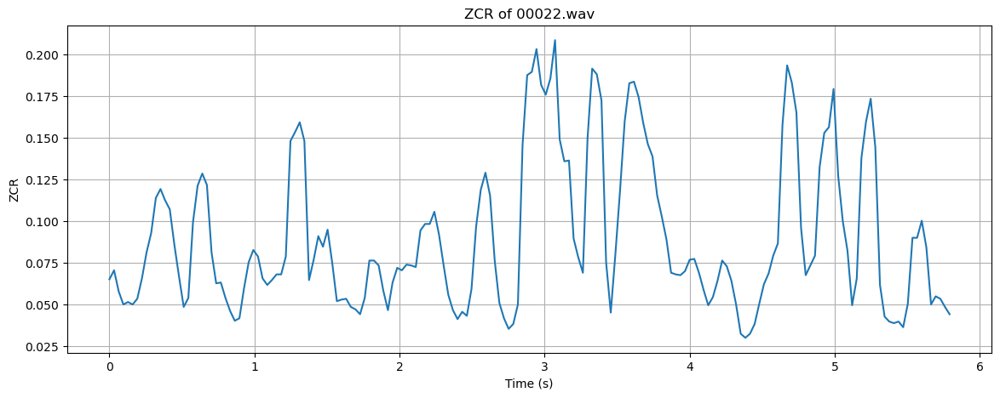

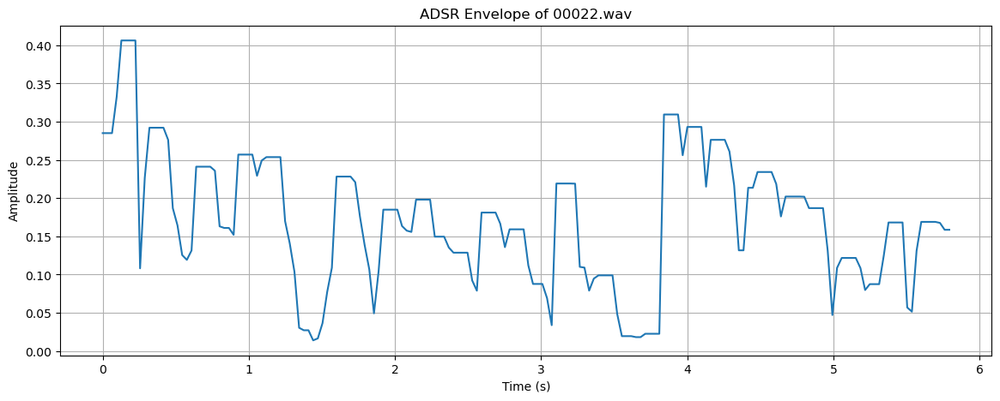

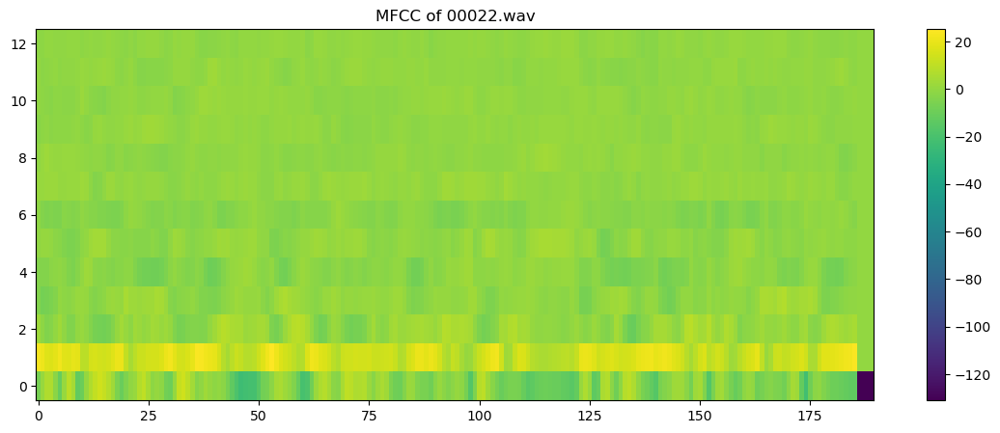

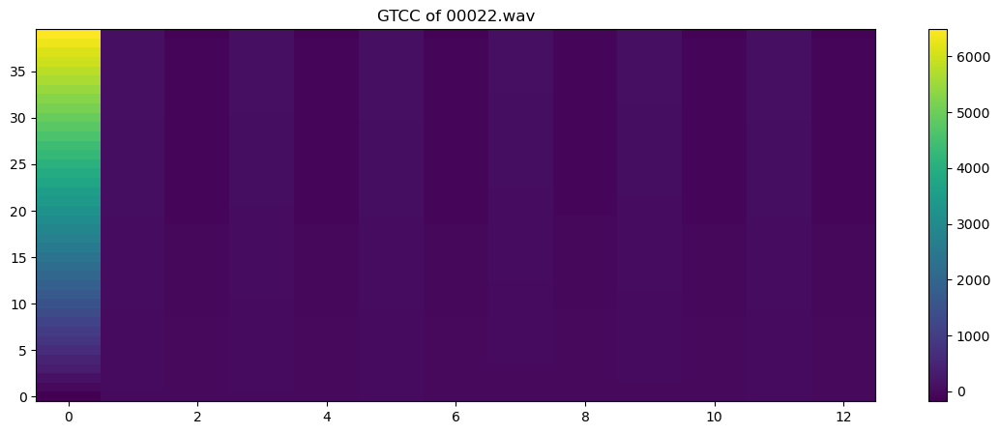

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00022.wav
	ZCR: [0.06494141 0.0703125  0.05761719 0.04980469 0.05126953 0.04980469
 0.05322266 0.06542969 0.08105469 0.09277344 0.11376953 0.11914062
 0.11230469 0.10693359 0.08544922 0.06640625 0.04833984 0.05371094
 0.09912109 0.12109375 0.12841797 0.12158203 0.08105469 0.0625
 0.06298828 0.05371094 0.04589844 0.04003906 0.04150391 0.05957031
 0.07519531 0.08251953 0.07861328 0.06542969 0.06152344 0.06445312
 0.06787109 0.06787109 0.07861328 0.14794922 0.15332031 0.15917969
 0.14794922 0.06445312 0.07666016 0.09082031 0.08447266 0.09472656
 0.07470703 0.05175781 0.05273438 0.05322266 0.04833984 0.046875
 0.04394531 0.05371094 0.07617188 0.07617188 0.07324219 0.05810547
 0.04638672 0.06298828 0.07177734 0.0703125  0.07373047 0.07324219
 0.07226562 0.09423828 0.09814453 0.09814453 0.10546875 0.09179688
 0.07324219 0.05566406 0.04638672 0.04101562 0.04541016 0.04296875
 0.05908203 0.09667969 0.11865234 0.12890625 0.11523438 0.076171

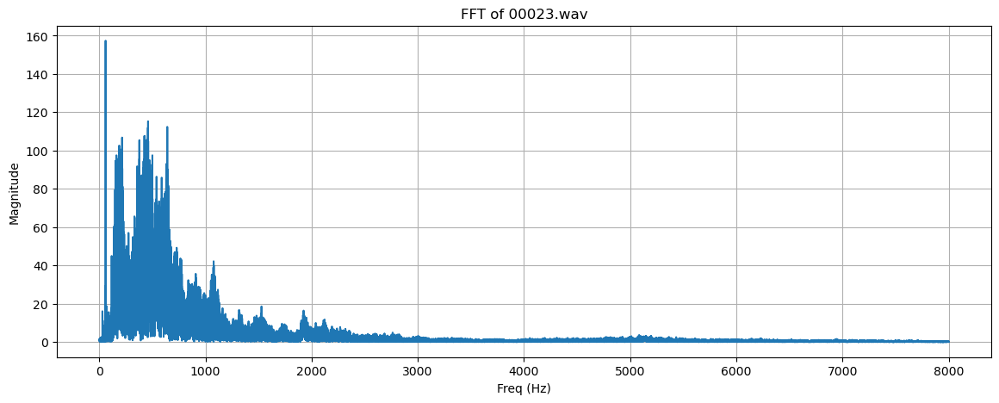

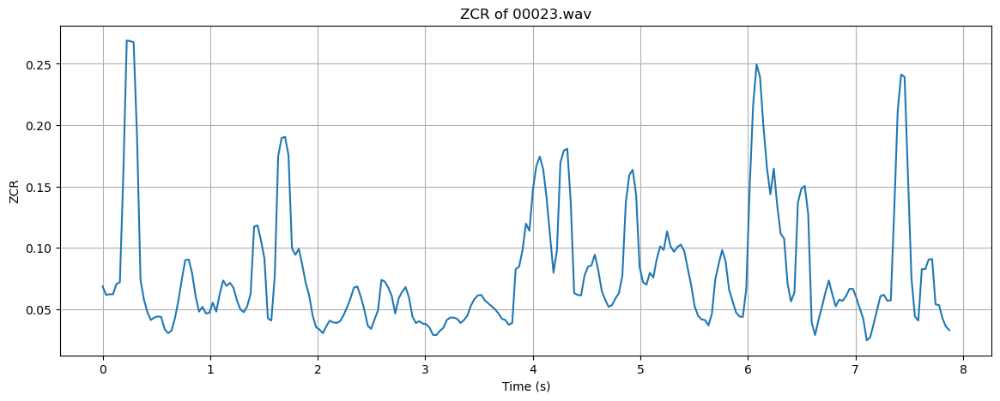

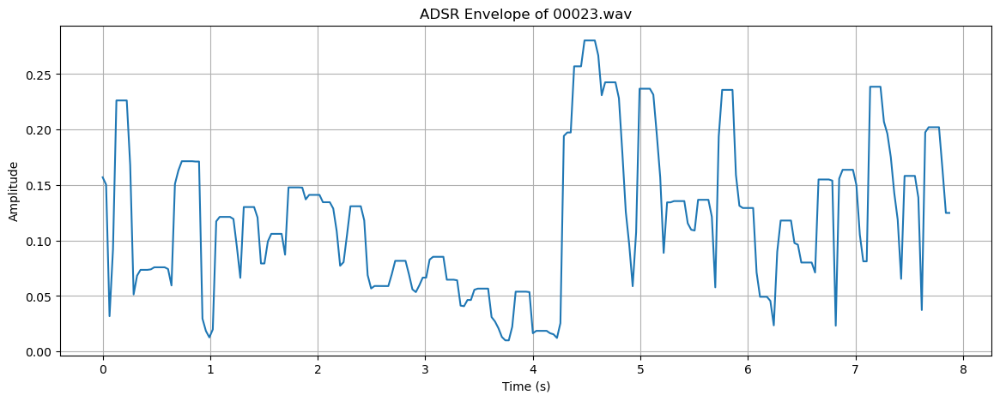

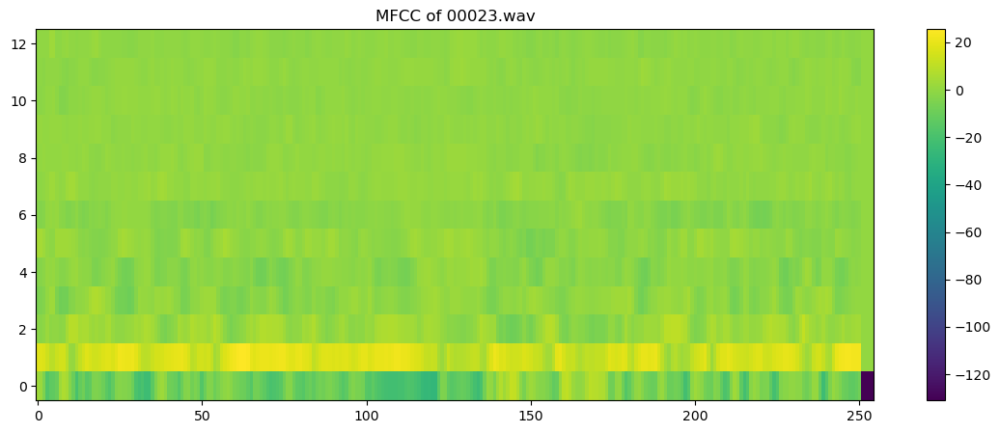

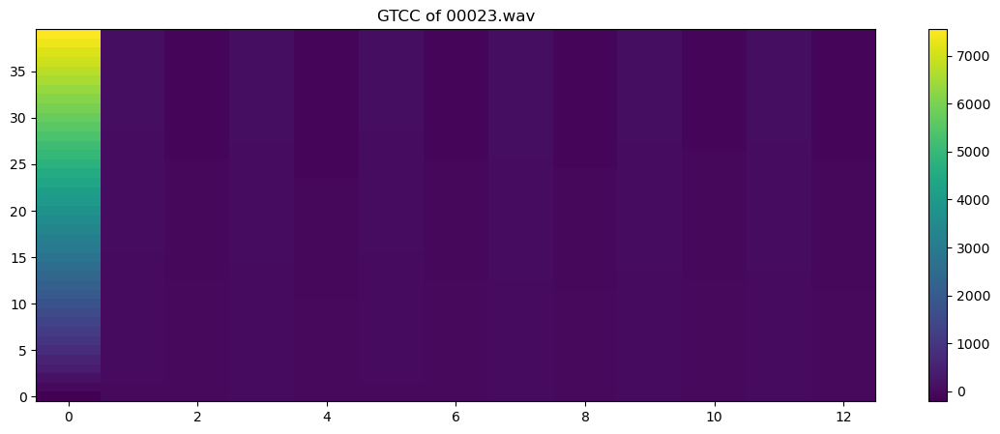

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00023.wav
	ZCR: [0.06835938 0.06152344 0.06201172 0.06201172 0.0703125  0.07177734
 0.15917969 0.26904297 0.26855469 0.26757812 0.18945312 0.07373047
 0.05761719 0.04736328 0.04101562 0.04296875 0.04394531 0.04345703
 0.03369141 0.03027344 0.03222656 0.04248047 0.05664062 0.07421875
 0.08984375 0.09033203 0.07910156 0.06054688 0.04785156 0.05175781
 0.04638672 0.046875   0.05517578 0.04785156 0.06201172 0.07324219
 0.06884766 0.07128906 0.06738281 0.05712891 0.04980469 0.04736328
 0.05224609 0.0625     0.1171875  0.11816406 0.10595703 0.09130859
 0.04248047 0.04052734 0.07666016 0.17480469 0.18945312 0.19042969
 0.17529297 0.09960938 0.09423828 0.09912109 0.0859375  0.07128906
 0.06103516 0.04492188 0.03515625 0.03320312 0.03027344 0.03613281
 0.04052734 0.0390625  0.03857422 0.04003906 0.04492188 0.05126953
 0.05859375 0.06738281 0.06835938 0.06005859 0.04980469 0.03662109
 0.03369141 0.04150391 0.04882812 0.07373047 0.07226562 0.

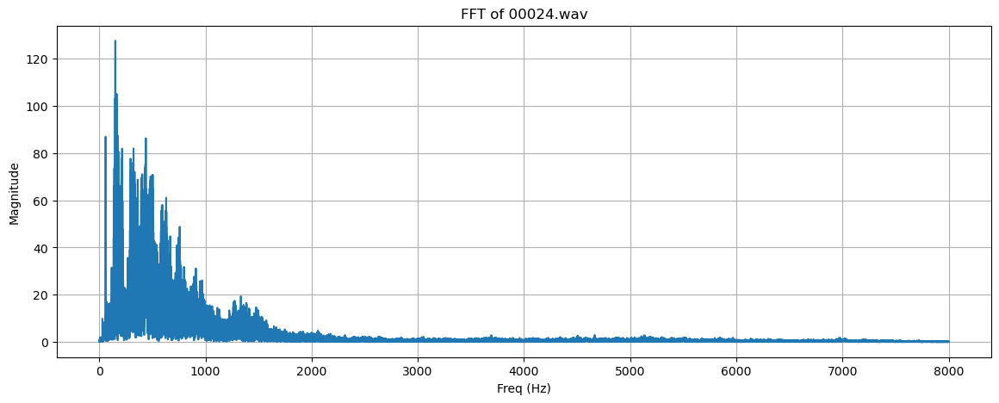

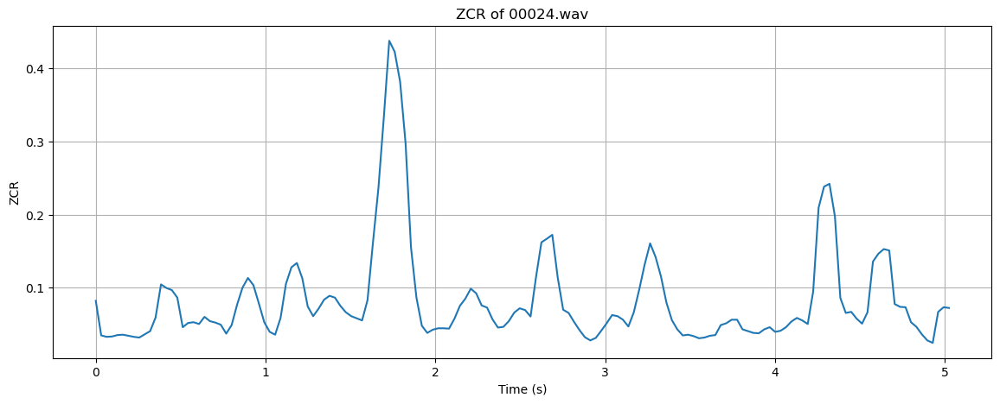

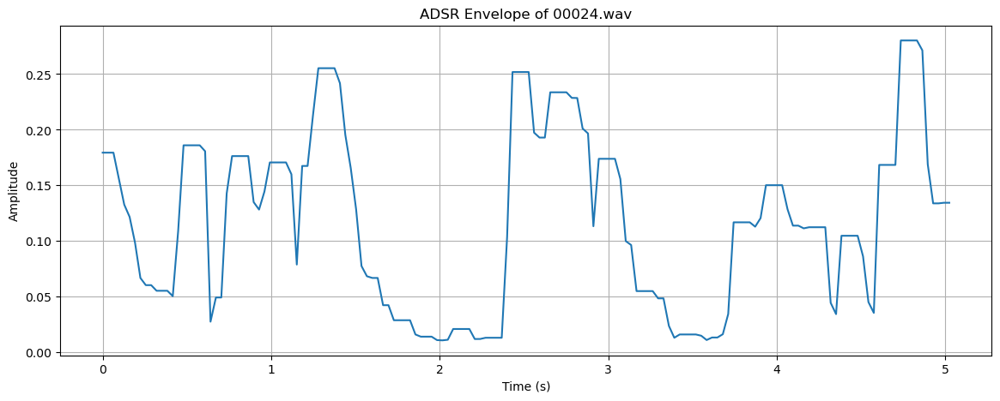

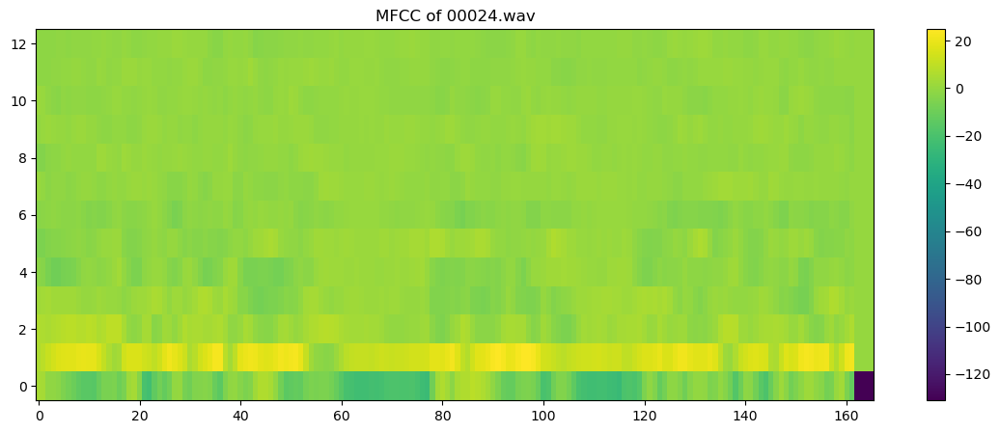

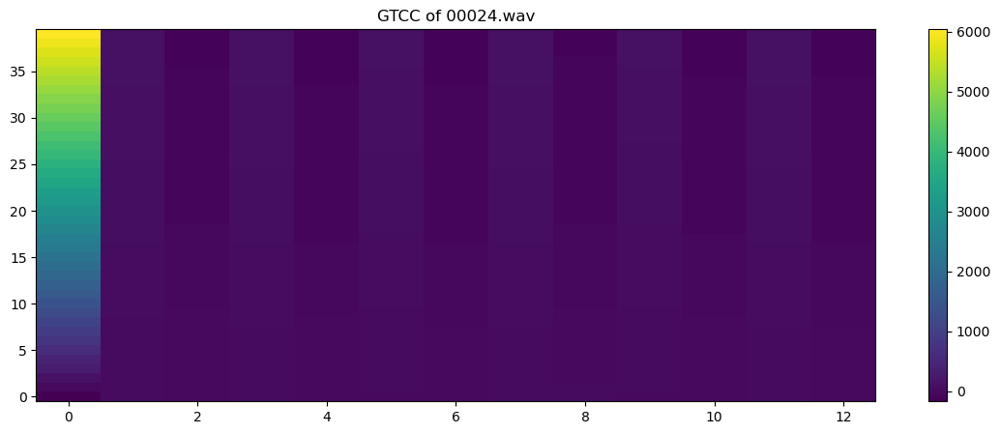

	processed: ../SpeakerVerification\id10270\8jEAjG6SegY\00024.wav
	ZCR: [0.08203125 0.03466797 0.03271484 0.03320312 0.03515625 0.03564453
 0.03417969 0.03271484 0.03173828 0.03613281 0.04052734 0.05908203
 0.10449219 0.09960938 0.09667969 0.08642578 0.04589844 0.05175781
 0.05273438 0.05029297 0.06005859 0.05419922 0.05224609 0.04931641
 0.03710938 0.04882812 0.07666016 0.10009766 0.11328125 0.10351562
 0.07861328 0.05273438 0.03955078 0.03564453 0.05859375 0.10546875
 0.12792969 0.13378906 0.11279297 0.07421875 0.06103516 0.07128906
 0.08349609 0.08886719 0.08642578 0.07519531 0.06640625 0.06103516
 0.05810547 0.05517578 0.08300781 0.16162109 0.23583984 0.33300781
 0.43798828 0.42285156 0.38183594 0.29785156 0.15527344 0.08642578
 0.04785156 0.03808594 0.04248047 0.04443359 0.04443359 0.04394531
 0.05761719 0.07519531 0.08496094 0.09863281 0.09228516 0.07568359
 0.07275391 0.05664062 0.04541016 0.04638672 0.05419922 0.06591797
 0.07177734 0.06933594 0.06054688 0.11425781 0.16210938 0.

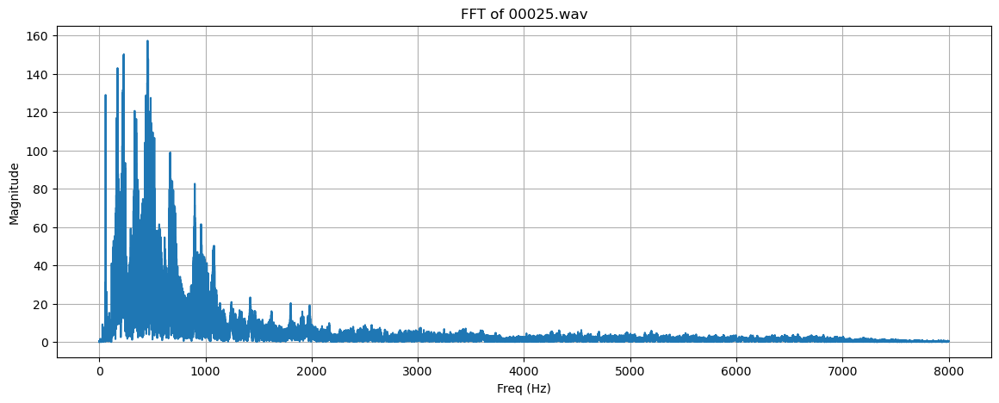

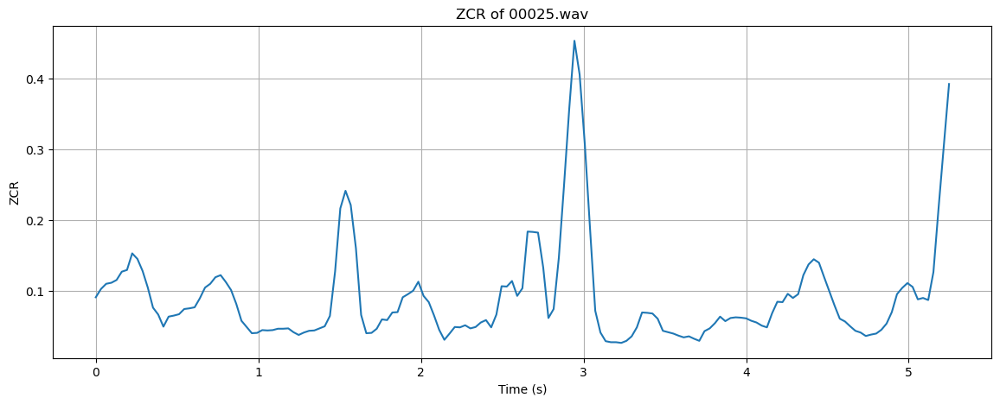

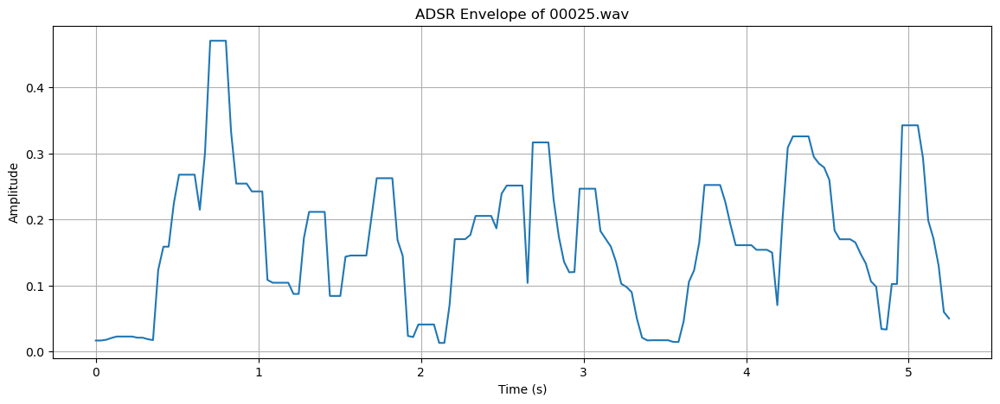

In [ ]:
for dir_path, dir_names, file_names in os.walk(root_folder):
    for dir_name in dir_names:
        person_dir = os.path.join(dir_path, dir_name)

        file_paths = [os.path.join(person_dir, file) for file in os.listdir(person_dir) if file.endswith('.wav')]

        for file_path in file_paths:
            process_frame(file_path)